# coil scan analysis

In [1]:
from matplotlib import pyplot as plt
import csv
import numpy as np
import os
import PIL # for reading tif images
import h5py

def get_max_idx(data):
    """return max value and corresponding index for 1d data"""
    maxdat = 0
    maxidx = 0
    for i,dat in enumerate(data):
        if dat > maxdat:
            maxdat = dat
            maxidx = i
    return maxdat, maxidx

# no longer exists as of 2023.09. the csv data should be in the same folder as the hdf5 file generated by the experiment
# expdir = "C:\\Networking Experiment\\artiq codes\\artiq-master\\repository\\qn_artiq_routines\\analysis\\csv_data\\"

results = 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\'

## CSV Analysis

### 2023.11.14-15

In [2]:
"""
possible loading events:
"""
date_str = "2023-11-13"
h5_file = h5py.File(os.path.join(results,date_str,"17","000007533-CoilScanSPCMCount.h5"))
datafile = os.path.join(results,date_str,"17","20231113_172012_coil_scan.csv")

date_str = "2023-11-14"
# h5_file = h5py.File(os.path.join(results,date_str,"17","000007533-CoilScanSPCMCount.h5")) # no h5 file for this because Windows restarted
datafile = os.path.join(results,date_str,"17","20231114_173655_coil_scan.csv")


# [x for x in h5_file.values()]

In [64]:
# experiment variables defined by the experiment, e.g. in the GUI (such as the coil steps) or by subroutines (such as the MOT monitor datasets)
# [x for x in h5_file['datasets'].values()]

In [65]:
# experiment variables defined in ExperimentVariables
# [x for x in h5_file['archive'].values()]

In [3]:
fort_on = np.single(h5_file['datasets']['FORT_on'])
fort_on_str = 'FORT_on' if fort_on else 'FORT_off' # for file saving
print(fort_on_str)

FORT_on


In [4]:
t_exp = np.single(h5_file['archive']['t_SPCM_exposure']) # numpy's float datatype 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [6]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [7]:
### nrows and ncols are the number of subplots in each image
nrows = 3
ncols = 4
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [8]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

144

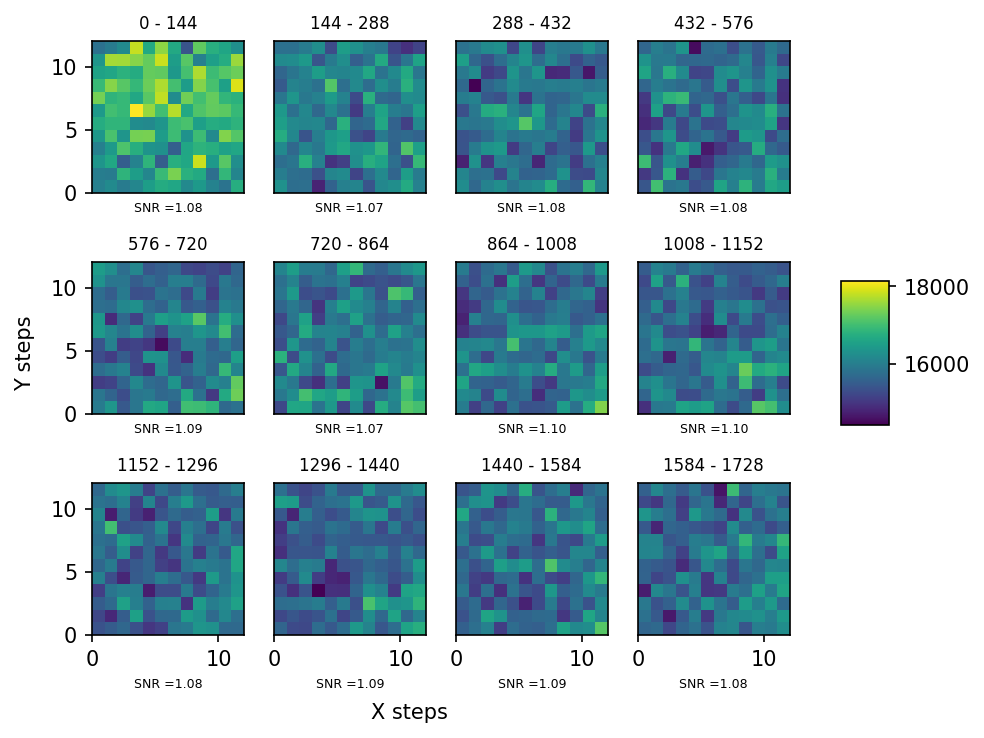

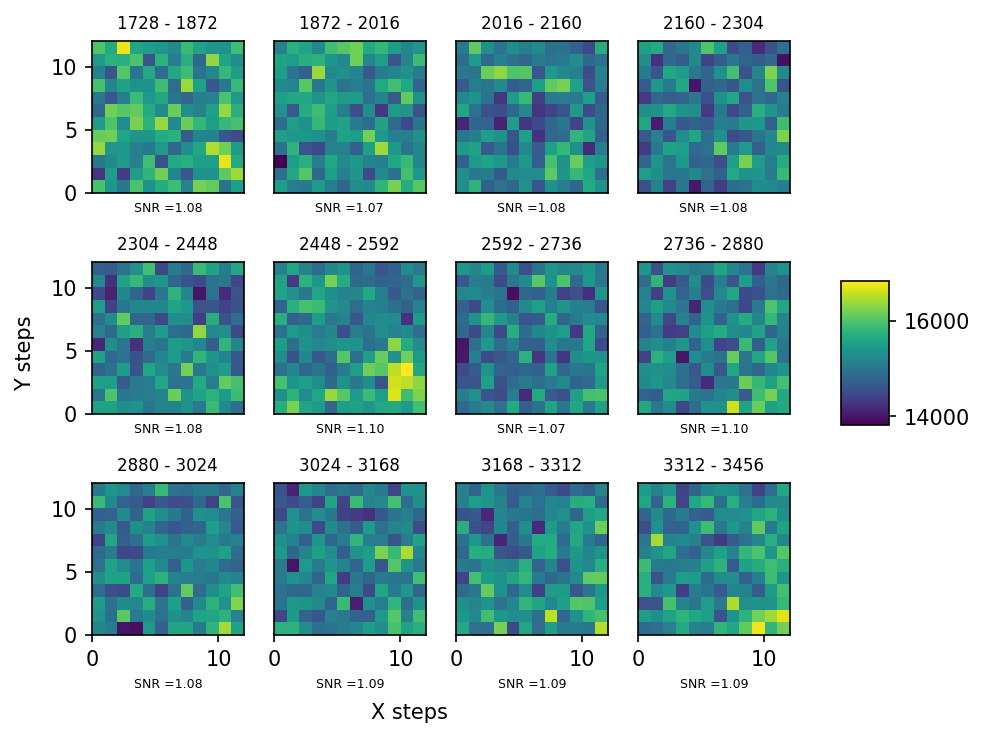

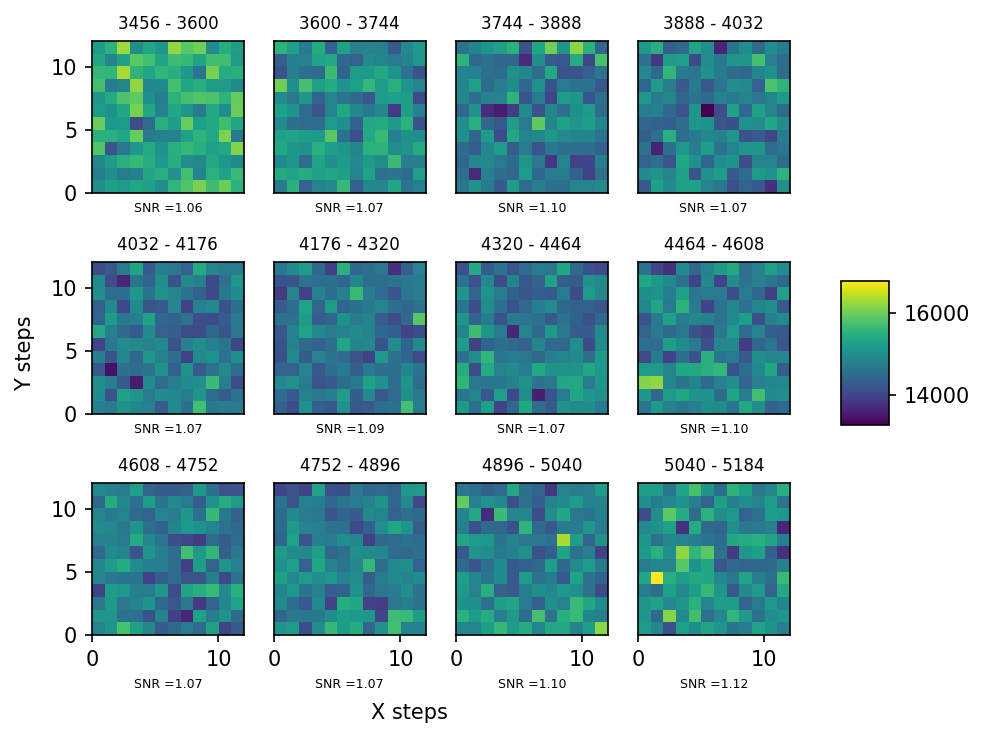

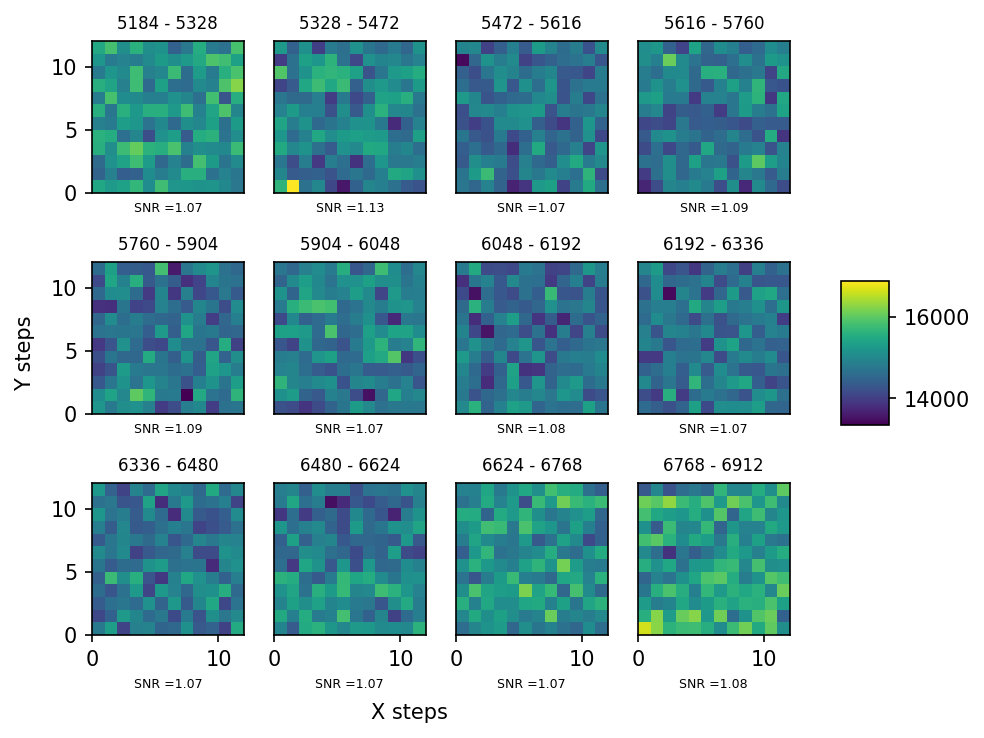

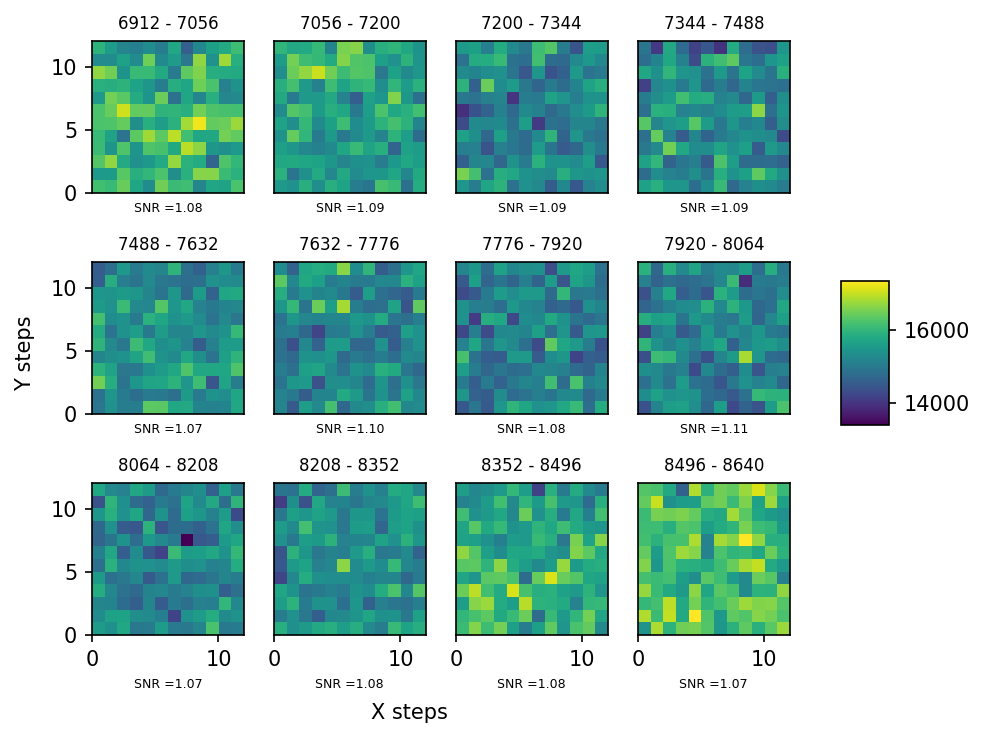

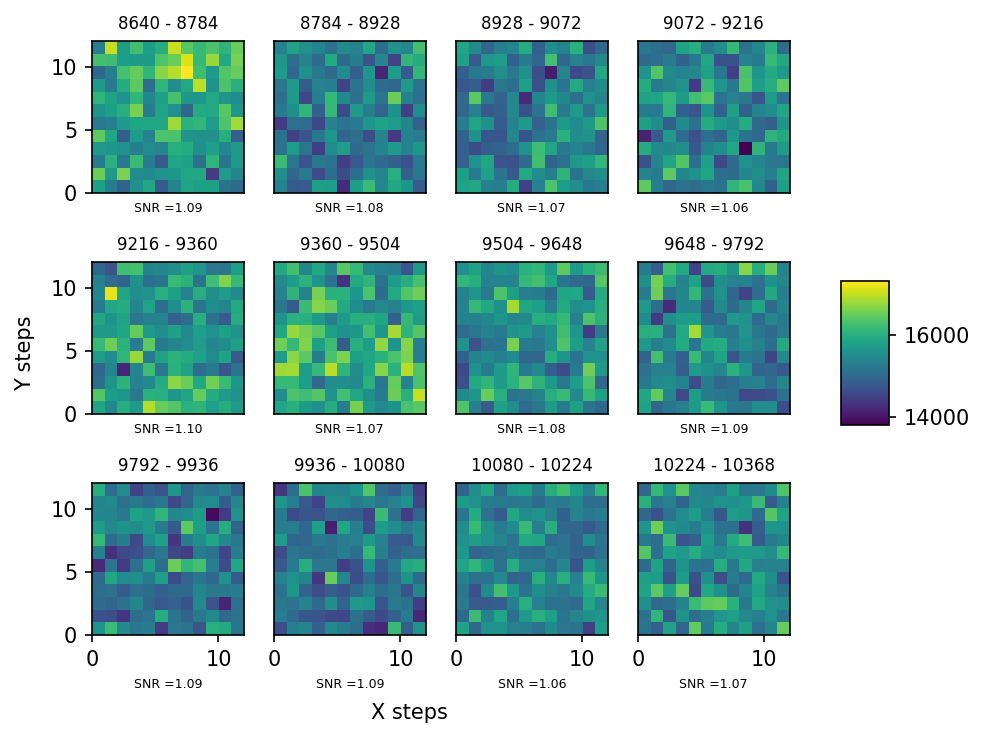

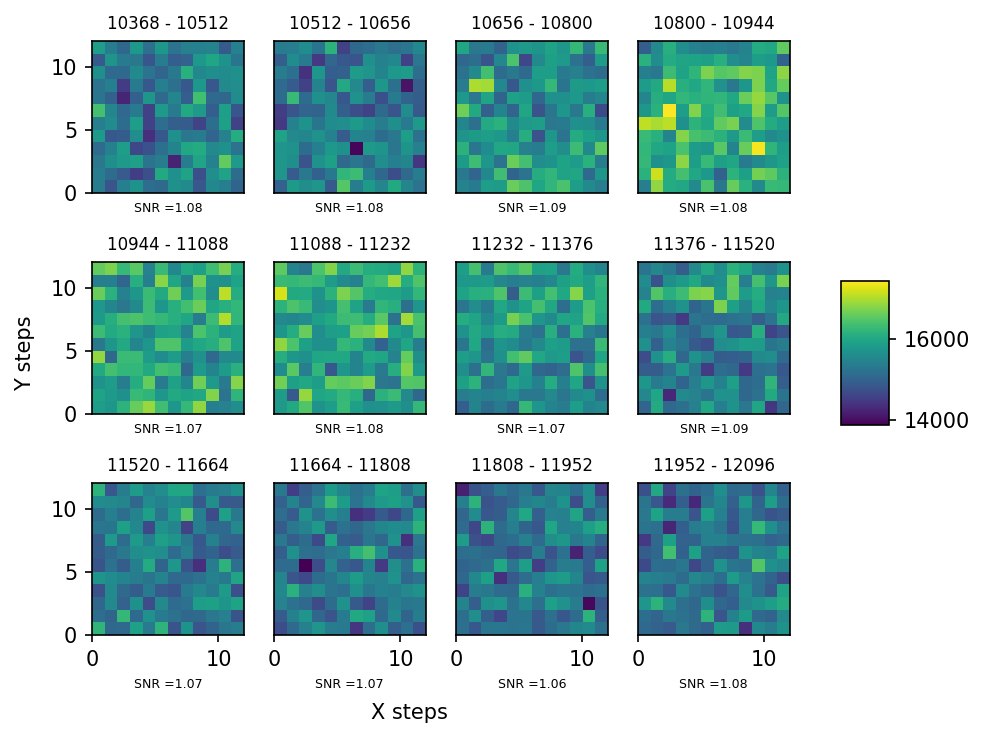

ValueError: cannot reshape array of size 36 into shape (12,12)

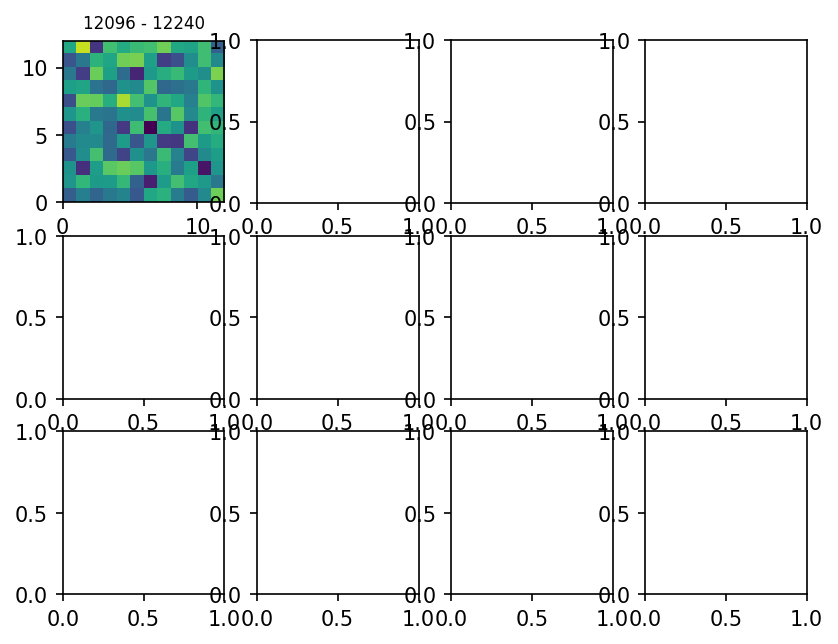

In [9]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols,dpi = 150)#,constrained_layout=True)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        figdata = counts[ysteps*xsteps*zbottom_steps*k:ysteps*xsteps*zbottom_steps*k+nrows*ncols*xsteps*ysteps] # this is the data that spans the whole figure
        
        # raw, unscaled data
        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=min(figdata), vmax=max(figdata)) #, vmin=mincounts, vmax=maxcounts)
        snr = np.max(imdata)/np.mean(imdata)
        ax.set_xlabel(f"SNR ={snr:.2f}",fontsize=6)
        
        # scaled/offset data
        # scaled = imdata/np.mean(imdata) # this essentially shows us what the signal is
        # im = ax.imshow(scaled, extent=[ymin, ymax, xmin, xmax]) #vmin=mincounts, vmax=maxcounts)
        
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.4, 0.05, 0.2])
    plt.colorbar(im, cax=cbar_ax)
    # fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
        # plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
        # plt.close()
    plt.show()

#     break

maxidx=365, maxct=17159.999744296078, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.695396373401989, 8.141519775390625, -0.057475408380681825, -0.28993621271306813)


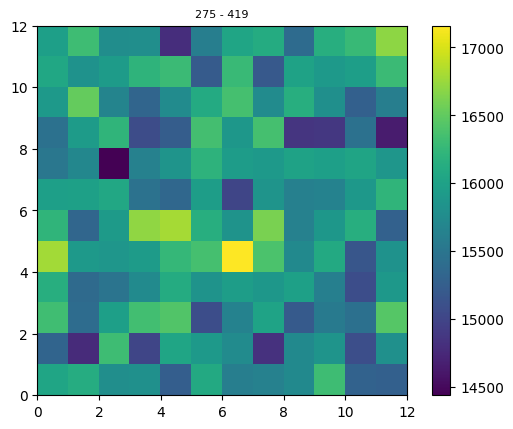

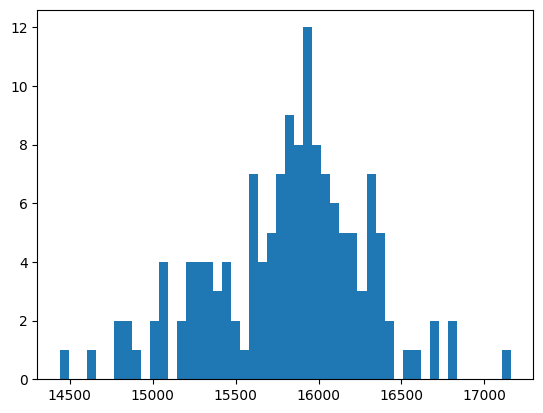

In [10]:
# local max for a given step range
step0 = 275 #125 # 11700

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax])#, vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)
plt.show()
plt.hist(imdata.flatten(),bins=50)
plt.show()

In [62]:
np.max(counts),np.argmax(counts)

(20700.000462681066, 392)

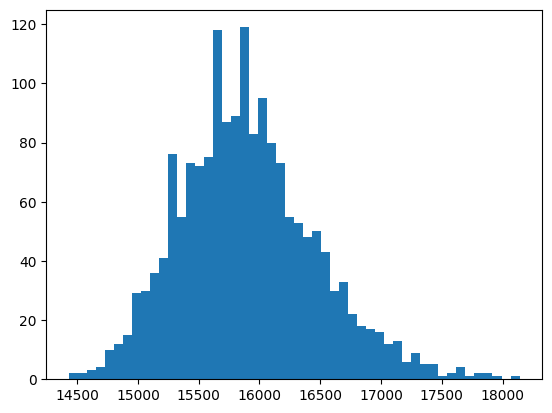

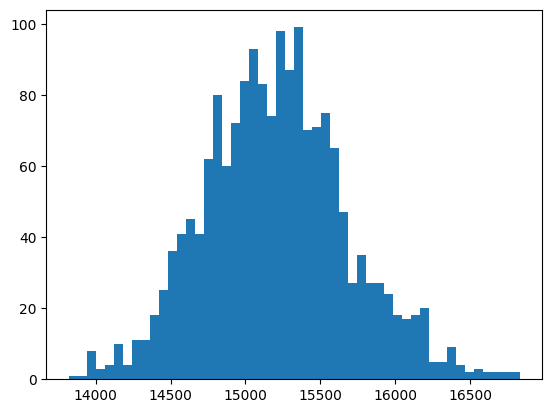

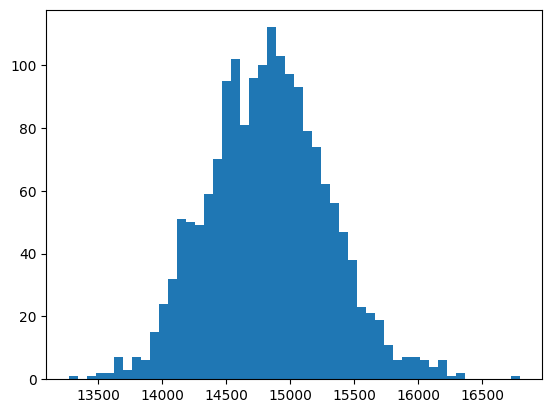

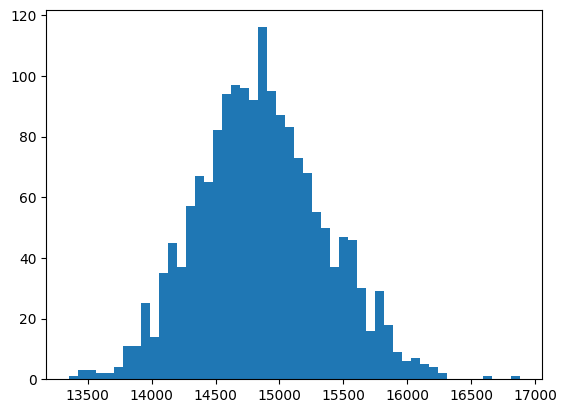

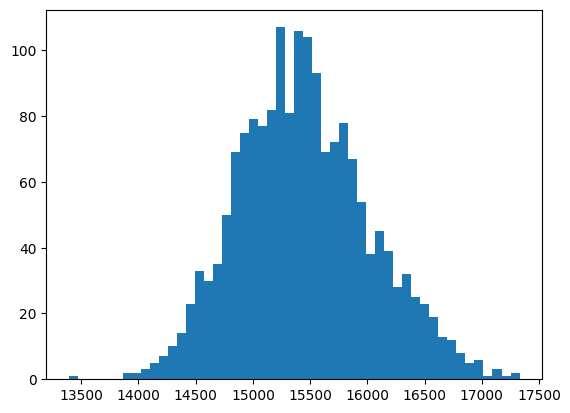

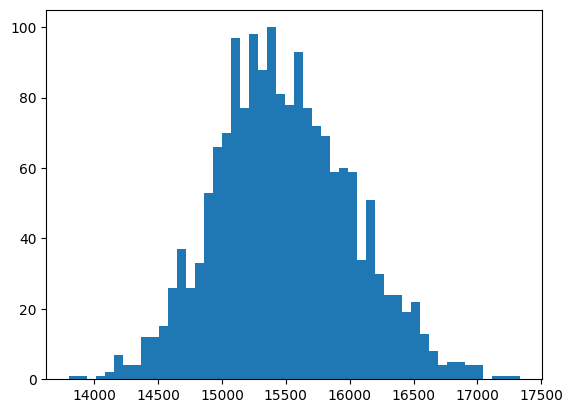

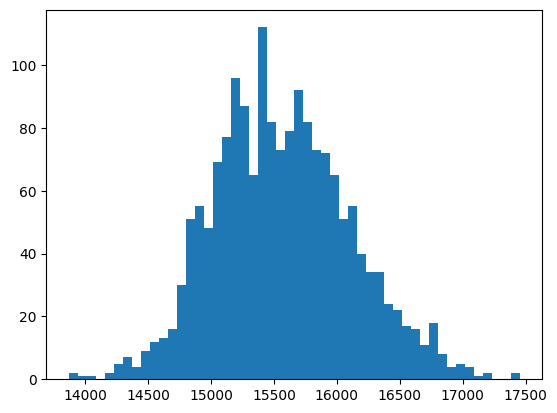

In [11]:
for i in range(int(len(counts)/(nrows*ncols*xsteps*ysteps))):
    plt.hist(counts[i*nrows*ncols*xsteps*ysteps:nrows*ncols*xsteps*ysteps*(i+1)],bins=50)
    plt.show()

### 2023.11.13

In [63]:
"""
possible loading events:
maxidx=132, maxct=25600.000572204604, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.724, 8.11, 0.423, -0.186)

maxidx=284, maxct=25000.000558793556, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.774, 8.16, 0.423, -0.086)
"""
date_str = "2023-11-13"
h5_file = h5py.File(os.path.join(results,date_str,"11","000007499-CoilScanSPCMCount.h5"))
datafile = os.path.join(results,date_str,"11","20231113_112625_coil_scan.csv")

# no clear atom signal here either.
# date_str = "2023-11-13"
# h5_file = h5py.File(os.path.join(results,date_str,"10","000007488-CoilScanSPCMCount.h5"))
# datafile = os.path.join(results,date_str,"10","20231113_101525_coil_scan.csv")

"""
possibly one atom loading event:
maxidx=11869, maxct=26400.000590085998, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.437744140625, 7.7683426339285715, 0.05790318080357143, -0.47097865513392856)
"""
# date_str = "2023-11-11"
# h5_file = h5py.File(os.path.join(results,date_str,"12","000007482-CoilScanSPCMCount.h5"))
# datafile = os.path.join(results,date_str,"12","20231111_125721_coil_scan.csv")

# [x for x in h5_file.values()]

'\npossibly one atom loading event:\nmaxidx=11869, maxct=26400.000590085998, Vpd=9.99969482421875\ncoil VZbottom, VZtop, VX, VY = (7.437744140625, 7.7683426339285715, 0.05790318080357143, -0.47097865513392856)\n'

In [64]:
# experiment variables defined by the experiment, e.g. in the GUI (such as the coil steps) or by subroutines (such as the MOT monitor datasets)
# [x for x in h5_file['datasets'].values()]

In [65]:
# experiment variables defined in ExperimentVariables
# [x for x in h5_file['archive'].values()]

In [66]:
fort_on = np.single(h5_file['datasets']['FORT_on'])
fort_on_str = 'FORT_on' if fort_on else 'FORT_off' # for file saving
print(fort_on_str)

FORT_on


In [67]:
t_exp = np.single(h5_file['archive']['t_SPCM_exposure']) # numpy's float datatype 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [68]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [69]:
### nrows and ncols are the number of subplots in each image
nrows = 1
ncols = 5
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [70]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

25

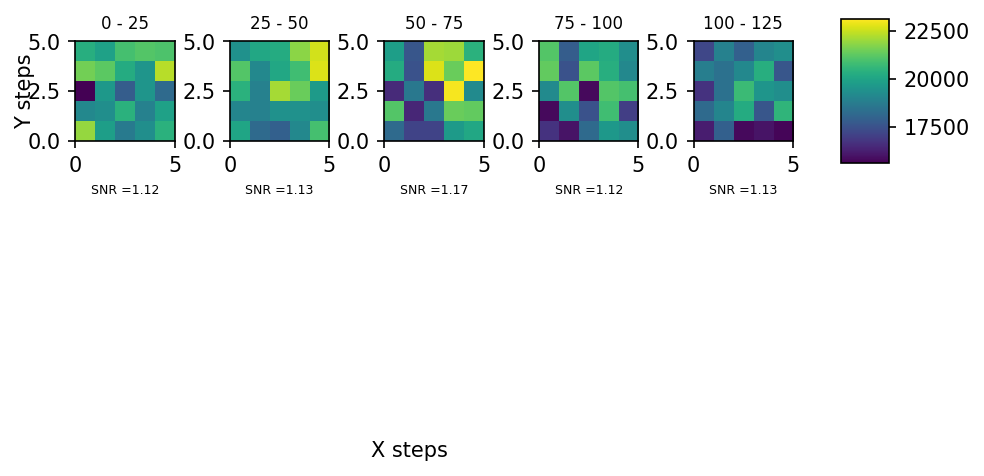

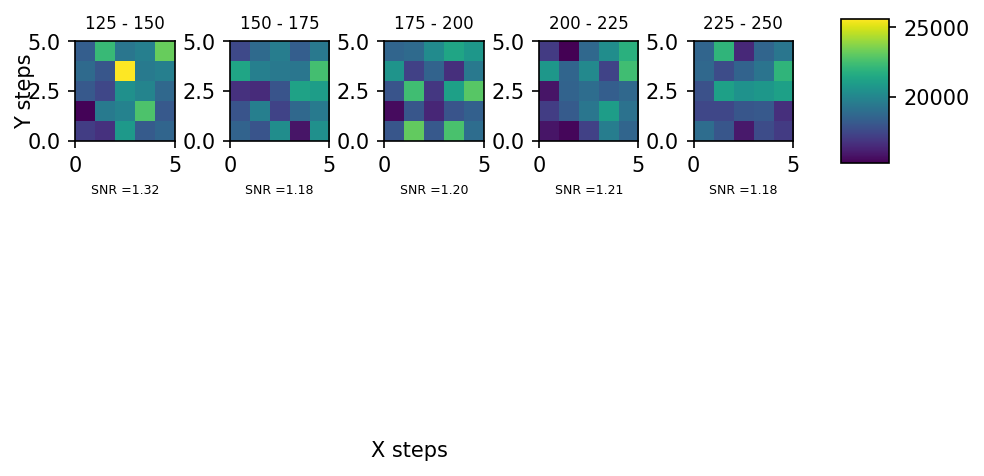

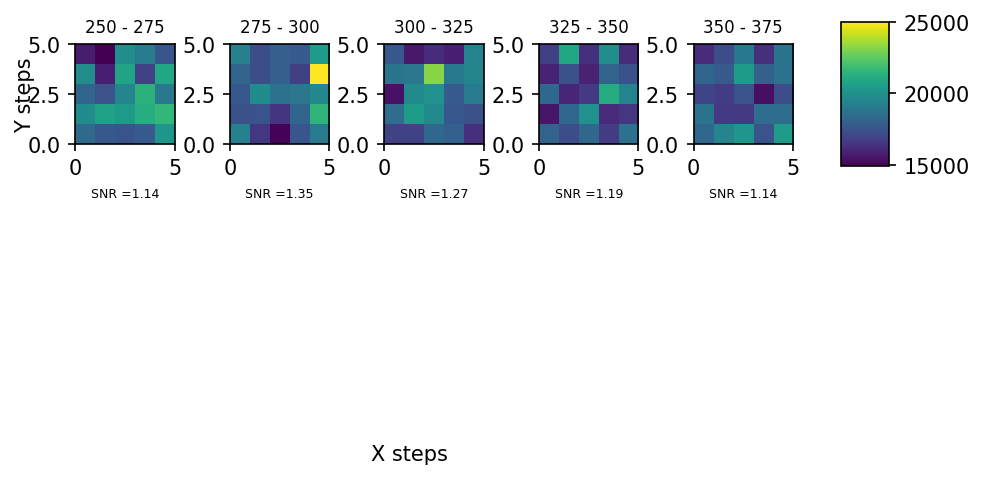

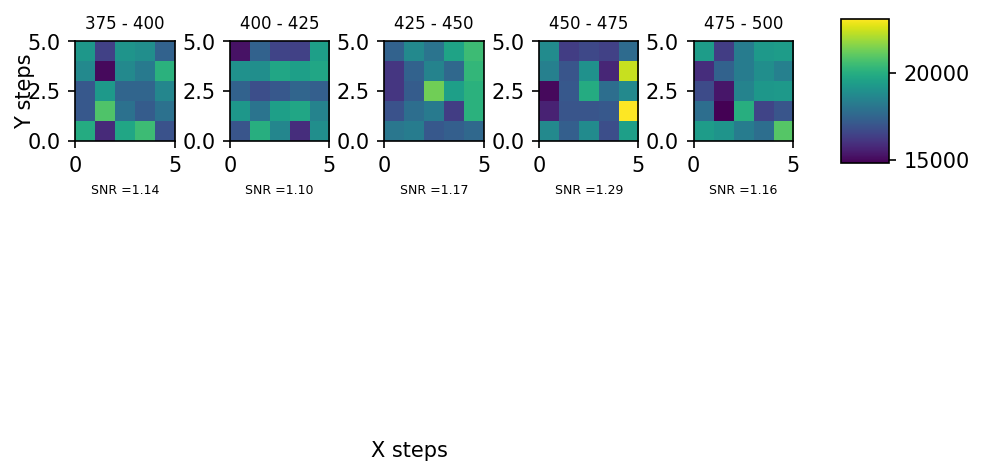

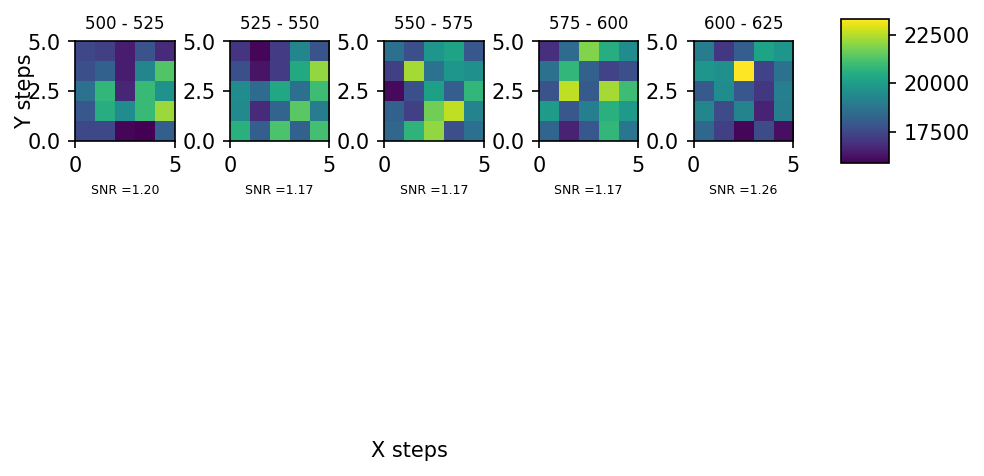

In [71]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols,dpi = 150)#,constrained_layout=True)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        figdata = counts[ysteps*xsteps*zbottom_steps*k:ysteps*xsteps*zbottom_steps*k+nrows*ncols*xsteps*ysteps] # this is the data that spans the whole figure
        
        # raw, unscaled data
        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=min(figdata), vmax=max(figdata)) #, vmin=mincounts, vmax=maxcounts)
        snr = np.max(imdata)/np.mean(imdata)
        ax.set_xlabel(f"SNR ={snr:.2f}",fontsize=6)
        
        # scaled/offset data
        # scaled = imdata/np.mean(imdata) # this essentially shows us what the signal is
        # im = ax.imshow(scaled, extent=[ymin, ymax, xmin, xmax]) #vmin=mincounts, vmax=maxcounts)
        
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.4, 0.05, 0.2])
    plt.colorbar(im, cax=cbar_ax)
    # fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
        # plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
        # plt.close()
    plt.show()

#     break

maxidx=284, maxct=25000.000558793556, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.774, 8.16, 0.423, -0.086)


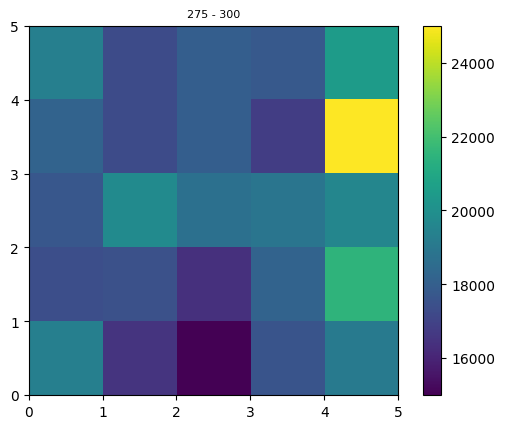

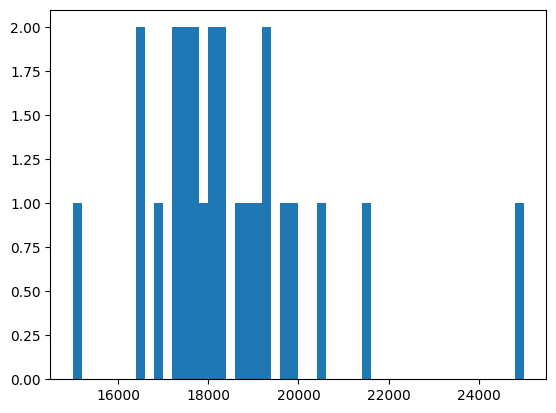

In [74]:
# local max for a given step range
step0 = 275 #125 # 11700

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax])#, vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)
plt.show()
plt.hist(imdata.flatten(),bins=50)
plt.show()

In [62]:
np.max(counts),np.argmax(counts)

(20700.000462681066, 392)

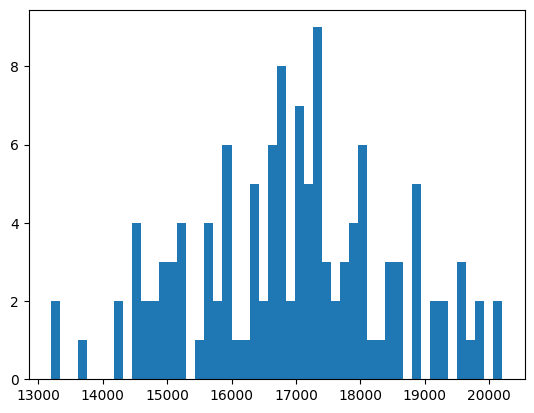

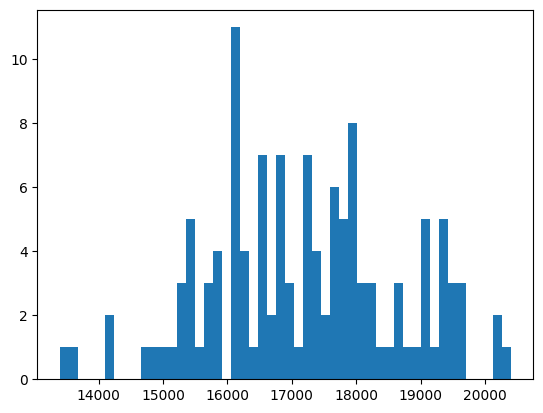

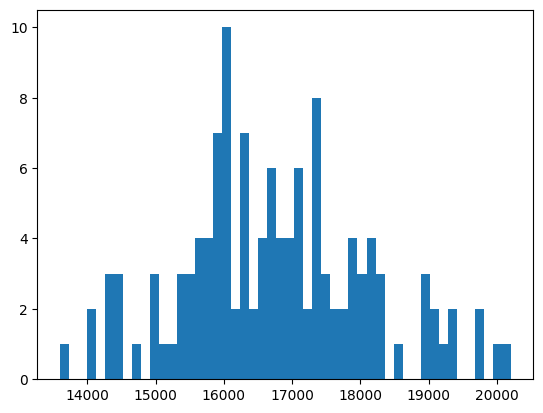

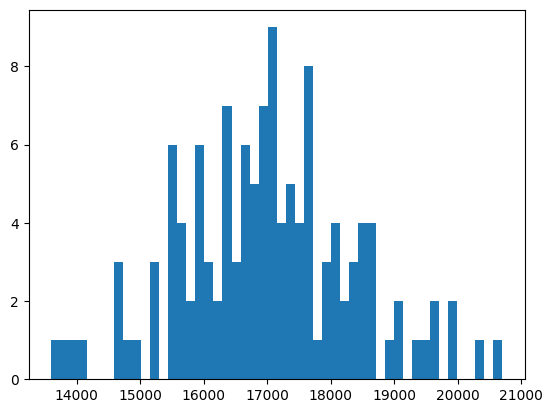

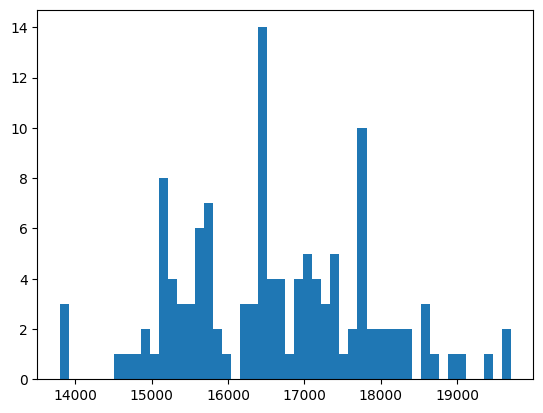

In [61]:
for i in range(int(len(counts)/(nrows*ncols*xsteps*ysteps))):
    plt.hist(counts[i*nrows*ncols*xsteps*ysteps:nrows*ncols*xsteps*ysteps*(i+1)],bins=50)
    plt.show()

### 2023.11.11

In [16]:

"""i aborted the scan in 14 out of  15 outer loop steps, so there is no h5 file.
the scan arrays were: 
Vz_bottom_array = np.linspace(-0.12,0.12,15)
Vz_top_array = np.linspace(-0.12,0.12,15)
Vx_array = np.linspace(-0.3,0.3,15)
Vy_array = np.linspace(-0.3,0.3,15)
the FORT was on, but I see no single atom signal
"""
date_str = "2023-11-10"
h5_file = h5py.File(os.path.join(results,"2023-11-05","16","000007071-CoilScanSPCMCount.h5"))
datafile = os.path.join(results,date_str,"18","20231110_185658_coil_scan.csv")

# repumper came unlocked sometime during this experiment
# date_str = "2023-11-05"
# h5_file = h5py.File(os.path.join(results,date_str,"11","000007070-CoilScanSPCMCount.h5"))
# datafile = os.path.join(results,date_str,"11","20231105_110131_coil_scan.csv")

# repumper came unlocked sometime during this experiment
# date_str = "2023-11-03"
# h5_file = h5py.File(os.path.join(results,date_str,"16","000007052-CoilScanSPCMCount.h5"))
# datafile = os.path.join(results,date_str,"16","20231103_165133_coil_scan.csv")

[x for x in h5_file.values()]

[<HDF5 group "/archive" (63 members)>,
 <HDF5 dataset "artiq_version": shape (), type "|O">,
 <HDF5 group "/datasets" (30 members)>,
 <HDF5 dataset "expid": shape (), type "|O">,
 <HDF5 dataset "rid": shape (), type "<i4">,
 <HDF5 dataset "run_time": shape (), type "<f8">,
 <HDF5 dataset "start_time": shape (), type "<f8">]

In [17]:
# experiment variables defined by the experiment, e.g. in the GUI (such as the coil steps) or by subroutines (such as the MOT monitor datasets)
[x for x in h5_file['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_feedback_period_cycles": shape (), type "<f8">,
 <HDF5 dataset "FORT_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "FORT_on": shape (), type "|b1">,
 <HDF5 dataset "MOT1_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "Vx_array": shape (), type "|O">,
 <HDF5 dataset "Vy_array": s

In [18]:
# experiment variables defined in ExperimentVariables
[x for x in h5_file['archive'].values()]

[<HDF5 dataset "AOM_A1_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AZ_bottom_volts_MOT"

In [19]:
fort_on = np.single(h5_file['datasets']['FORT_on'])
fort_on_str = 'FORT_on' if fort_on else 'FORT_off' # for file saving
print(fort_on_str)

FORT_on


In [20]:
t_exp = np.single(h5_file['archive']['t_SPCM_exposure']) # numpy's float datatype 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [21]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [22]:
### nrows and ncols are the number of subplots in each image
nrows = 3
ncols = 5
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [23]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

225

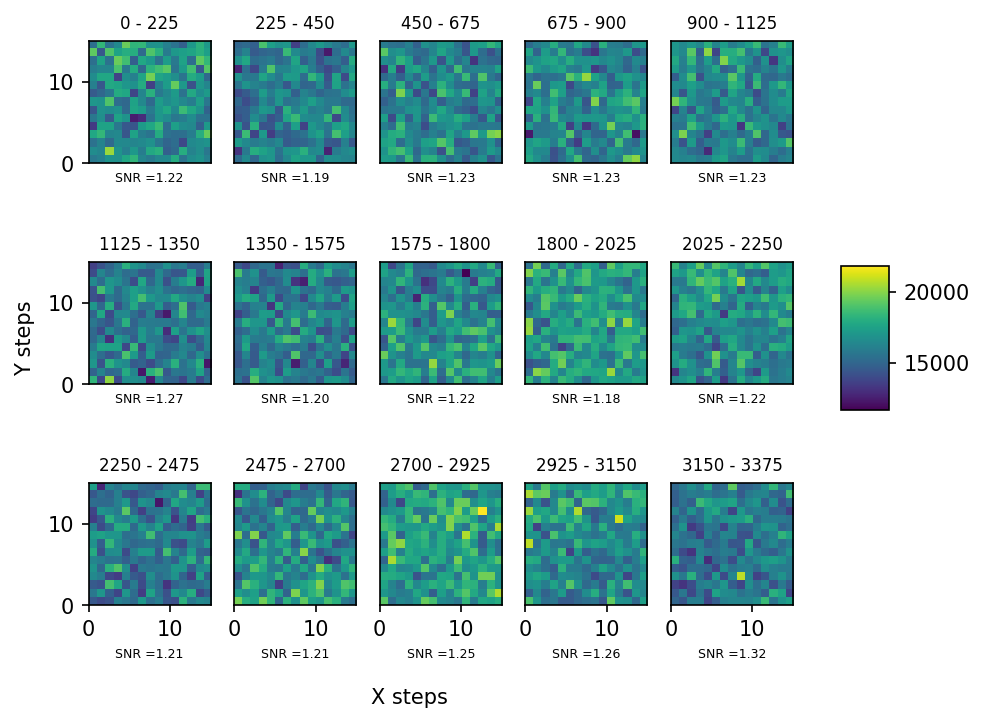

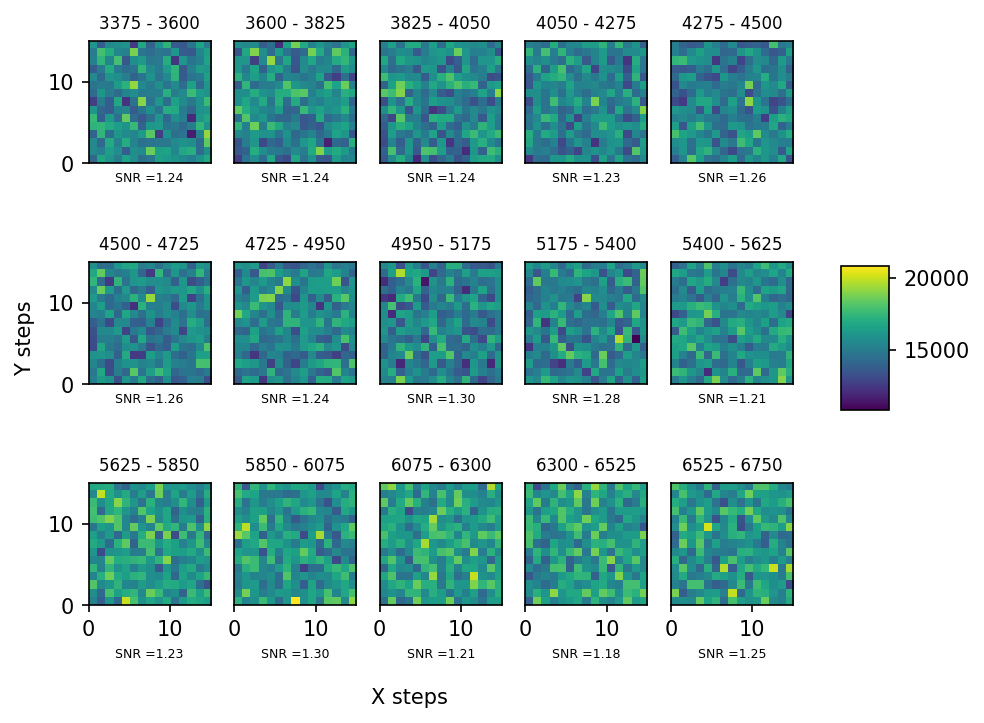

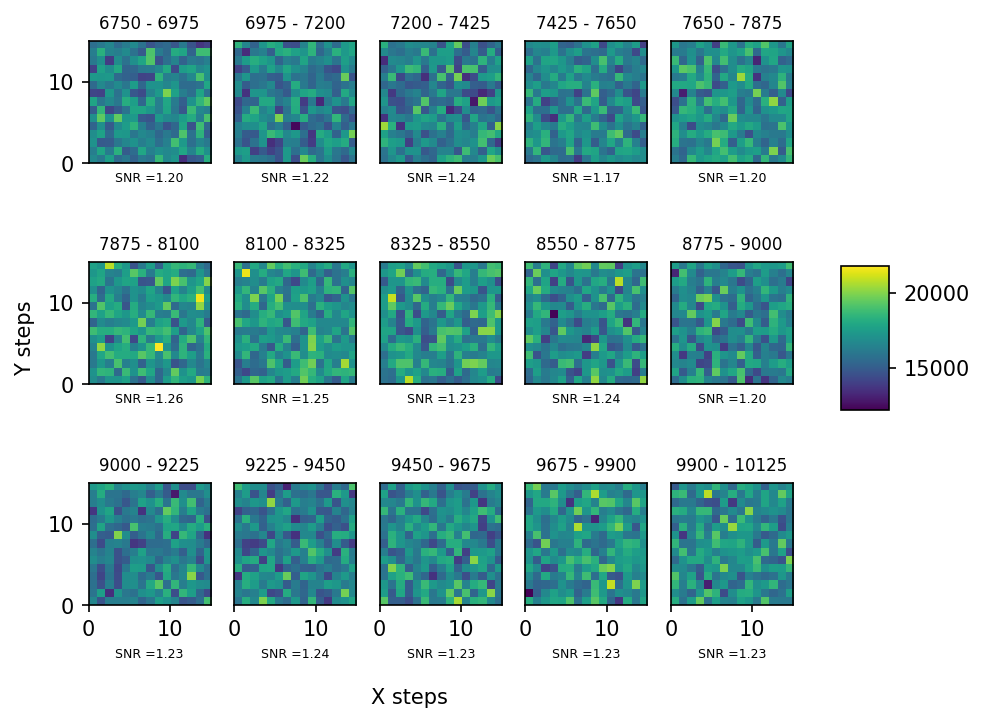

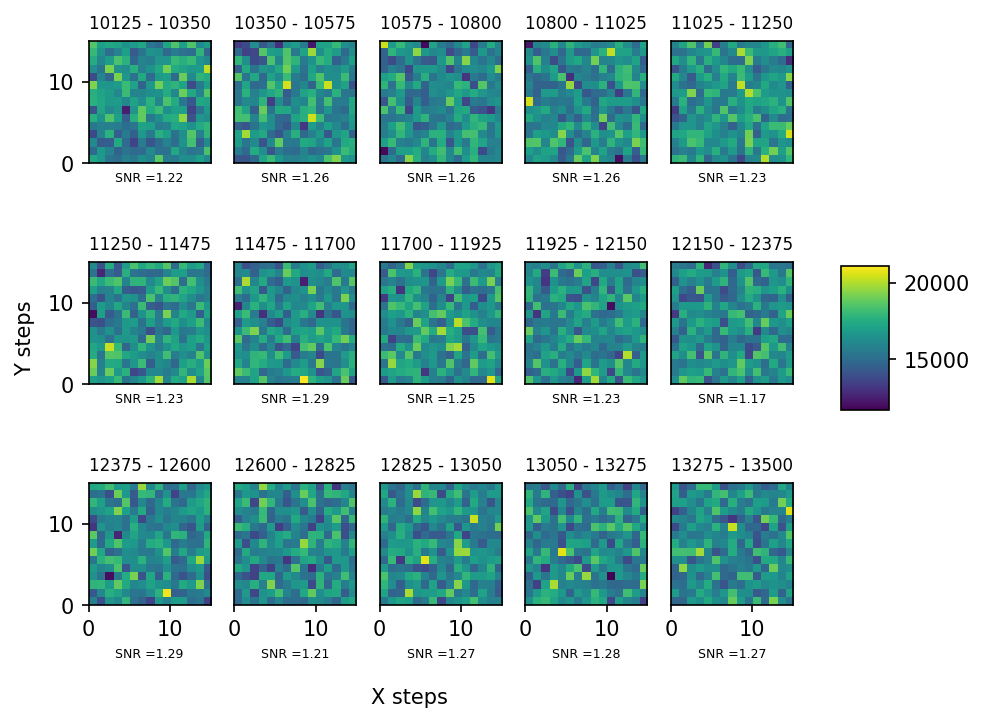

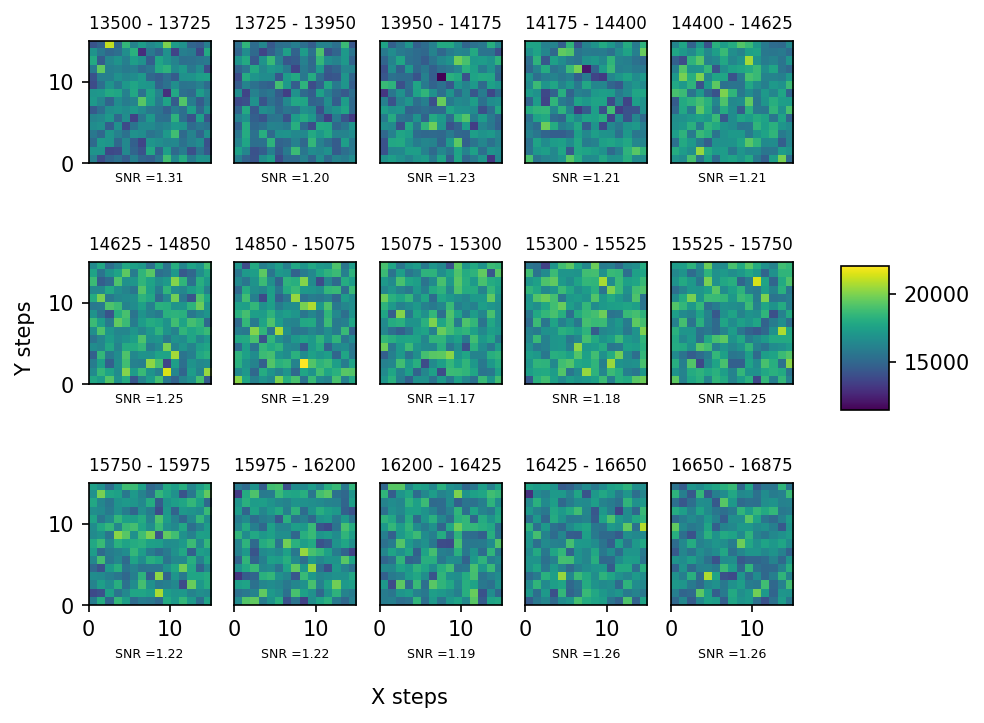

...

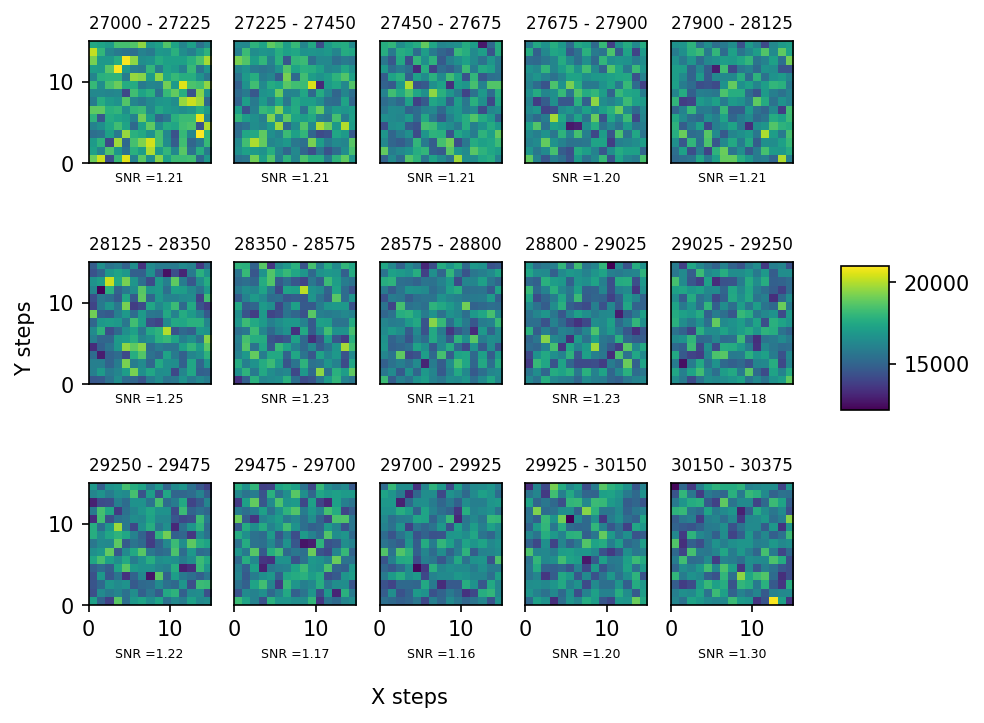

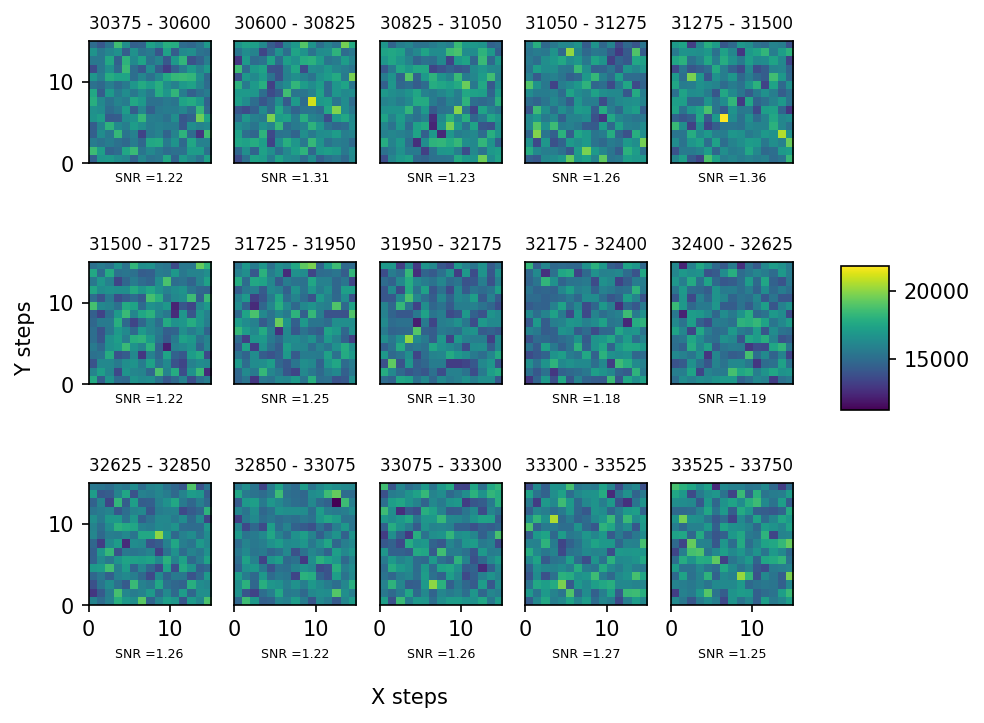

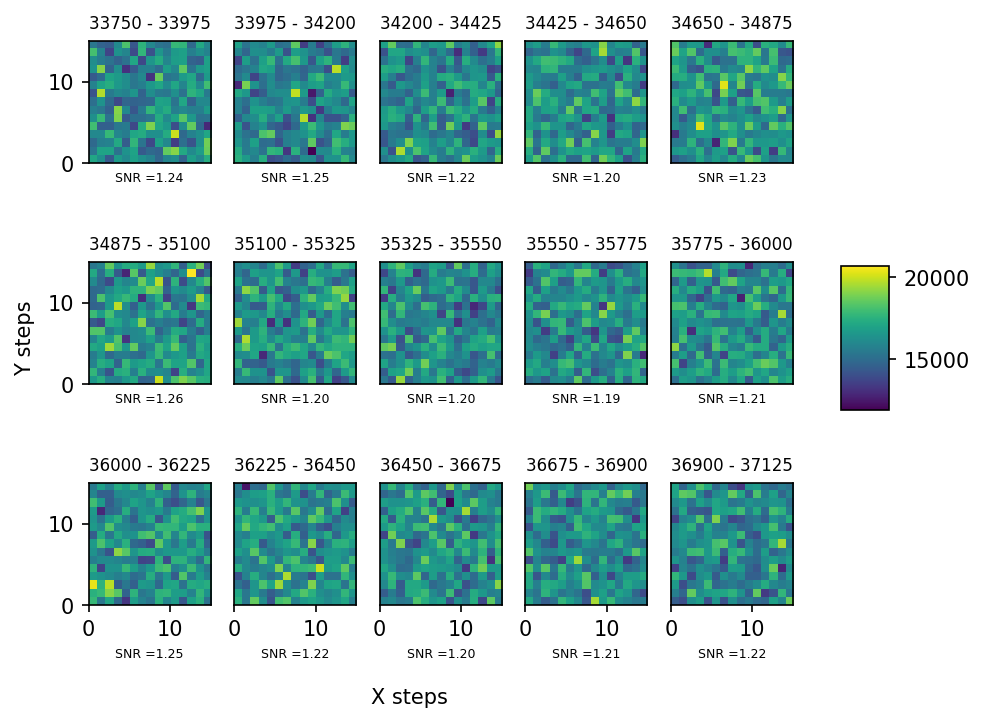

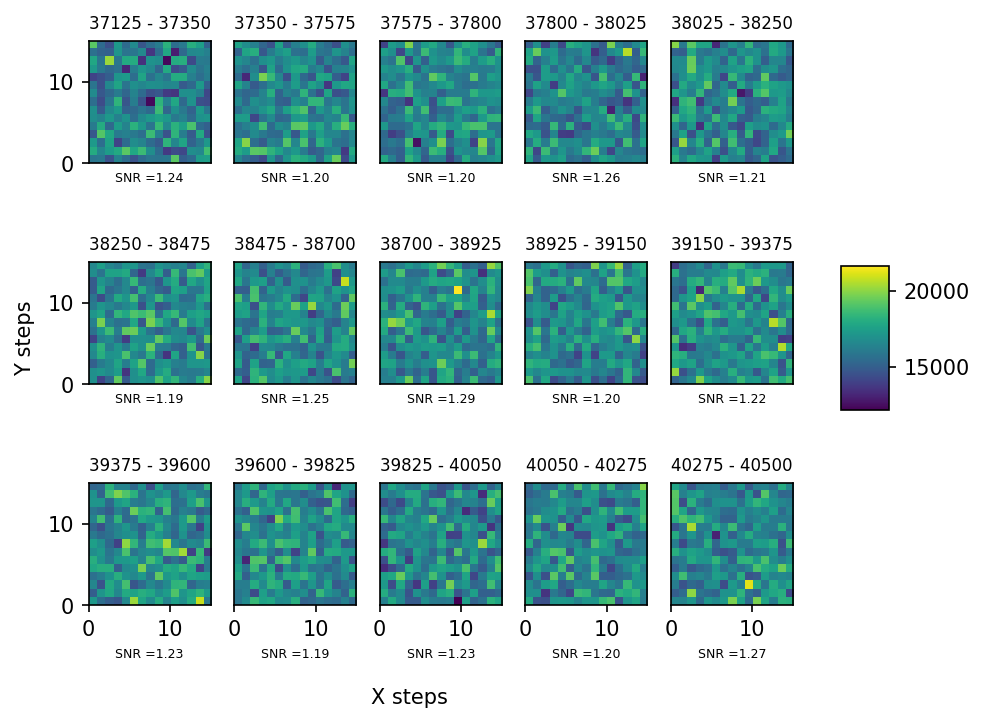

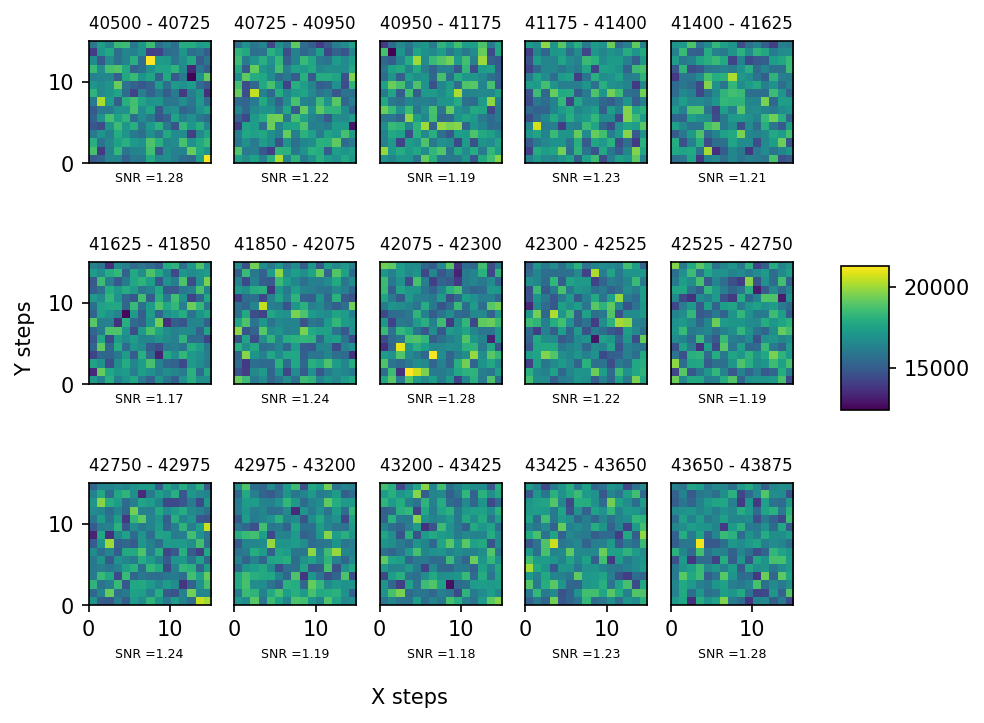

ValueError: cannot reshape array of size 199 into shape (15,15)

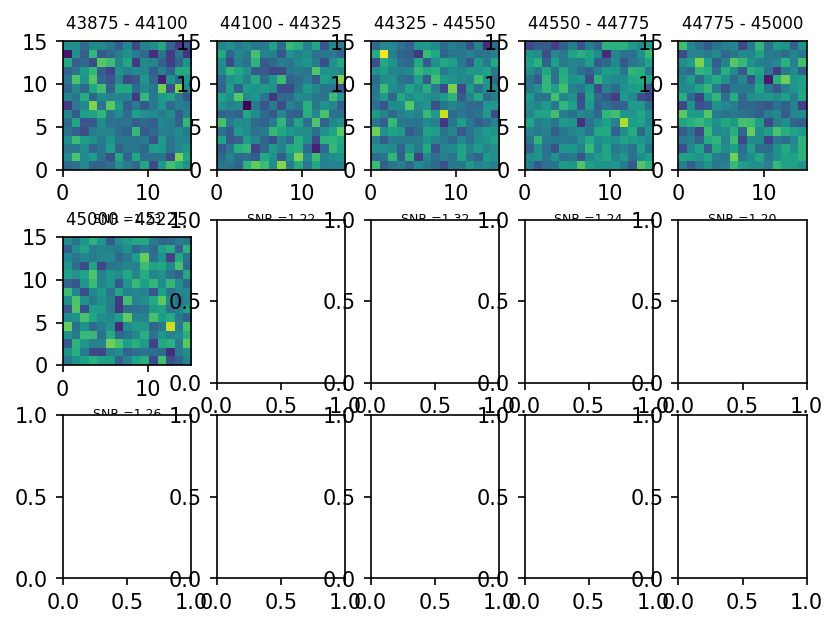

In [24]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols,dpi = 150)#,constrained_layout=True)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        figdata = counts[ysteps*xsteps*zbottom_steps*k:ysteps*xsteps*zbottom_steps*k+nrows*ncols*xsteps*ysteps] # this is the data that spans the whole figure
        
        # raw, unscaled data
        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=min(figdata), vmax=max(figdata)) #, vmin=mincounts, vmax=maxcounts)
        snr = np.max(imdata)/np.mean(imdata)
        ax.set_xlabel(f"SNR ={snr:.2f}",fontsize=6)
        
        # scaled/offset data
        # scaled = imdata/np.mean(imdata) # this essentially shows us what the signal is
        # im = ax.imshow(scaled, extent=[ymin, ymax, xmin, xmax]) #vmin=mincounts, vmax=maxcounts)
        
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.4, 0.05, 0.2])
    plt.colorbar(im, cax=cbar_ax)
    # fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
        # plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
        # plt.close()
    plt.show()

#     break

maxidx=20059, maxct=22900.000511854898, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.5156298828125, 7.500504324776785, -0.4486607142857143, -0.6366891043526786)


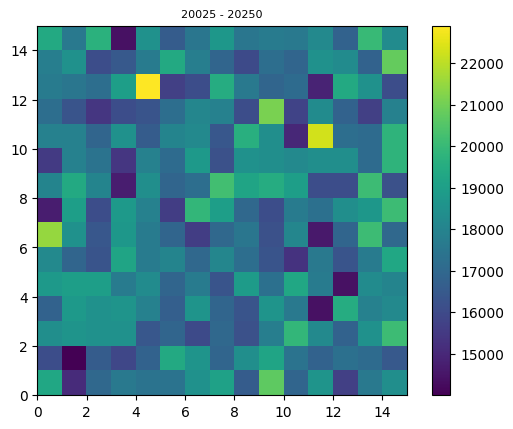

In [26]:
# local max for a given step range
step0 = 20025

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax])#, vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

(array([ 1.,  0.,  3.,  3.,  0.,  2.,  1.,  3.,  3.,  3.,  2., 12., 11.,
         3.,  6.,  8., 19., 12.,  3.,  8., 17., 12.,  5.,  9., 14., 18.,
         7.,  1.,  7.,  6.,  8.,  1.,  3.,  3.,  5.,  0.,  0.,  1.,  1.,
         1.,  0.,  0.,  1.,  0.,  0.,  0.,  1.,  0.,  0.,  1.]),
 array([14000.00031292, 14178.0003169 , 14356.00032088, 14534.00032486,
        14712.00032884, 14890.00033282, 15068.0003368 , 15246.00034077,
        15424.00034475, 15602.00034873, 15780.00035271, 15958.00035669,
        16136.00036067, 16314.00036465, 16492.00036862, 16670.0003726 ,
        16848.00037658, 17026.00038056, 17204.00038454, 17382.00038852,
        17560.0003925 , 17738.00039648, 17916.00040045, 18094.00040443,
        18272.00040841, 18450.00041239, 18628.00041637, 18806.00042035,
        18984.00042433, 19162.0004283 , 19340.00043228, 19518.00043626,
        19696.00044024, 19874.00044422, 20052.0004482 , 20230.00045218,
        20408.00045615, 20586.00046013, 20764.00046411, 20942.000468

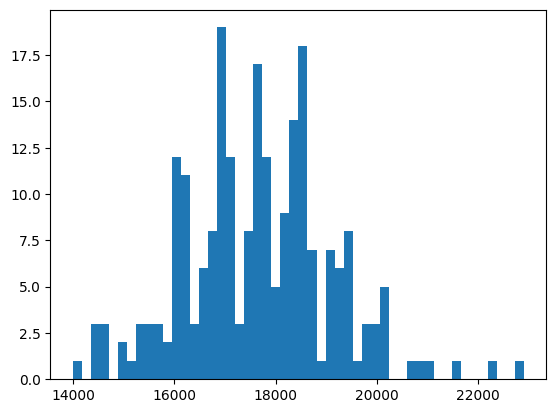

In [30]:
plt.hist(imdata.flatten(),bins=50)

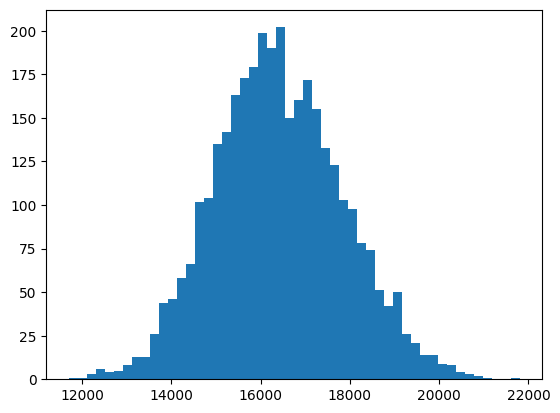

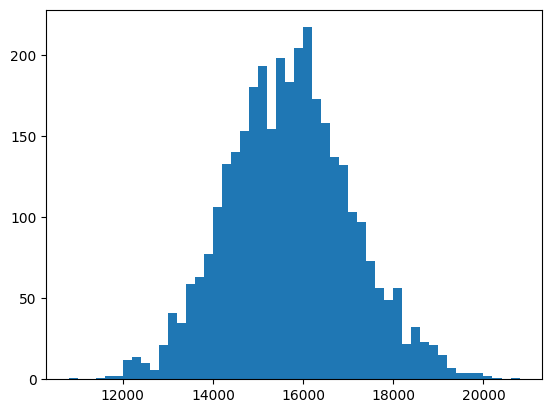

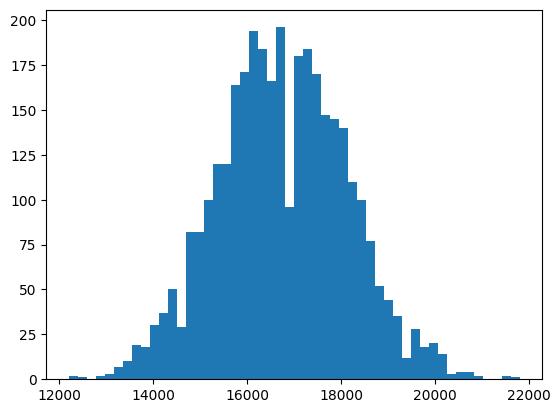

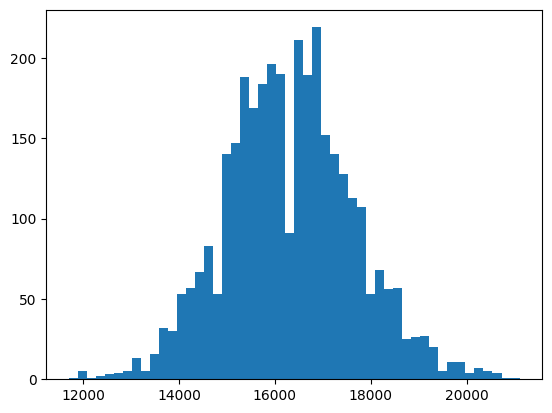

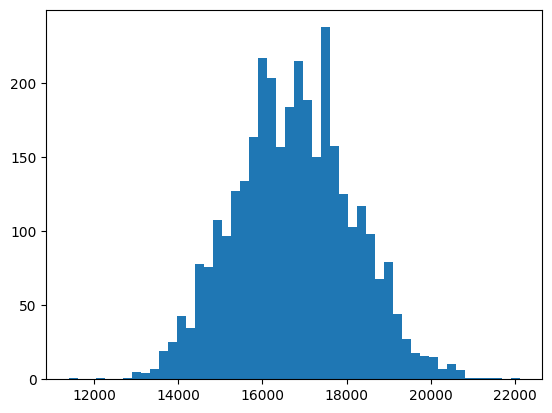

...

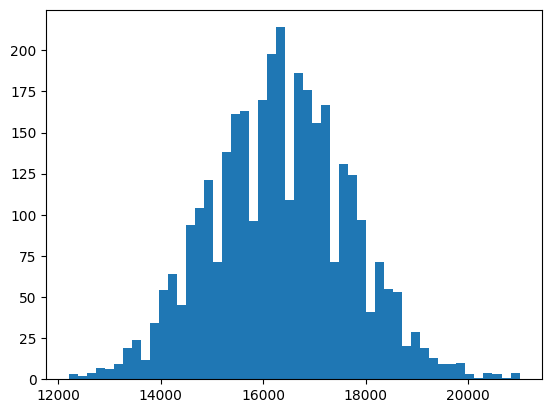

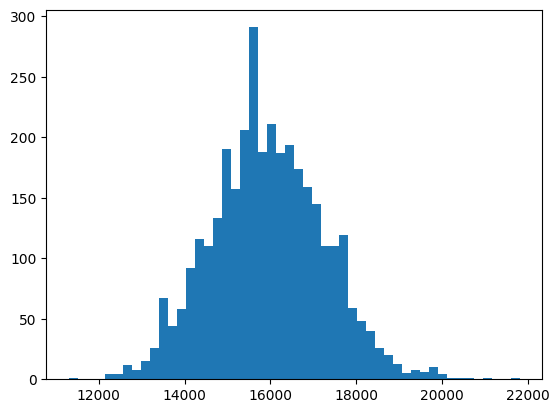

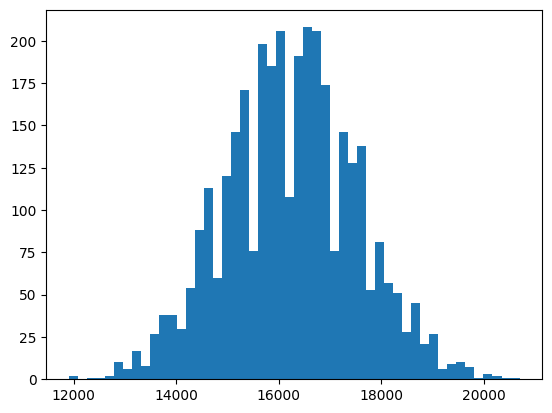

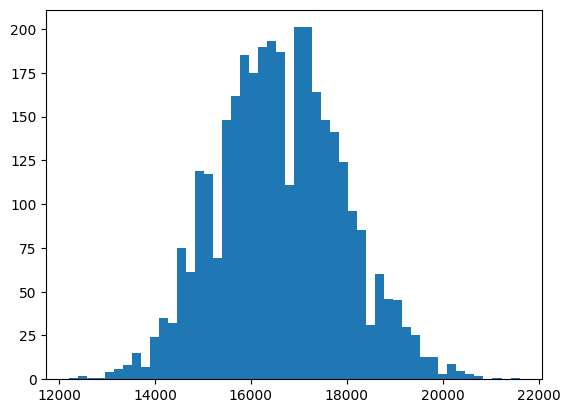

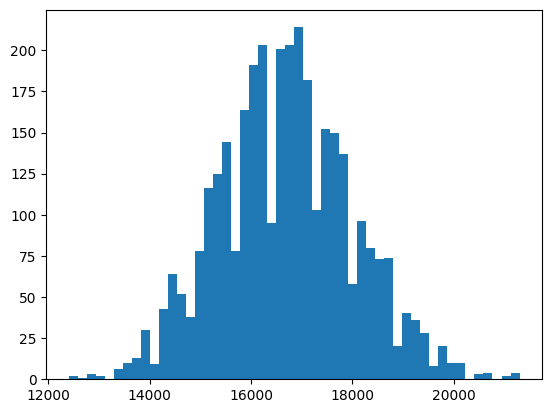

In [25]:
for i in range(int(len(counts)/(nrows*ncols*xsteps*ysteps))):
    plt.hist(counts[i*nrows*ncols*xsteps*ysteps:nrows*ncols*xsteps*ysteps*(i+1)],bins=50)
    plt.show()

### 2023.11.08

In [5]:

date_str = "2023-11-07"
h5_file = h5py.File(os.path.join(results,"2023-11-05","16","000007071-CoilScanSPCMCount.h5"))
datafile = os.path.join(results,date_str,"17","20231107_171718_coil_scan.csv")

# repumper came unlocked sometime during this experiment
# date_str = "2023-11-05"
# h5_file = h5py.File(os.path.join(results,date_str,"11","000007070-CoilScanSPCMCount.h5"))
# datafile = os.path.join(results,date_str,"11","20231105_110131_coil_scan.csv")

# repumper came unlocked sometime during this experiment
# date_str = "2023-11-03"
# h5_file = h5py.File(os.path.join(results,date_str,"16","000007052-CoilScanSPCMCount.h5"))
# datafile = os.path.join(results,date_str,"16","20231103_165133_coil_scan.csv")

[x for x in h5_file.values()]

[<HDF5 group "/archive" (63 members)>,
 <HDF5 dataset "artiq_version": shape (), type "|O">,
 <HDF5 group "/datasets" (30 members)>,
 <HDF5 dataset "expid": shape (), type "|O">,
 <HDF5 dataset "rid": shape (), type "<i4">,
 <HDF5 dataset "run_time": shape (), type "<f8">,
 <HDF5 dataset "start_time": shape (), type "<f8">]

In [6]:
# experiment variables defined by the experiment, e.g. in the GUI (such as the coil steps) or by subroutines (such as the MOT monitor datasets)
[x for x in h5_file['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_feedback_period_cycles": shape (), type "<f8">,
 <HDF5 dataset "FORT_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "FORT_on": shape (), type "|b1">,
 <HDF5 dataset "MOT1_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "Vx_array": shape (), type "|O">,
 <HDF5 dataset "Vy_array": s

In [7]:
# experiment variables defined in ExperimentVariables
[x for x in h5_file['archive'].values()]

[<HDF5 dataset "AOM_A1_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AZ_bottom_volts_MOT"

In [8]:
fort_on = np.single(h5_file['datasets']['FORT_on'])
fort_on_str = 'FORT_on' if fort_on else 'FORT_off' # for file saving
print(fort_on_str)

FORT_on


In [9]:
t_exp = np.single(h5_file['archive']['t_SPCM_exposure']) # numpy's float datatype 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [10]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [12]:
### nrows and ncols are the number of subplots in each image
nrows = 3
ncols = 5
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [13]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

225

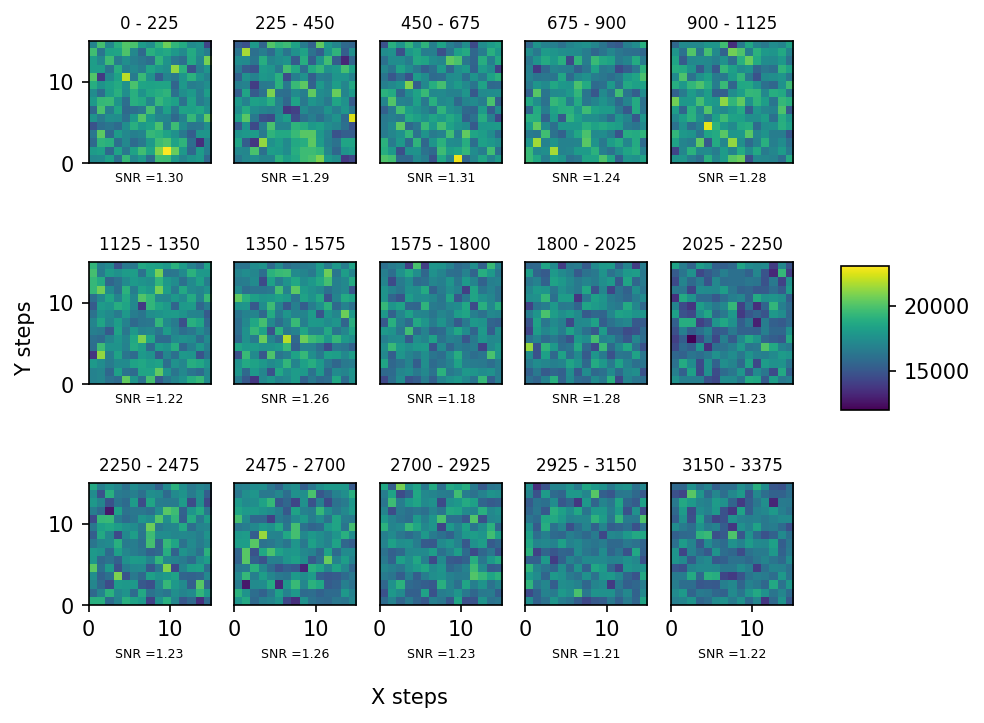

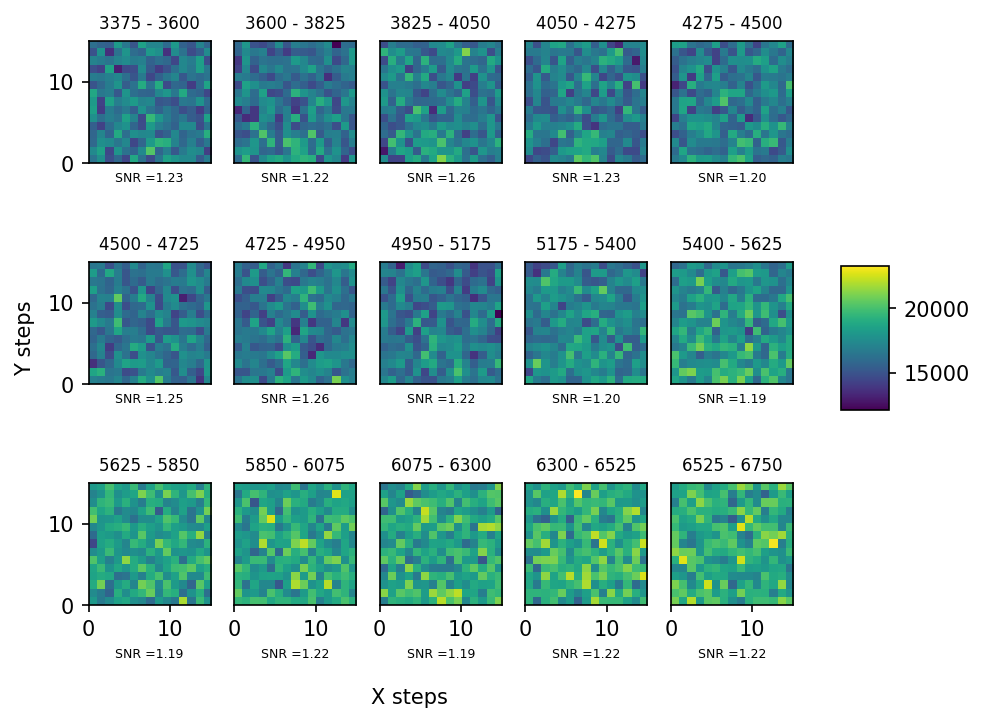

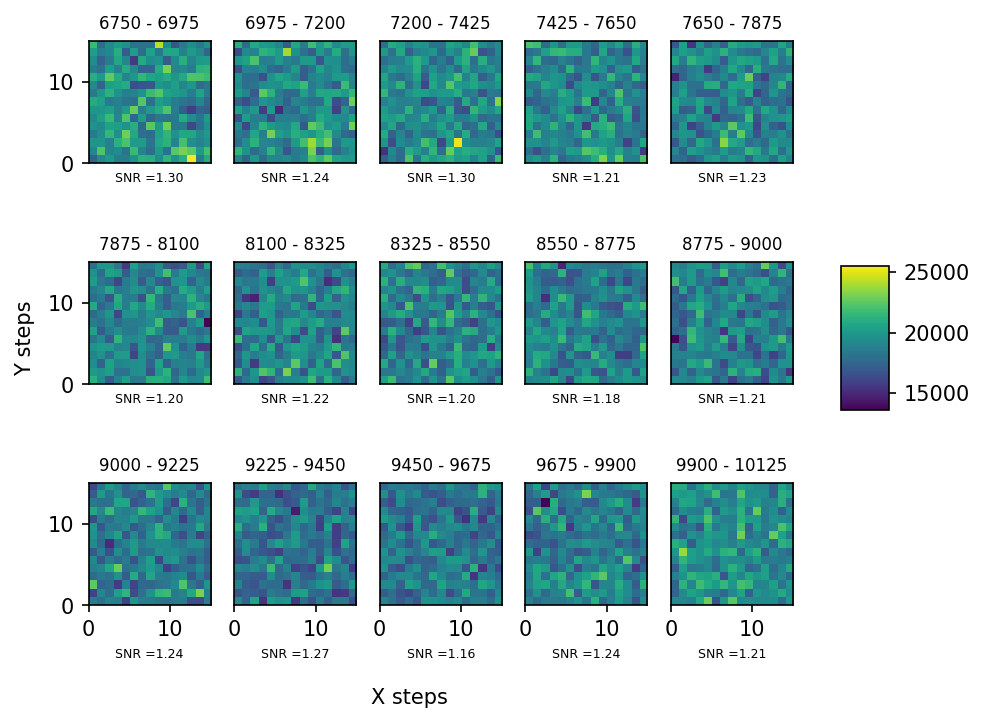

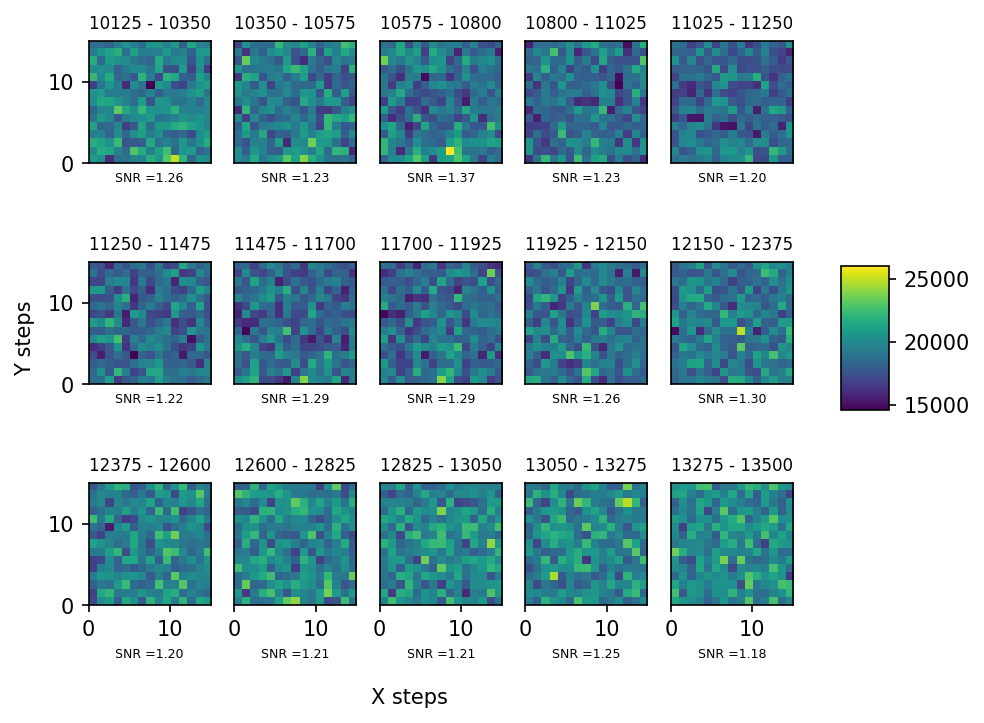

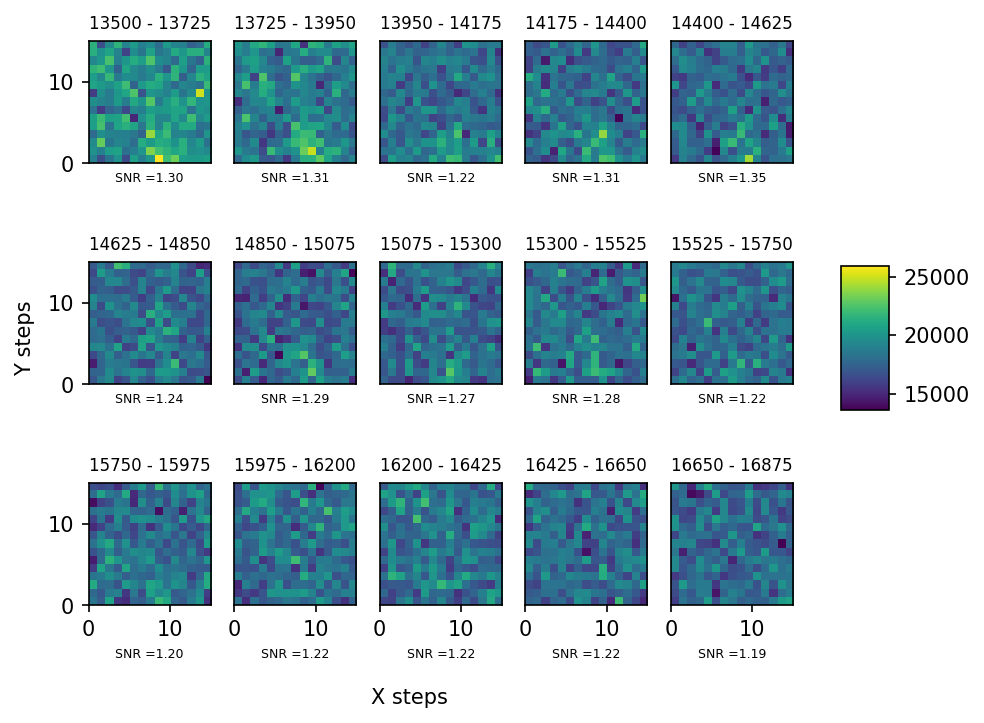

...

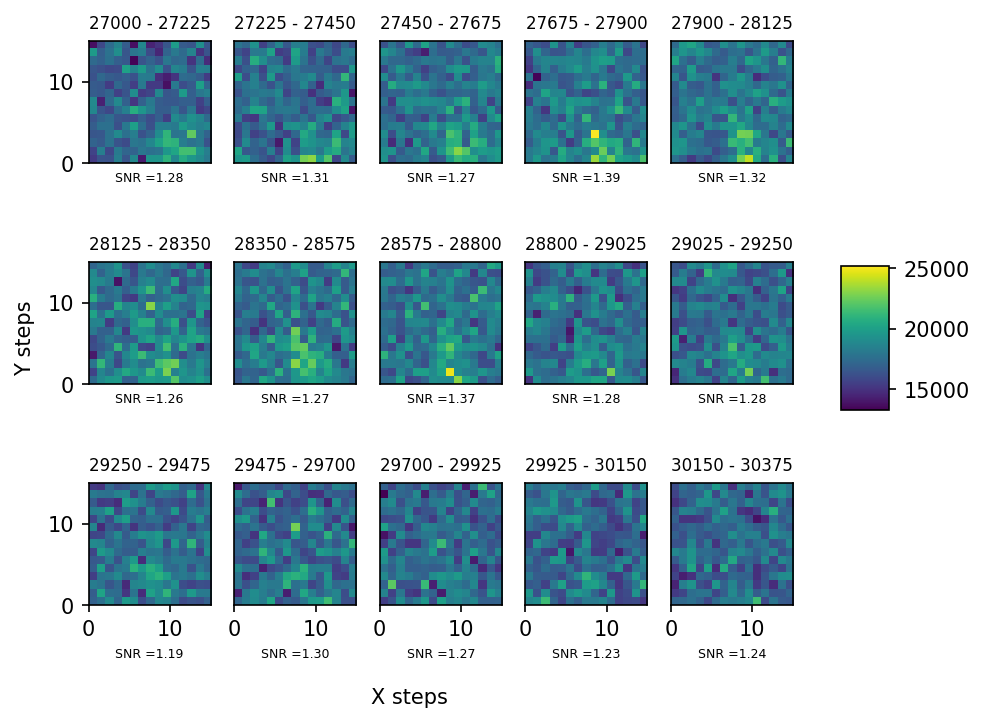

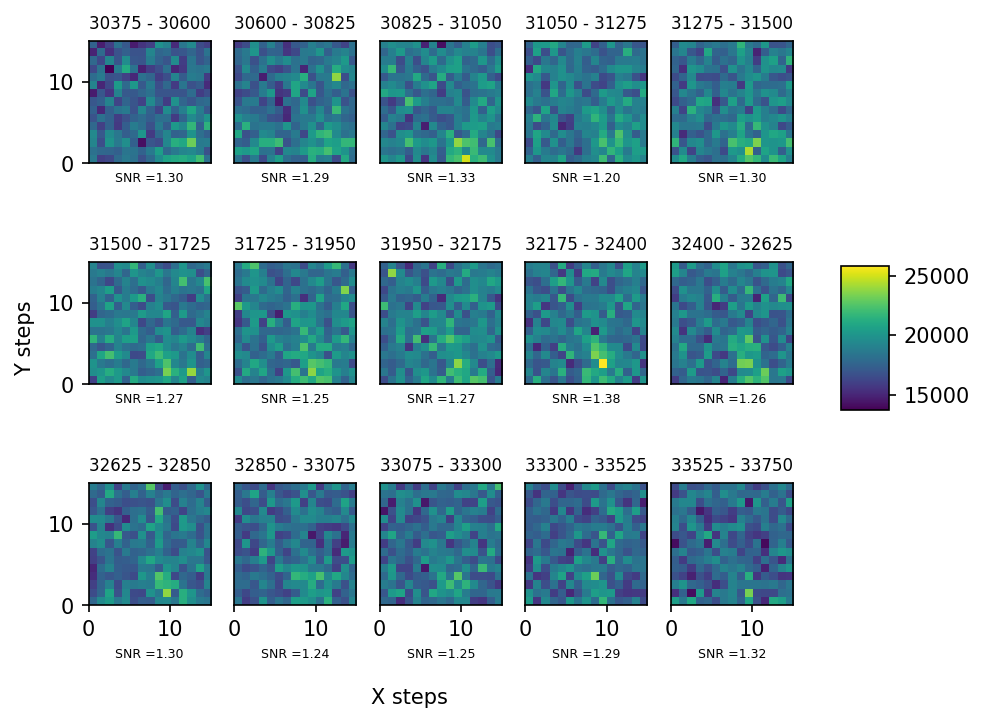

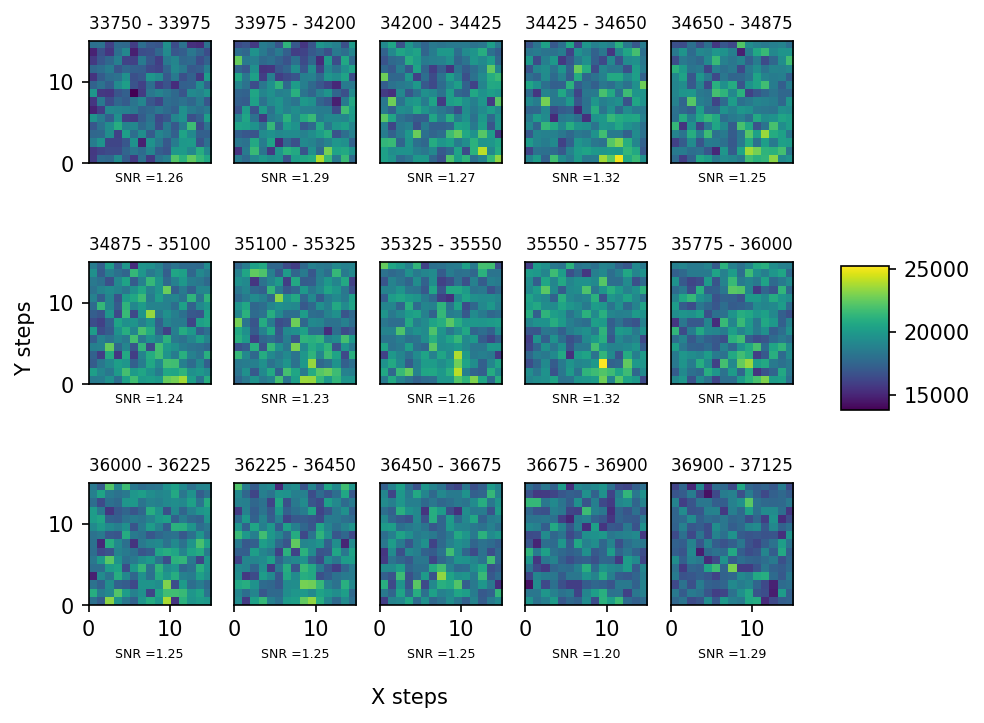

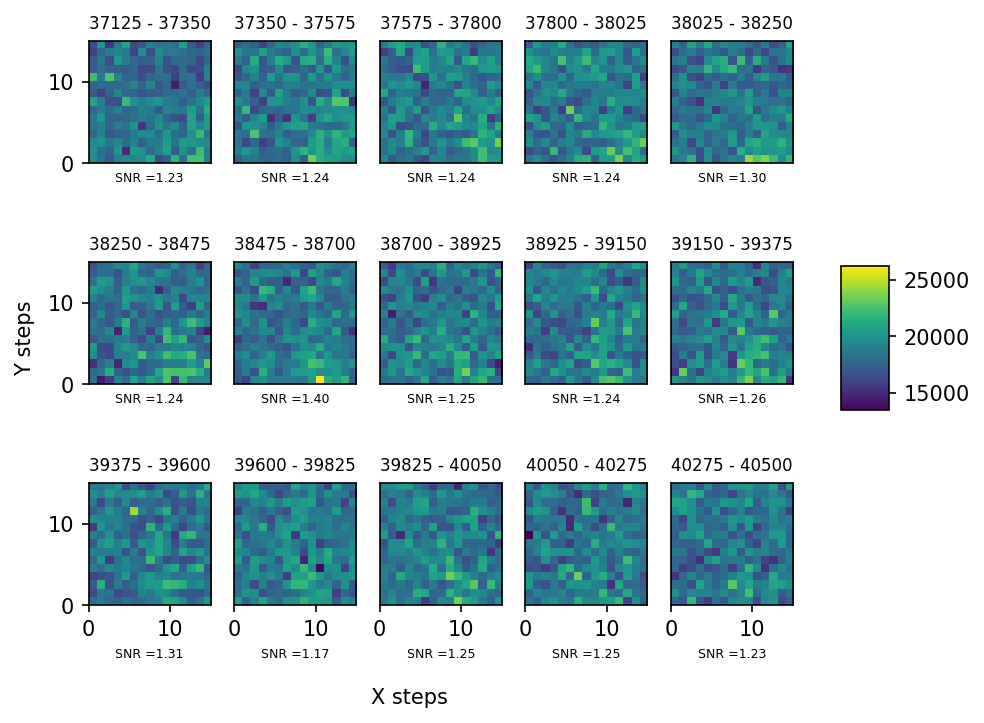

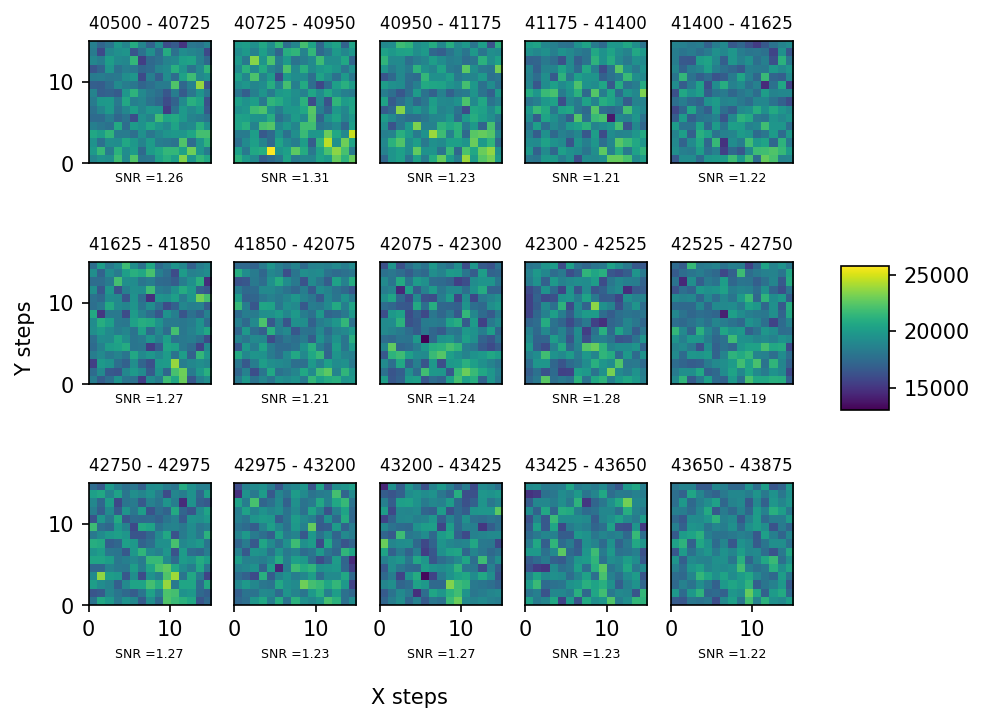

ValueError: cannot reshape array of size 5 into shape (15,15)

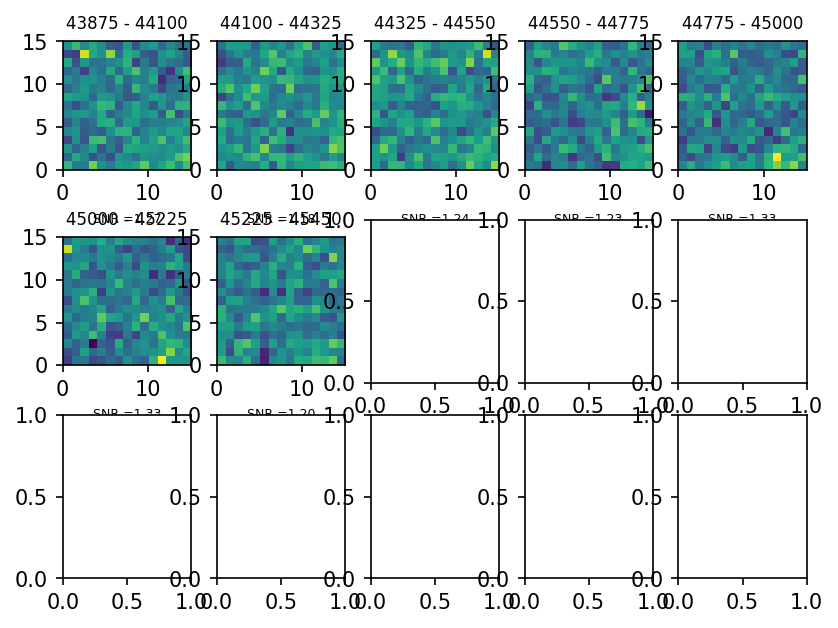

In [14]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols,dpi = 150)#,constrained_layout=True)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        figdata = counts[ysteps*xsteps*zbottom_steps*k:ysteps*xsteps*zbottom_steps*k+nrows*ncols*xsteps*ysteps] # this is the data that spans the whole figure
        
        # raw, unscaled data
        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=min(figdata), vmax=max(figdata)) #, vmin=mincounts, vmax=maxcounts)
        snr = np.max(imdata)/np.mean(imdata)
        ax.set_xlabel(f"SNR ={snr:.2f}",fontsize=6)
        
        # scaled/offset data
        # scaled = imdata/np.mean(imdata) # this essentially shows us what the signal is
        # im = ax.imshow(scaled, extent=[ymin, ymax, xmin, xmax]) #vmin=mincounts, vmax=maxcounts)
        
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.4, 0.05, 0.2])
    plt.colorbar(im, cax=cbar_ax)
    # fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
        # plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
        # plt.close()
    plt.show()

#     break

maxidx=24313, maxct=22300.000498443853, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.429975830078125, 8.153075425091913, 0.3069682268415179, -0.16957706705729167)


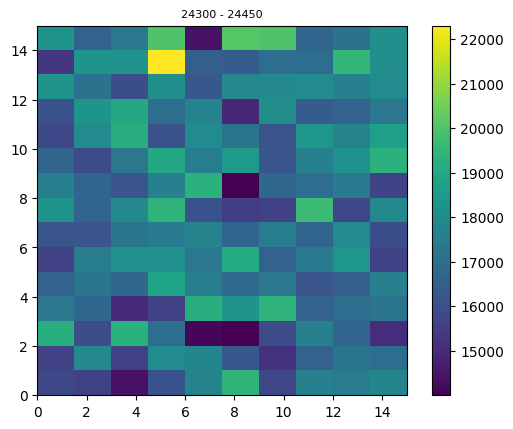

In [76]:
# local max for a given step range
step0 = 24300

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax])#, vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

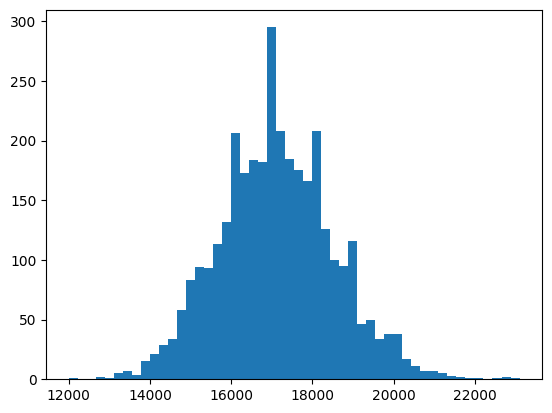

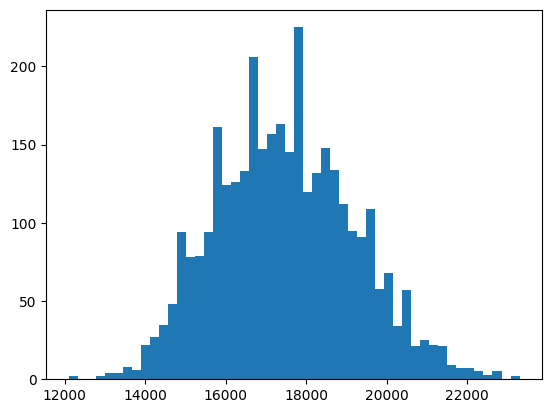

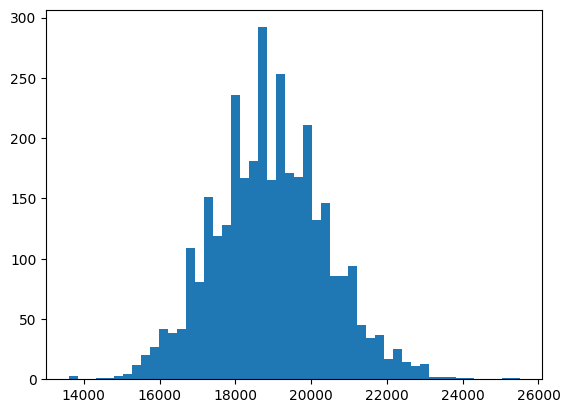

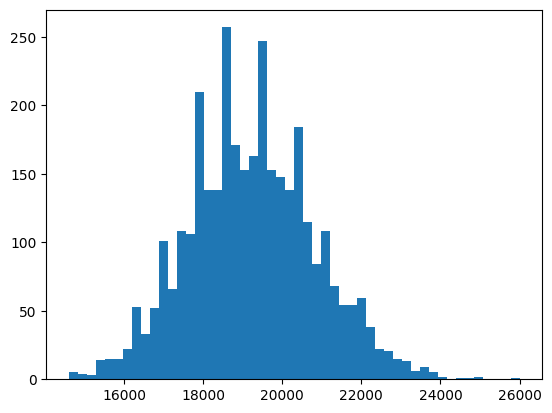

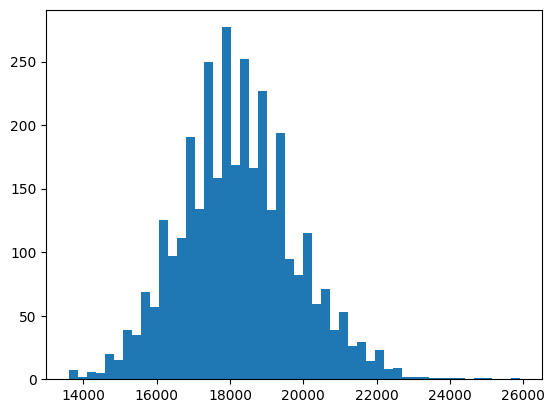

...

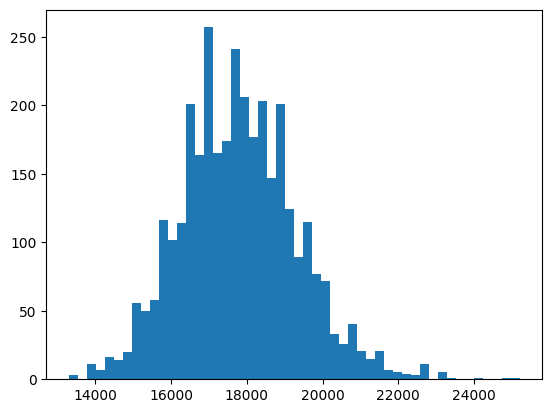

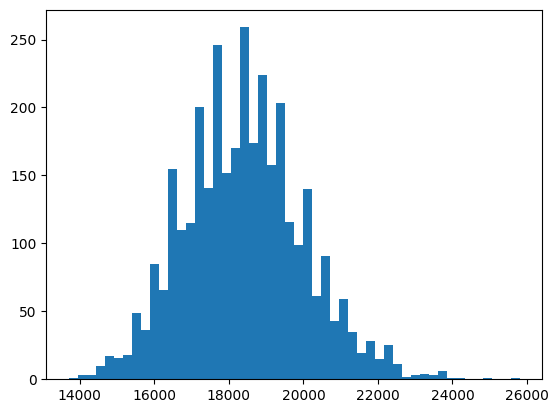

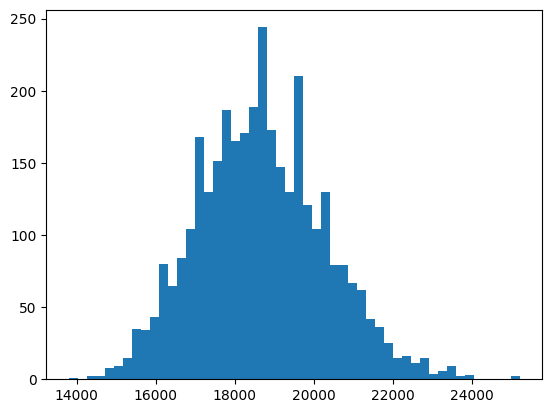

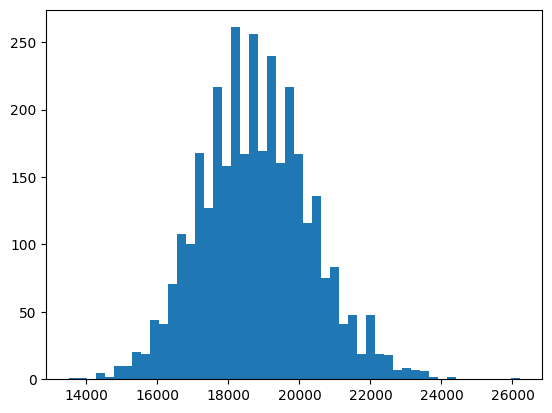

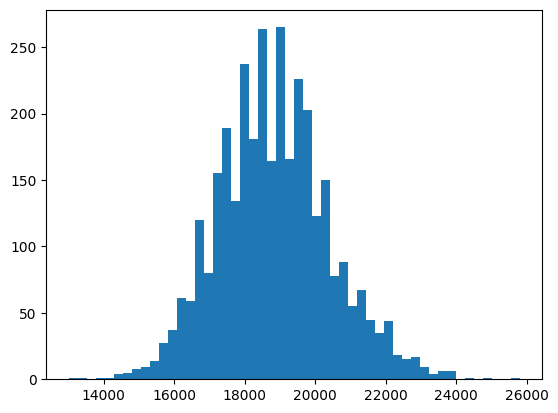

In [15]:
for i in range(int(len(counts)/(nrows*ncols*xsteps*ysteps))):
    plt.hist(counts[i*nrows*ncols*xsteps*ysteps:nrows*ncols*xsteps*ysteps*(i+1)],bins=50)
    plt.show()

### 2023.11.06

In [67]:

date_str = "2023-11-05"
h5_file = h5py.File(os.path.join(results,date_str,"16","000007071-CoilScanSPCMCount.h5"))
datafile = os.path.join(results,date_str,"16","20231105_162944_coil_scan.csv")

# repumper came unlocked sometime during this experiment
# date_str = "2023-11-05"
# h5_file = h5py.File(os.path.join(results,date_str,"11","000007070-CoilScanSPCMCount.h5"))
# datafile = os.path.join(results,date_str,"11","20231105_110131_coil_scan.csv")

# repumper came unlocked sometime during this experiment
# date_str = "2023-11-03"
# h5_file = h5py.File(os.path.join(results,date_str,"16","000007052-CoilScanSPCMCount.h5"))
# datafile = os.path.join(results,date_str,"16","20231103_165133_coil_scan.csv")

[x for x in h5_file.values()]

[<HDF5 group "/archive" (63 members)>,
 <HDF5 dataset "artiq_version": shape (), type "|O">,
 <HDF5 group "/datasets" (30 members)>,
 <HDF5 dataset "expid": shape (), type "|O">,
 <HDF5 dataset "rid": shape (), type "<i4">,
 <HDF5 dataset "run_time": shape (), type "<f8">,
 <HDF5 dataset "start_time": shape (), type "<f8">]

In [68]:
# experiment variables defined by the experiment, e.g. in the GUI (such as the coil steps) or by subroutines (such as the MOT monitor datasets)
[x for x in h5_file['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_feedback_period_cycles": shape (), type "<f8">,
 <HDF5 dataset "FORT_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "FORT_on": shape (), type "|b1">,
 <HDF5 dataset "MOT1_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (4862,), type "<f8">,
 <HDF5 dataset "Vx_array": shape (), type "|O">,
 <HDF5 dataset "Vy_array": s

In [69]:
# experiment variables defined in ExperimentVariables
[x for x in h5_file['archive'].values()]

[<HDF5 dataset "AOM_A1_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AZ_bottom_volts_MOT"

In [70]:
fort_on = np.single(h5_file['datasets']['FORT_on'])
fort_on_str = 'FORT_on' if fort_on else 'FORT_off' # for file saving
print(fort_on_str)

FORT_on


In [71]:
t_exp = np.single(h5_file['archive']['t_SPCM_exposure']) # numpy's float datatype 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [72]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [73]:
### nrows and ncols are the number of subplots in each image
nrows = 3
ncols = 6
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [74]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

150

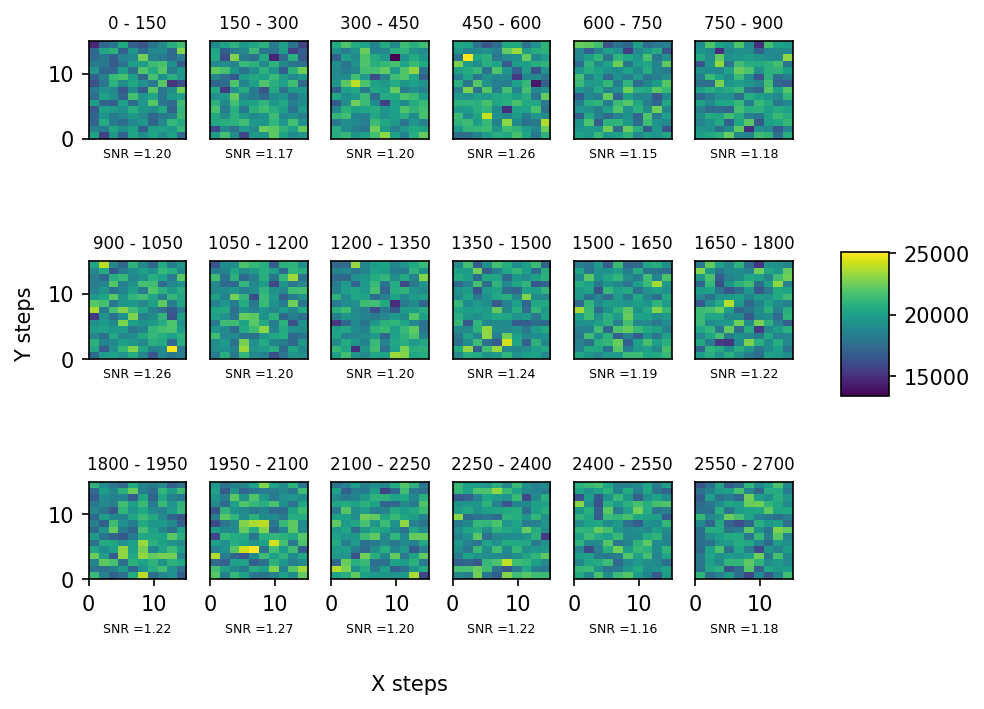

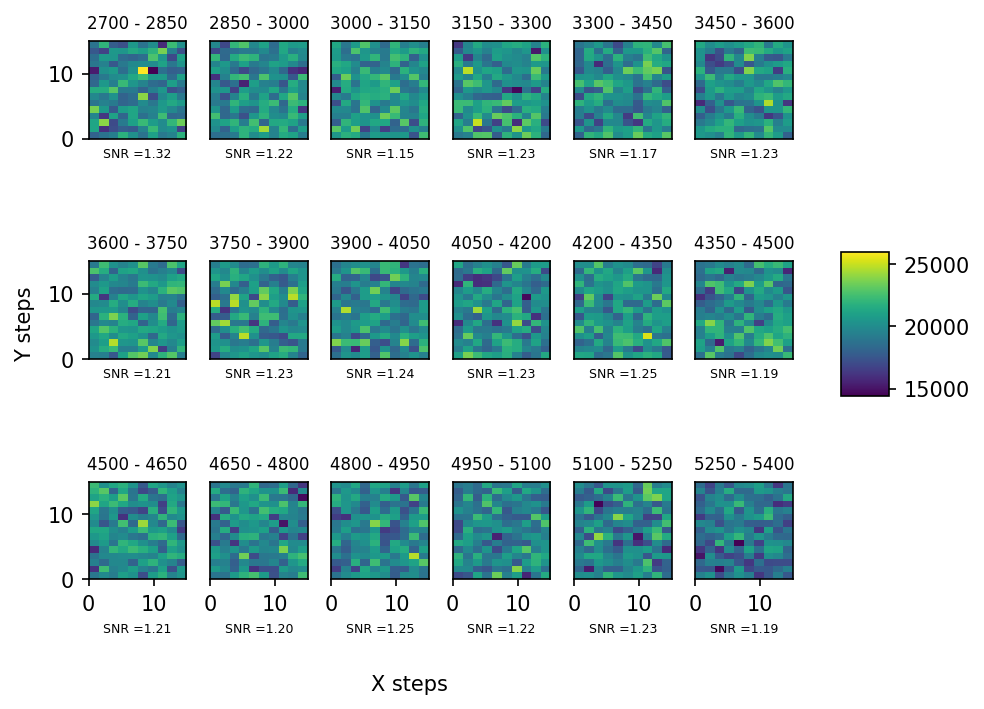

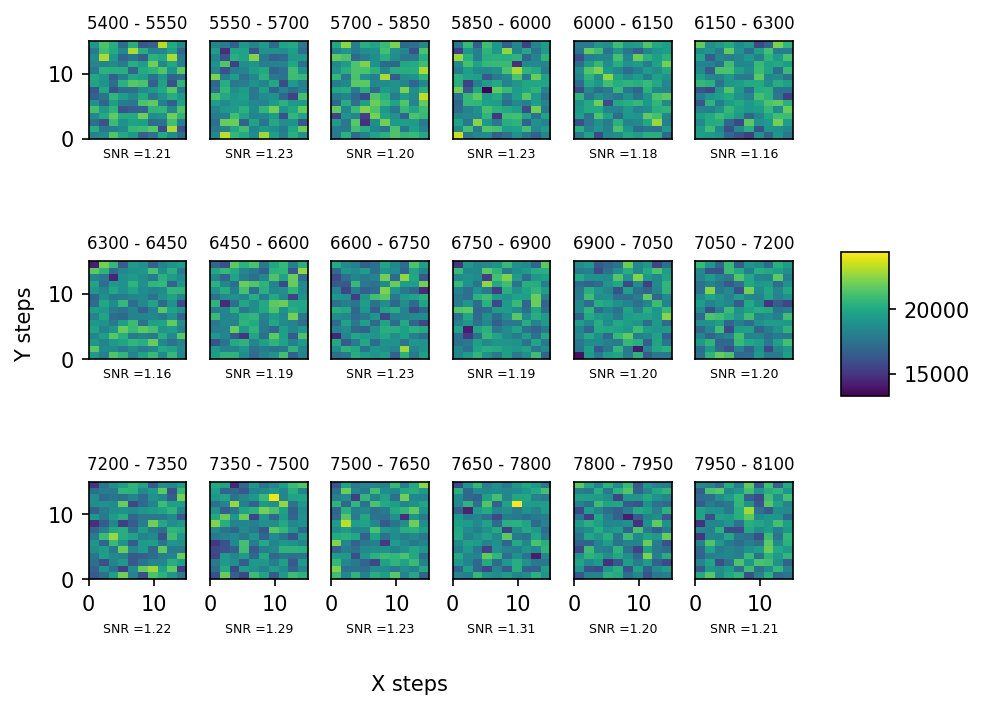

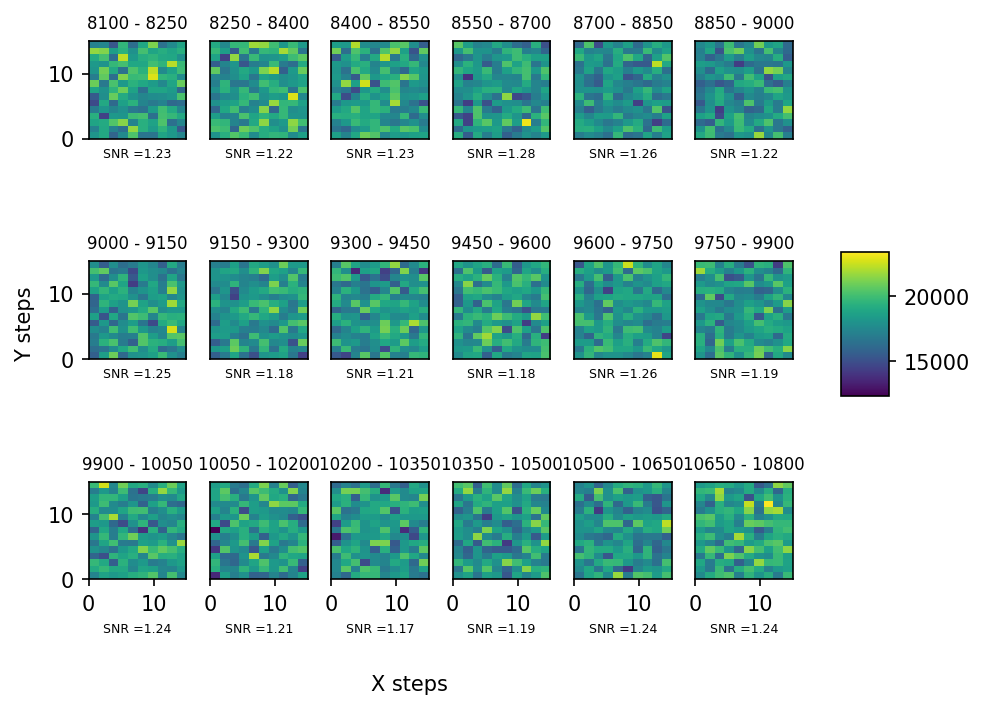

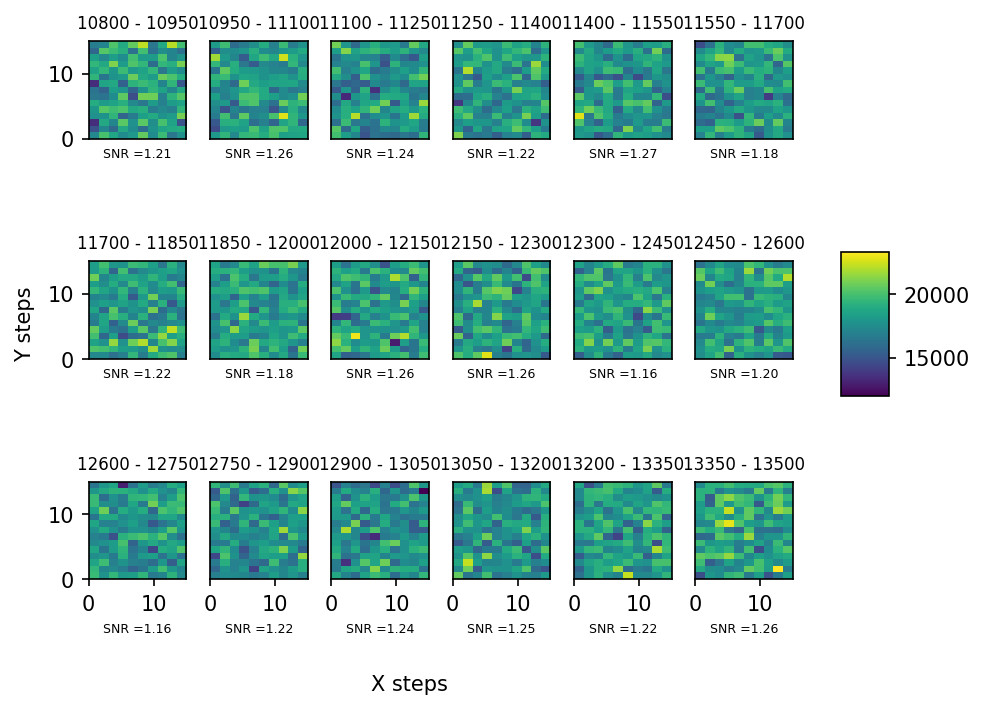

...

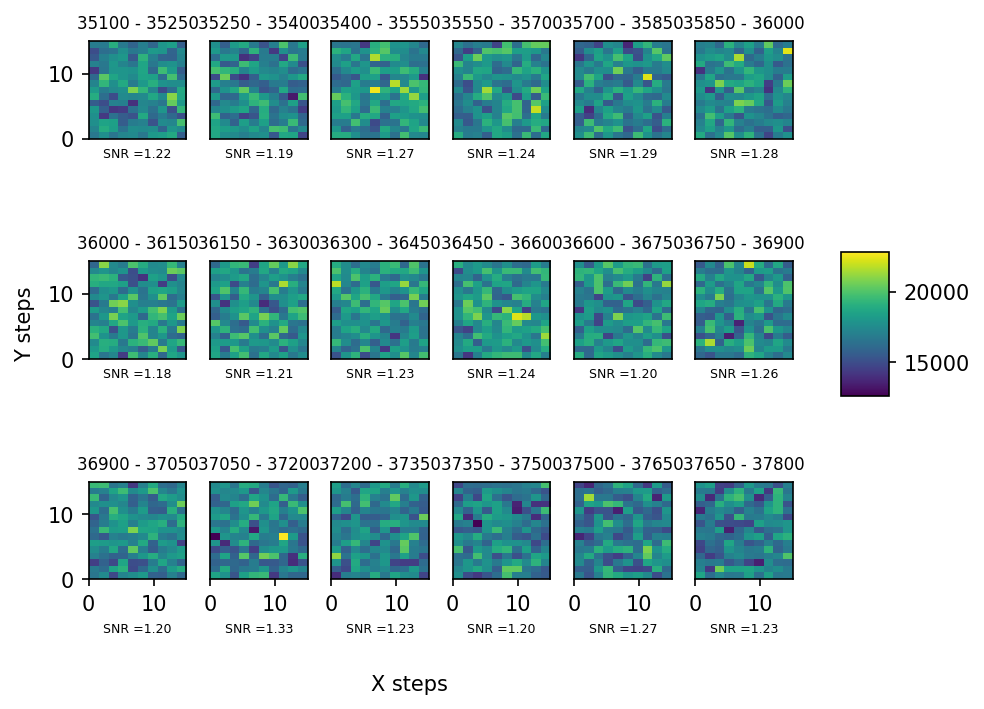

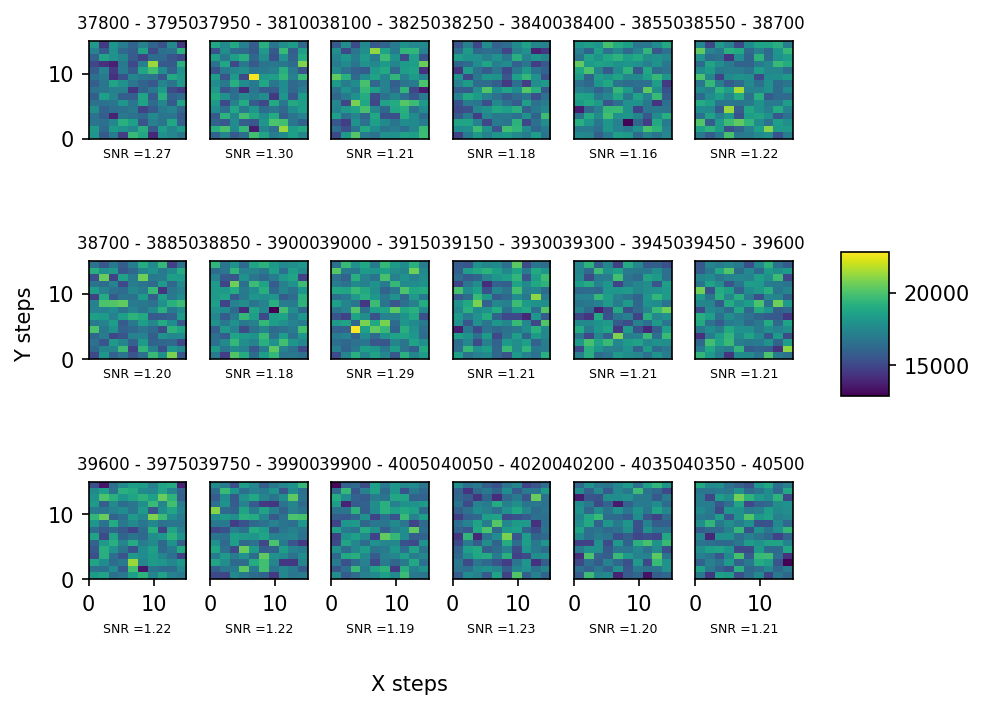

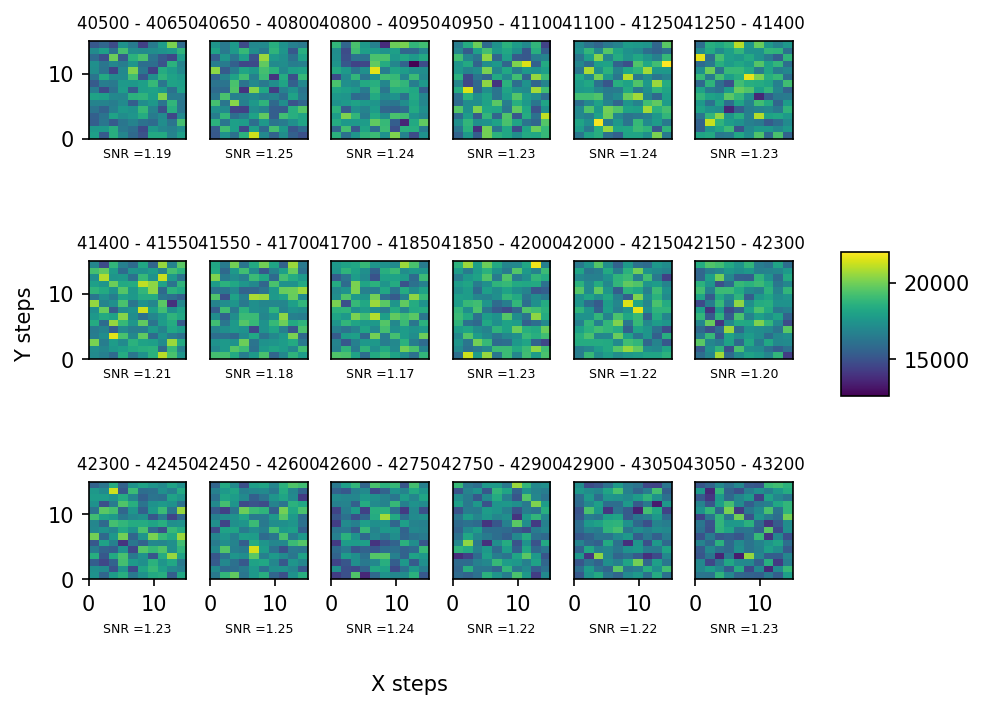

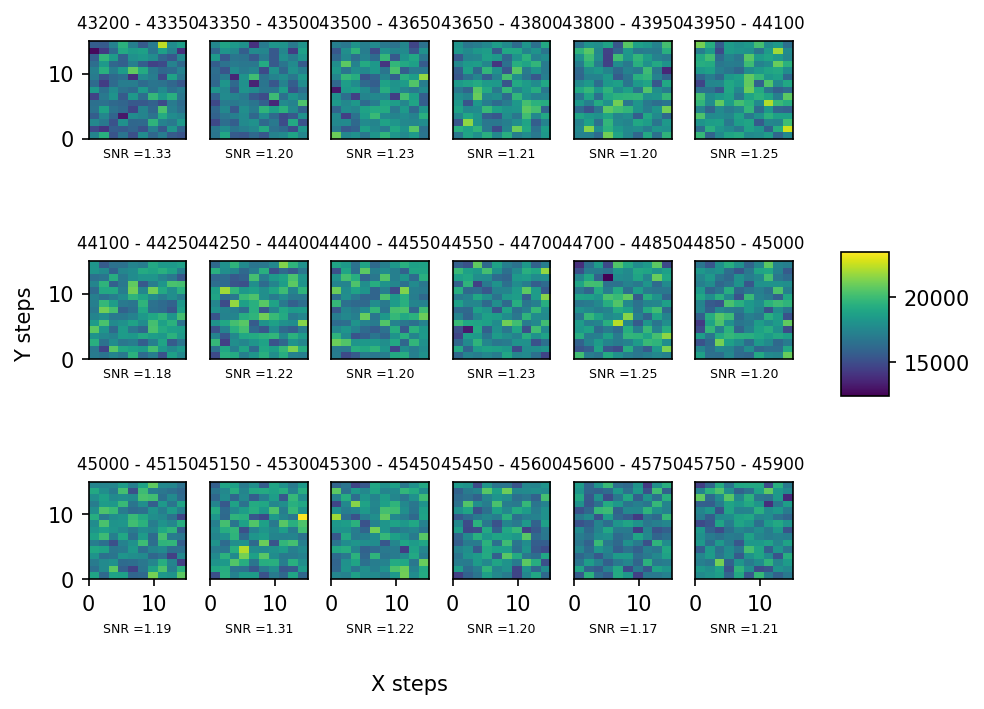

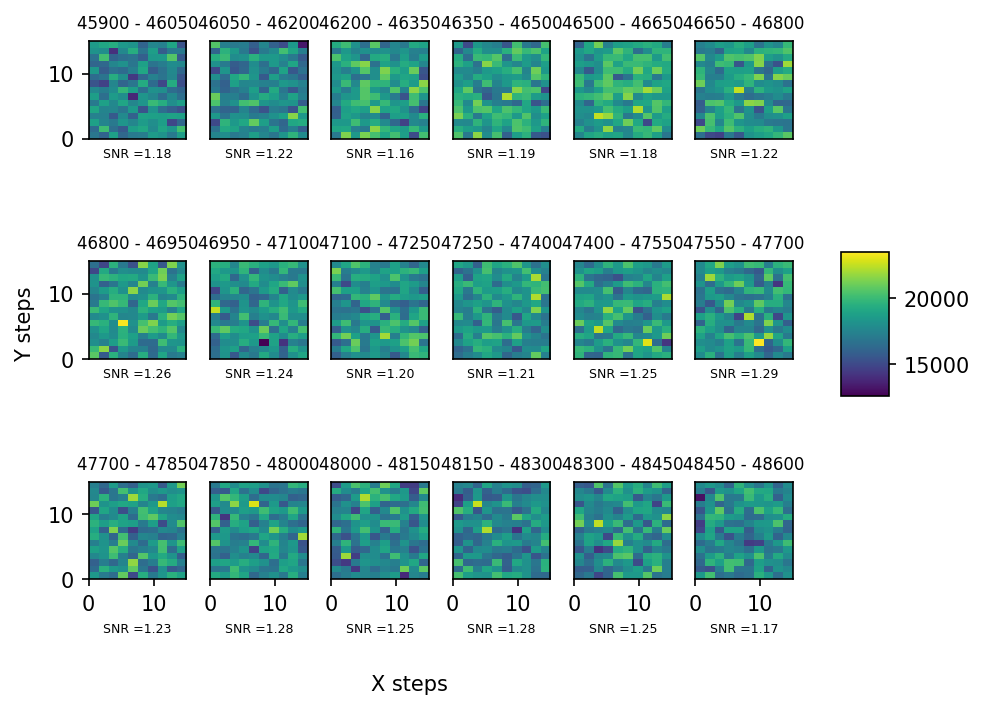

In [75]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols,dpi = 150)#,constrained_layout=True)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        figdata = counts[ysteps*xsteps*zbottom_steps*k:ysteps*xsteps*zbottom_steps*k+nrows*ncols*xsteps*ysteps] # this is the data that spans the whole figure
        
        # raw, unscaled data
        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=min(figdata), vmax=max(figdata)) #, vmin=mincounts, vmax=maxcounts)
        snr = np.max(imdata)/np.mean(imdata)
        ax.set_xlabel(f"SNR ={snr:.2f}",fontsize=6)
        
        # scaled/offset data
        # scaled = imdata/np.mean(imdata) # this essentially shows us what the signal is
        # im = ax.imshow(scaled, extent=[ymin, ymax, xmin, xmax]) #vmin=mincounts, vmax=maxcounts)
        
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.4, 0.05, 0.2])
    plt.colorbar(im, cax=cbar_ax)
    # fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
        # plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
        # plt.close()
    plt.show()

#     break

maxidx=24313, maxct=22300.000498443853, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.429975830078125, 8.153075425091913, 0.3069682268415179, -0.16957706705729167)


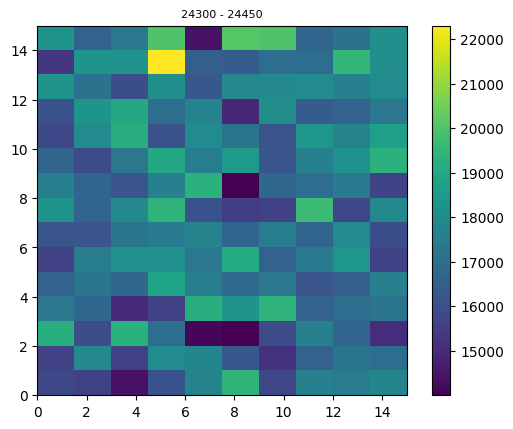

In [76]:
# local max for a given step range
step0 = 24300

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax])#, vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

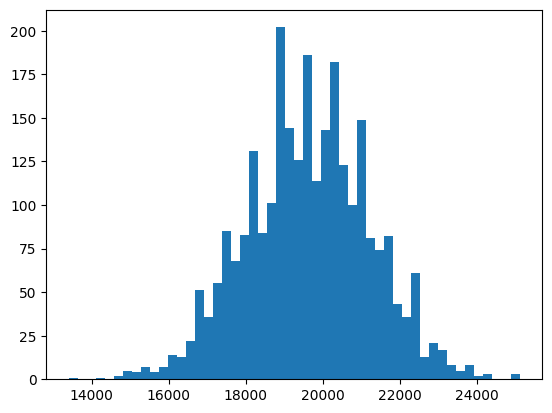

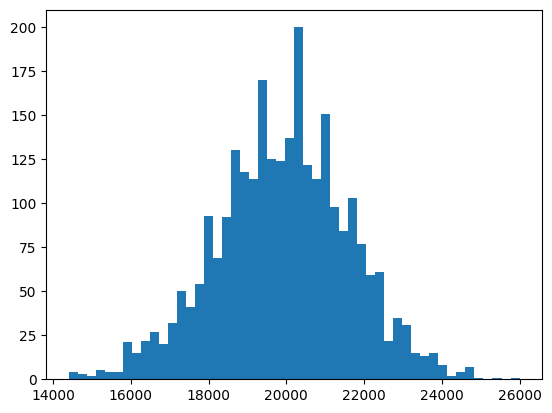

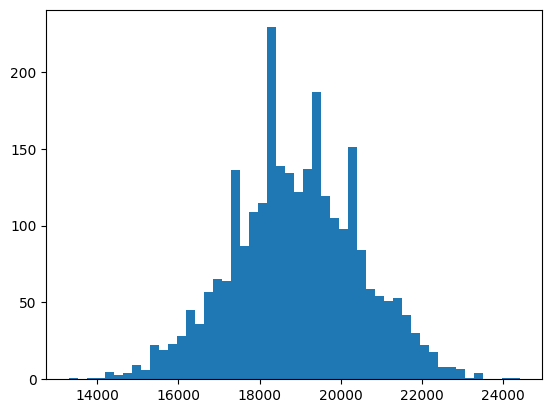

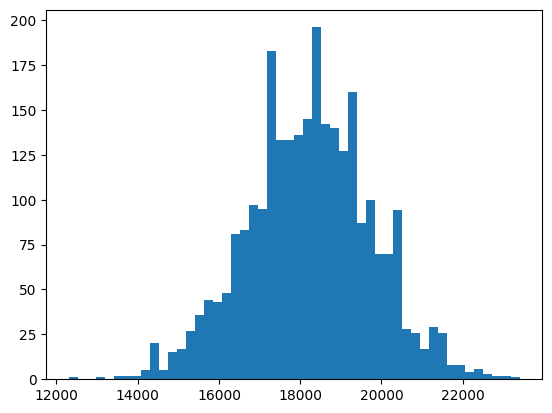

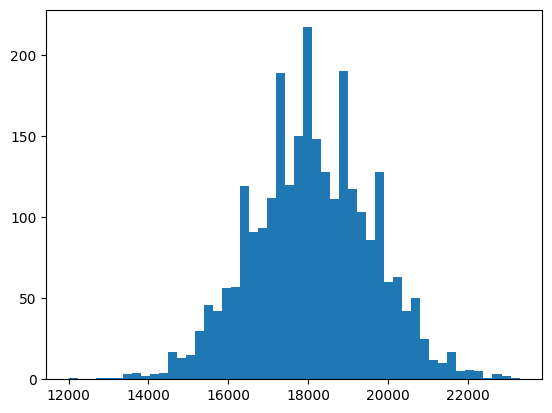

...

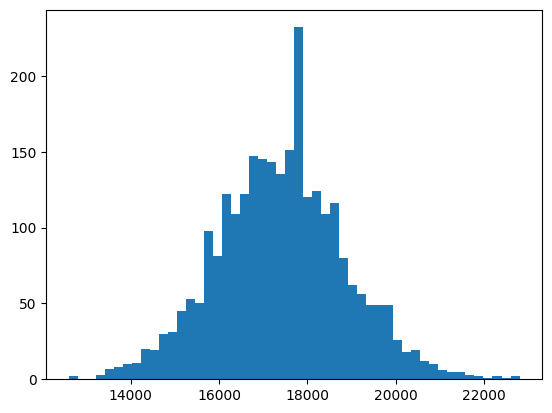

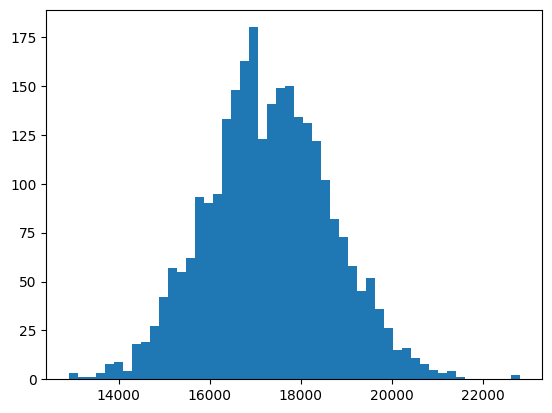

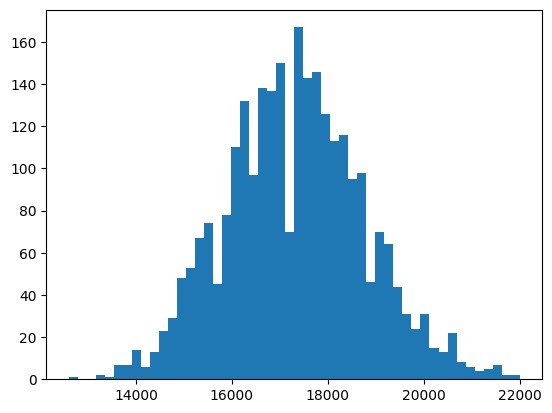

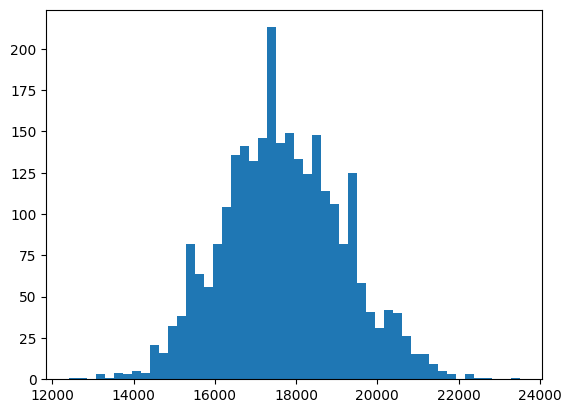

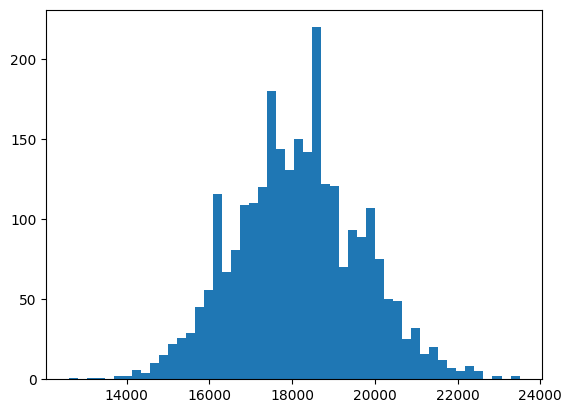

In [81]:
for i in range(int(len(counts)/(nrows*ncols*xsteps*ysteps))):
    plt.hist(counts[i*nrows*ncols*xsteps*ysteps:nrows*ncols*xsteps*ysteps*(i+1)],bins=50)
    plt.show()

### 2023.10.05

In [46]:
# small scan to find MOT signal
# datetime_str = "2023-10-05\\13"
# h5_file = h5py.File(os.path.join(results,datetime_str,"000006092-CoilScanSPCMCount.h5"))
# datafile = os.path.join(results,datetime_str,"20231005_131057_coil_scan.csv")

# small scan with FORT on the whole time - shows clear single atom signal
date_str = "2023-10-05"
h5_file = h5py.File(os.path.join(results,date_str,"15","000006115-CoilScanSPCMCount.h5"))
datafile = os.path.join(results,date_str,"15","20231005_152030_coil_scan.csv")

# same as the experiment above but with the FORT off
# date_str = "2023-10-05"
# h5_file = h5py.File(os.path.join(results,date_str,"16","000006116-CoilScanSPCMCount.h5"))
# datafile = os.path.join(results,date_str,"16","20231005_160350_coil_scan.csv")

[x for x in h5_file.values()]

[<HDF5 group "/archive" (61 members)>,
 <HDF5 dataset "artiq_version": shape (), type "|O">,
 <HDF5 group "/datasets" (30 members)>,
 <HDF5 dataset "expid": shape (), type "|O">,
 <HDF5 dataset "rid": shape (), type "<i4">,
 <HDF5 dataset "run_time": shape (), type "<f8">,
 <HDF5 dataset "start_time": shape (), type "<f8">]

In [3]:
# experiment variables defined by the experiment, e.g. in the GUI (such as the coil steps) or by subroutines (such as the MOT monitor datasets)
[x for x in h5_file['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_feedback_period_cycles": shape (), type "<f8">,
 <HDF5 dataset "FORT_monitor": shape (34,), type "<f8">,
 <HDF5 dataset "FORT_on": shape (), type "|b1">,
 <HDF5 dataset "MOT1_monitor": shape (34,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (34,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (34,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (34,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (34,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (34,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (34,), type "<f8">,
 <HDF5 dataset "Vx_array": shape (), type "|O">,
 <HDF5 dataset "Vy_array": shape (), type "|

In [147]:
# experiment variables defined in ExperimentVariables
[x for x in h5_file['archive'].values()]

[<HDF5 dataset "AOM_A1_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AZ_bottom_volts_MOT"

In [47]:
fort_on = np.single(h5_file['datasets']['FORT_on'])
fort_on_str = 'FORT_on' if fort_on else 'FORT_off' # for file saving
print(fort_on_str)

FORT_on


In [48]:
t_exp = np.single(h5_file['archive']['t_SPCM_exposure']) # numpy's float datatype 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [49]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [50]:
### nrows and ncols are the number of subplots in each image
nrows = 1
ncols = 5
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [51]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

25

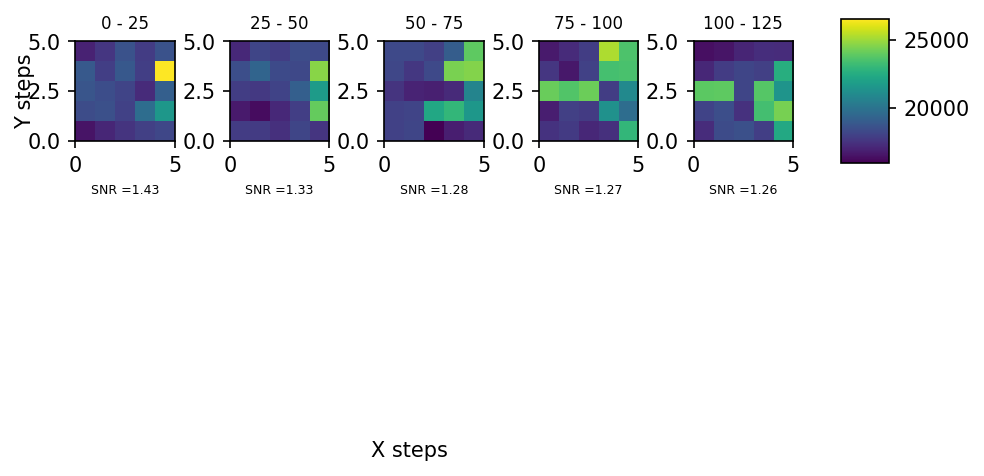

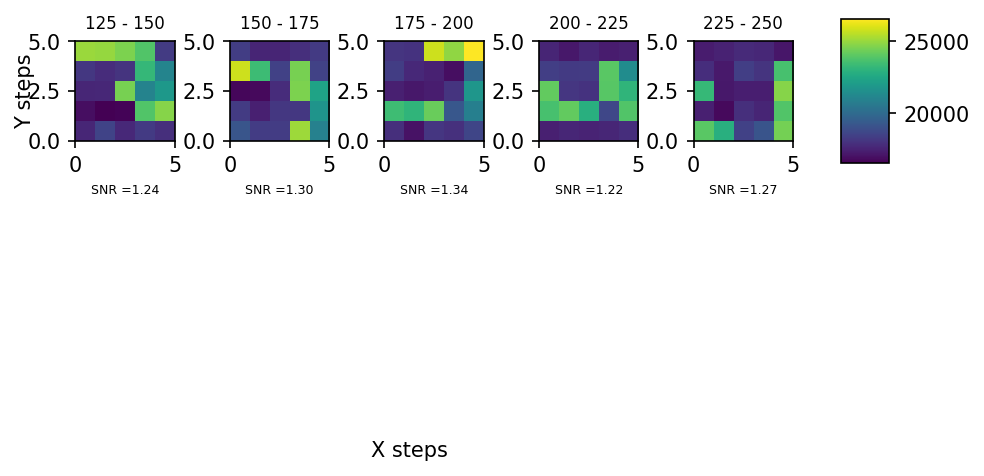

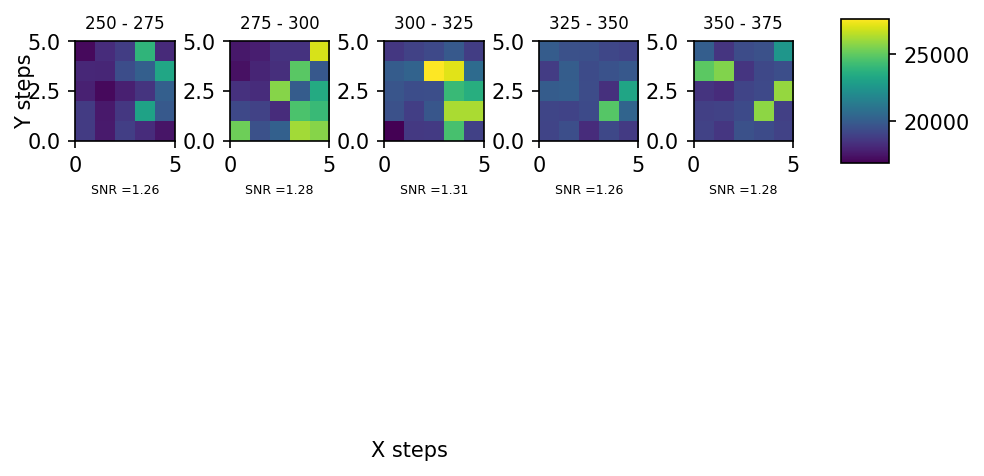

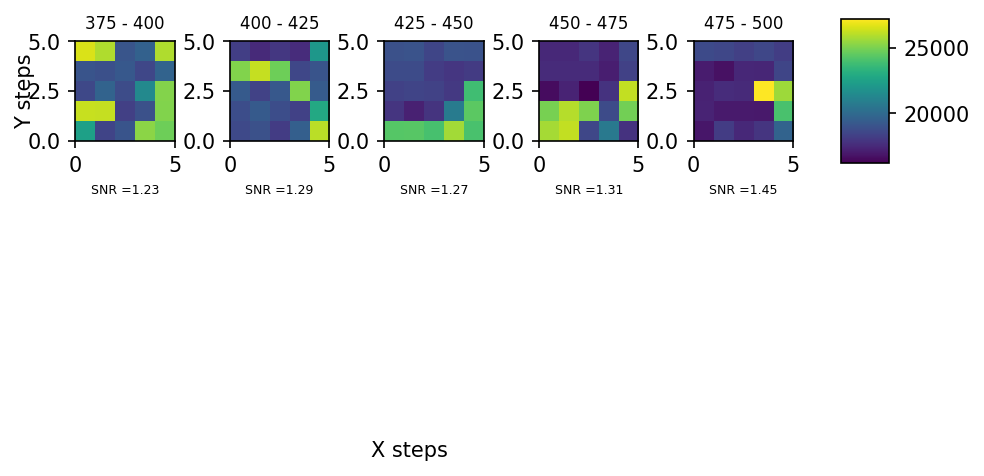

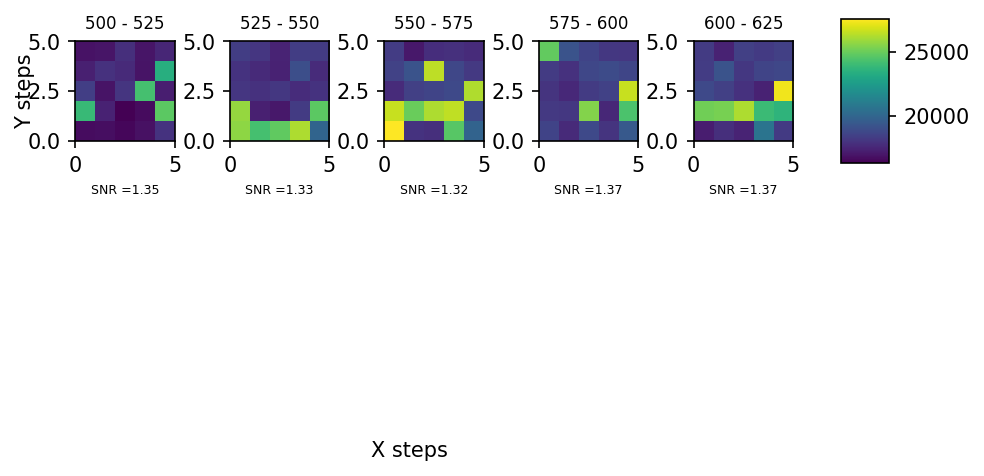

In [52]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols,dpi = 150)#,constrained_layout=True)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        figdata = counts[ysteps*xsteps*zbottom_steps*k:ysteps*xsteps*zbottom_steps*k+nrows*ncols*xsteps*ysteps] # this is the data that spans the whole figure
        
        # raw, unscaled data
        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=min(figdata), vmax=max(figdata)) #, vmin=mincounts, vmax=maxcounts)
        snr = np.max(imdata)/np.mean(imdata)
        ax.set_xlabel(f"SNR ={snr:.2f}",fontsize=6)
        
        # scaled/offset data
        # scaled = imdata/np.mean(imdata) # this essentially shows us what the signal is
        # im = ax.imshow(scaled, extent=[ymin, ymax, xmin, xmax]) #vmin=mincounts, vmax=maxcounts)
        
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.4, 0.05, 0.2])
    plt.colorbar(im, cax=cbar_ax)
    # fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
        # plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
        # plt.close()
    plt.show()

#     break

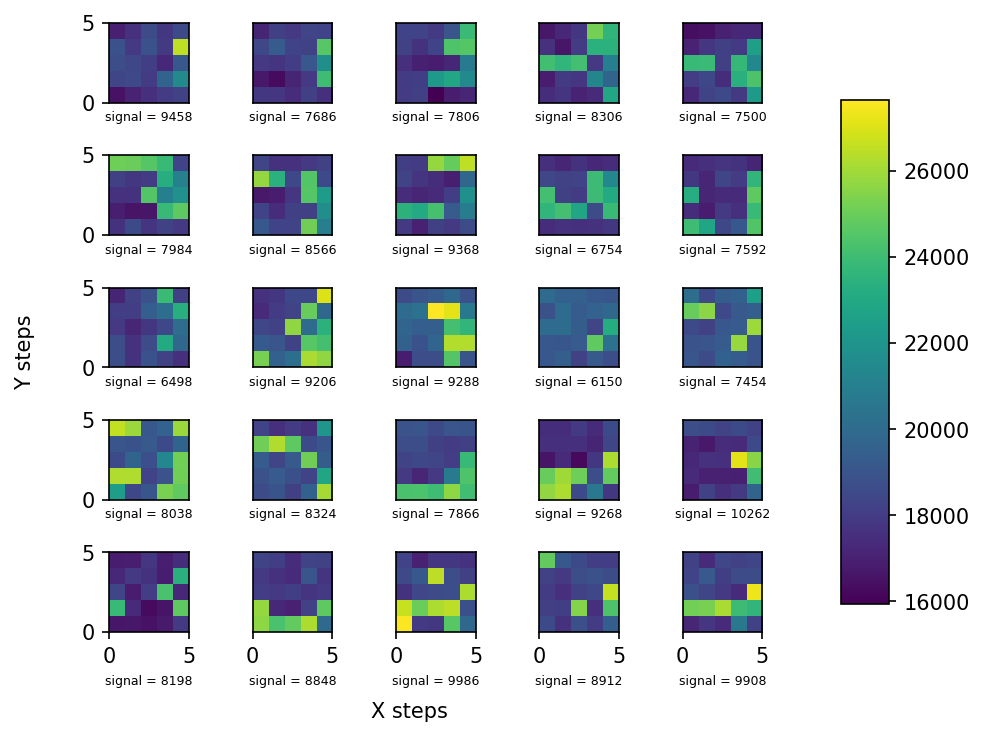

In [53]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

k = 0
ncols = 5
nrows = 5
fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
# for k,ax in zip(range(ztop_steps),axes.flat):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    
for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

    # the step where we start counting from to get the counts at x and y steps
    # for the kth ztop step and lth zbottom step
    step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

    imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

    figdata = counts[ysteps*xsteps*zbottom_steps*k:ysteps*xsteps*zbottom_steps*k+nrows*ncols*xsteps*ysteps] # this is the data that spans the whole figure
    
    # raw, unscaled data
    im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=min(figdata), vmax=max(figdata)) #, vmin=mincounts, vmax=maxcounts)
    # snr = np.max(imdata)/np.mean(imdata)
    # ax.set_xlabel(f"SNR ={snr:.2f}",fontsize=6)
    signal = np.max(imdata) - np.mean(sorted(np.ndarray.flatten(imdata))[:5]) # take the 5 lowest pixels as the background
    ax.set_xlabel(f"signal = {signal:.0f}",fontsize=6)
        
    # scaled/offset data
    # scaled = imdata/np.mean(imdata) # this essentially shows us what the signal is
    # im = ax.imshow(scaled, extent=[ymin, ymax, xmin, xmax]) #vmin=mincounts, vmax=maxcounts)
    
    ax.set_aspect((ymax-ymin)/(xmax-xmin))
    # ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

fig.tight_layout()
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(im, cax=cbar_ax)

fig.text(0.4, 0, 'X steps', ha='center', va='center')
fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
fig.dpi = 150
#         plt.close()
fname = datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + fort_on_str + '.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()

#     break

In [66]:
fname

'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2023-10-05\\15\\20231005_152030_coil_scan_3D_24FORT_on.png'

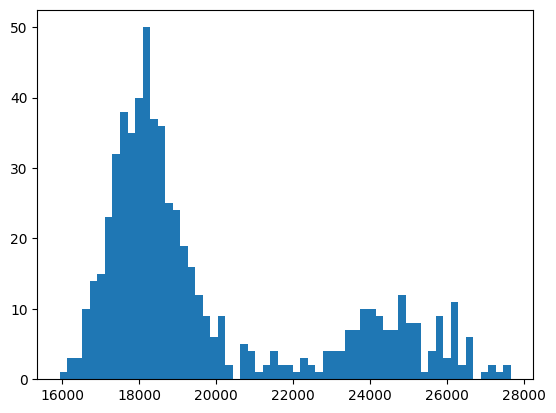

In [54]:
plt.hist(counts, bins=60)
# plt.legend()
fname = datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + fort_on_str+'histogram.png'
plt.savefig(fname,bbox_inches='tight')
plt.show()

maxidx=42, maxct=4239.999936819077, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.92340283203125, 8.223440185546876, 0.920299072265625, -0.027497070312499983)


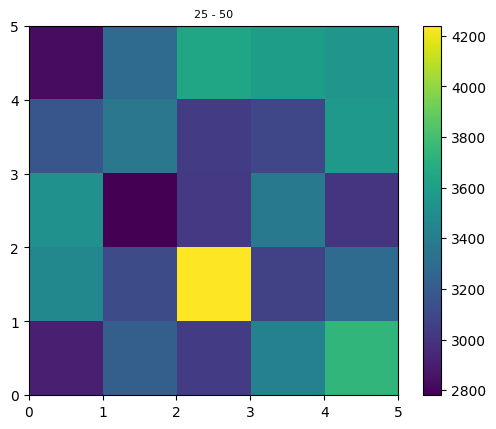

In [123]:
# local max for a given step range
step0 = 25

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax])#, vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

### 2023.10.04

In [3]:
datetime_str = "2023-10-03\\17"
h5_file = h5py.File(os.path.join(results,"2023-10-02\\17","000005993-CoilScanSPCMCount.h5")) # not the same scan but I didn't change the SPCM exposure time since this one
datafile = os.path.join(results,datetime_str,"20231003_172206_coil_scan.csv")
[x for x in h5_file.values()]

[<HDF5 group "/archive" (61 members)>,
 <HDF5 dataset "artiq_version": shape (), type "|O">,
 <HDF5 group "/datasets" (29 members)>,
 <HDF5 dataset "expid": shape (), type "|O">,
 <HDF5 dataset "rid": shape (), type "<i4">,
 <HDF5 dataset "run_time": shape (), type "<f8">,
 <HDF5 dataset "start_time": shape (), type "<f8">]

In [7]:
[x for x in h5_file['archive'].values()]

[<HDF5 dataset "AOM_A1_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AZ_bottom_volts_MOT"

In [18]:
# experiment variables defined by the experiment, e.g. in the GUI (such as the coil steps) or by subroutines (such as the MOT monitor datasets)
[x for x in h5_file['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_feedback_period_cycles": shape (), type "<f8">,
 <HDF5 dataset "FORT_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT1_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "Vx_array": shape (), type "|O">,
 <HDF5 dataset "Vy_array": shape (), type "|O">,
 <HDF5 dataset "Vz_bottom_array": sh

In [20]:
# experiment variables defined in ExperimentVariables
[x for x in h5_file['archive'].values()]

[<HDF5 dataset "AOM_A1_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AZ_bottom_volts_MOT"

In [93]:
t_exp = np.single(h5_file['archive']['t_SPCM_exposure']) # numpy's float datatype 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [94]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [95]:
### nrows and ncols are the number of subplots in each image
nrows = 3
ncols = 5
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [96]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

225

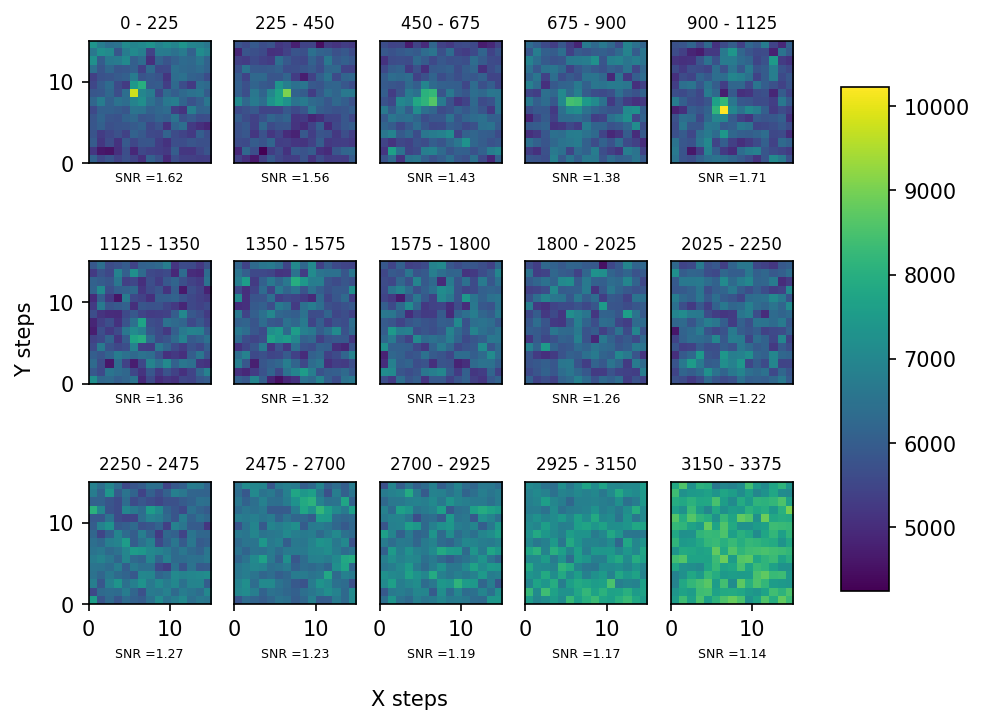

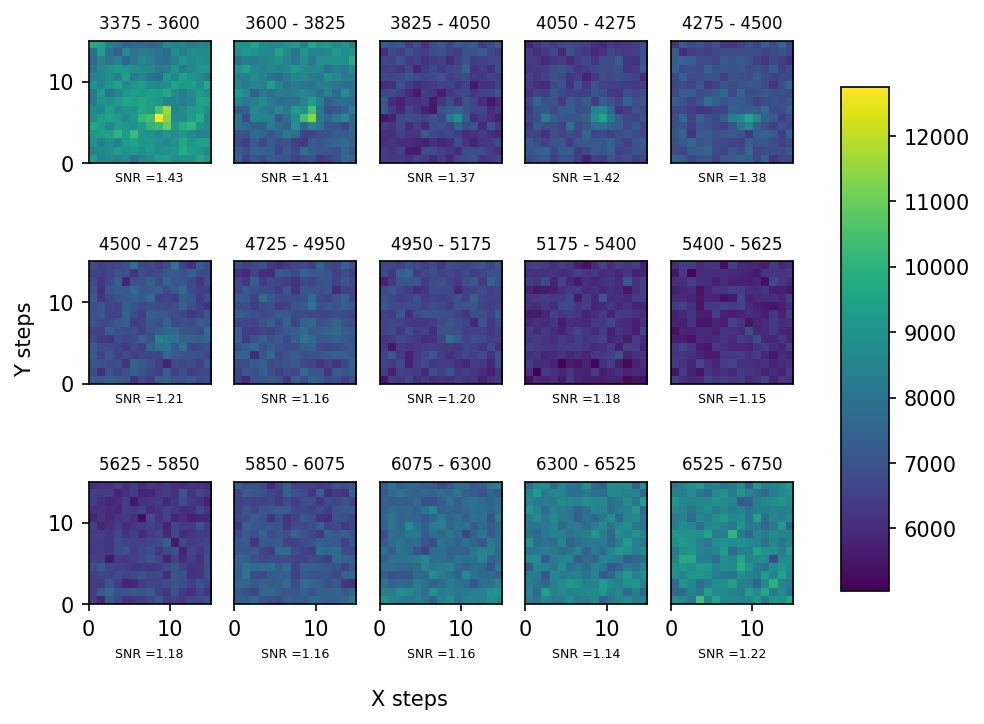

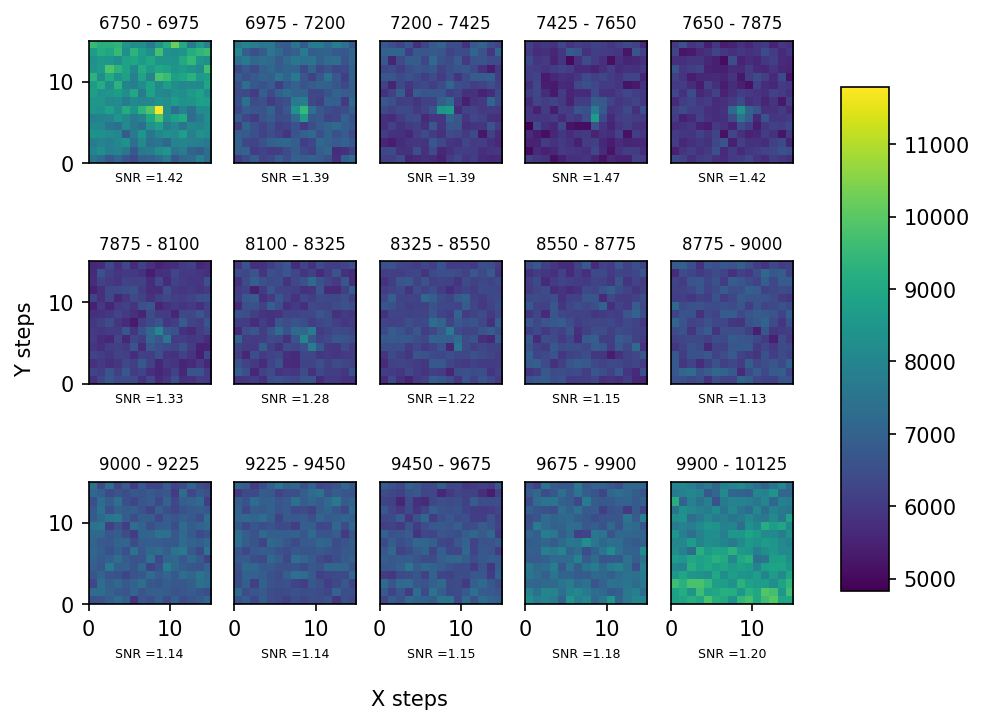

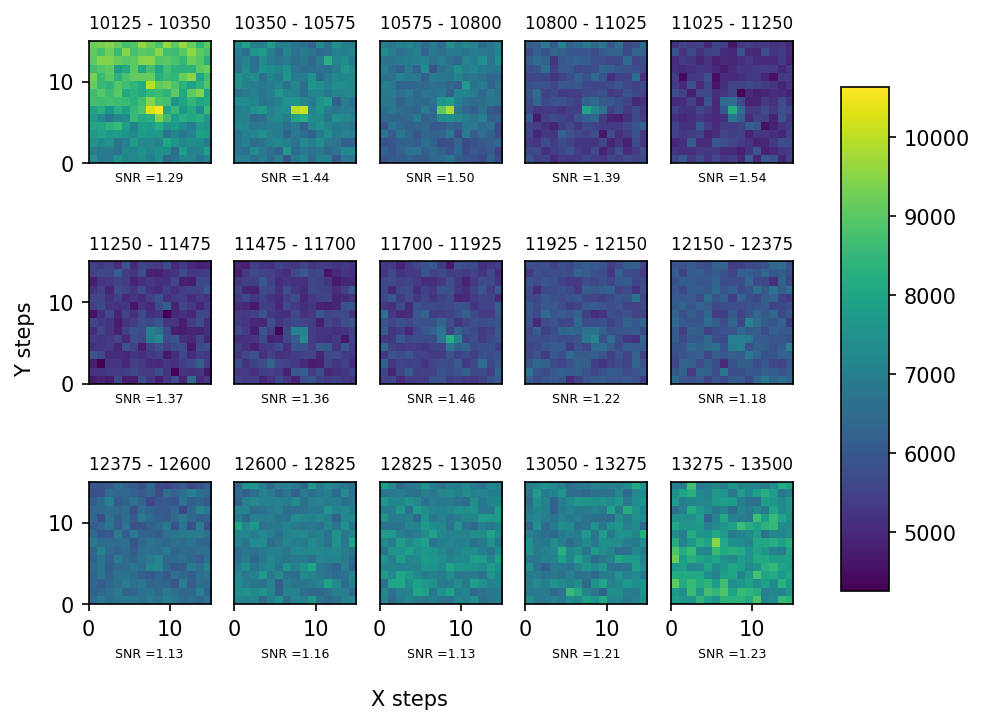

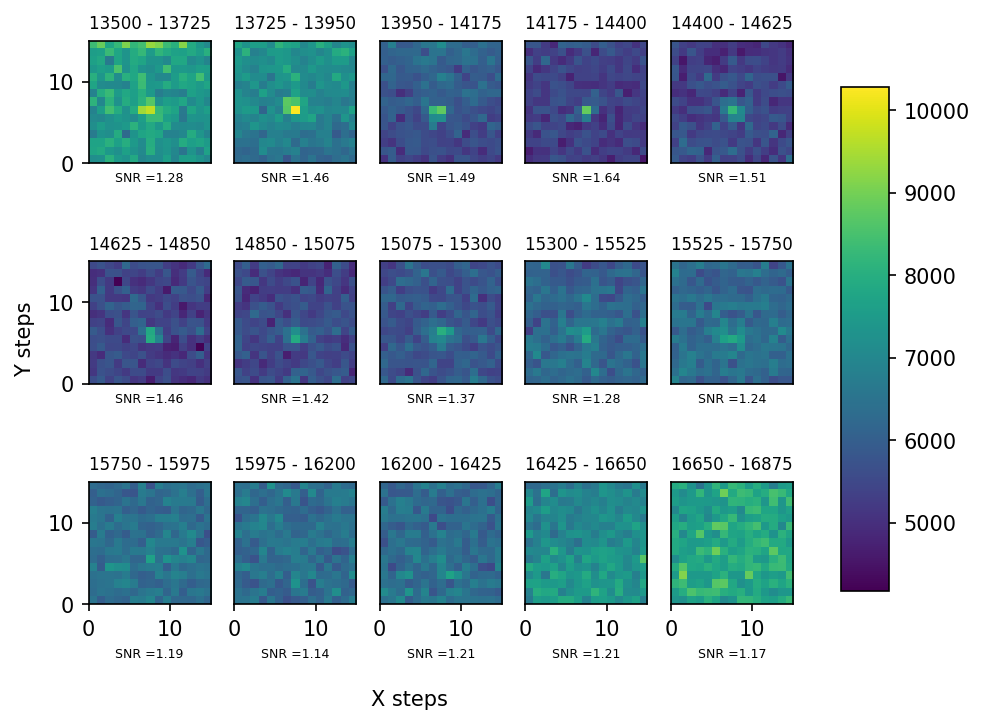

...

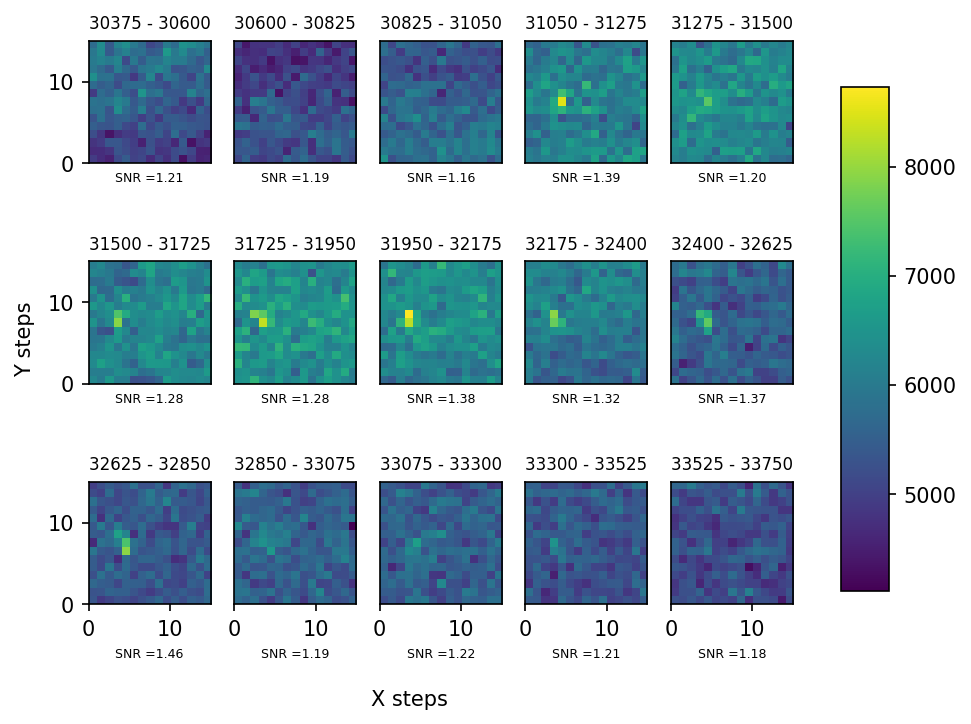

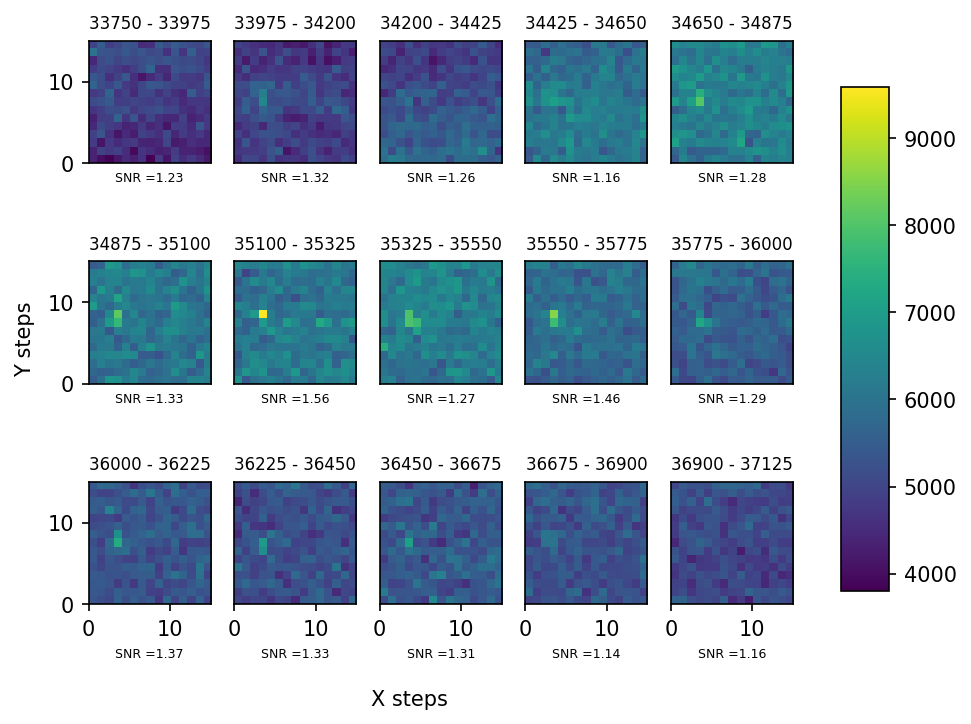

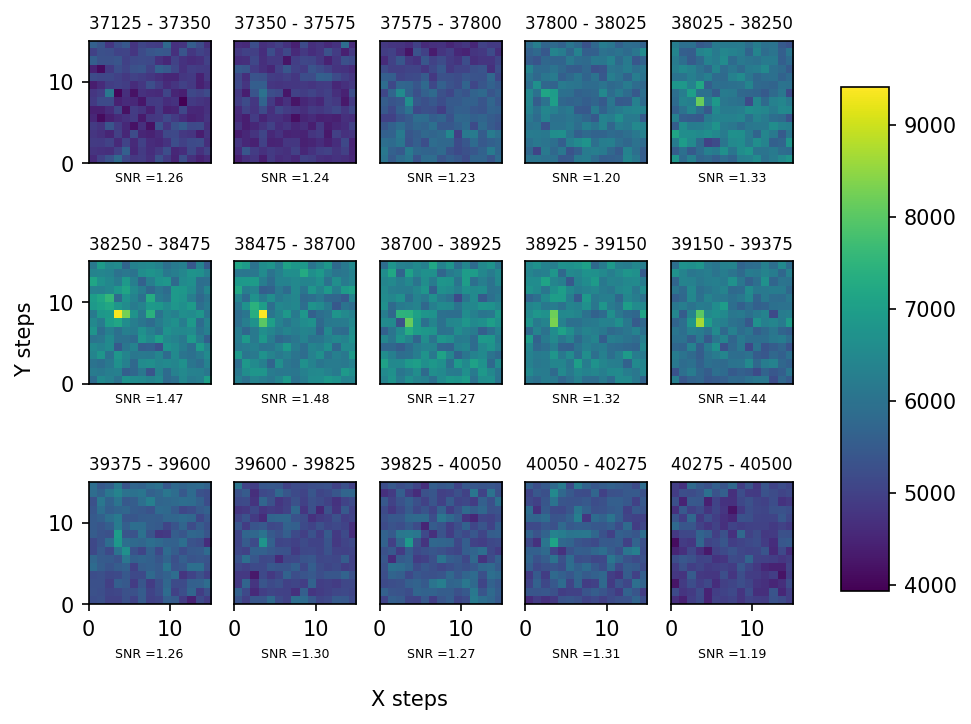

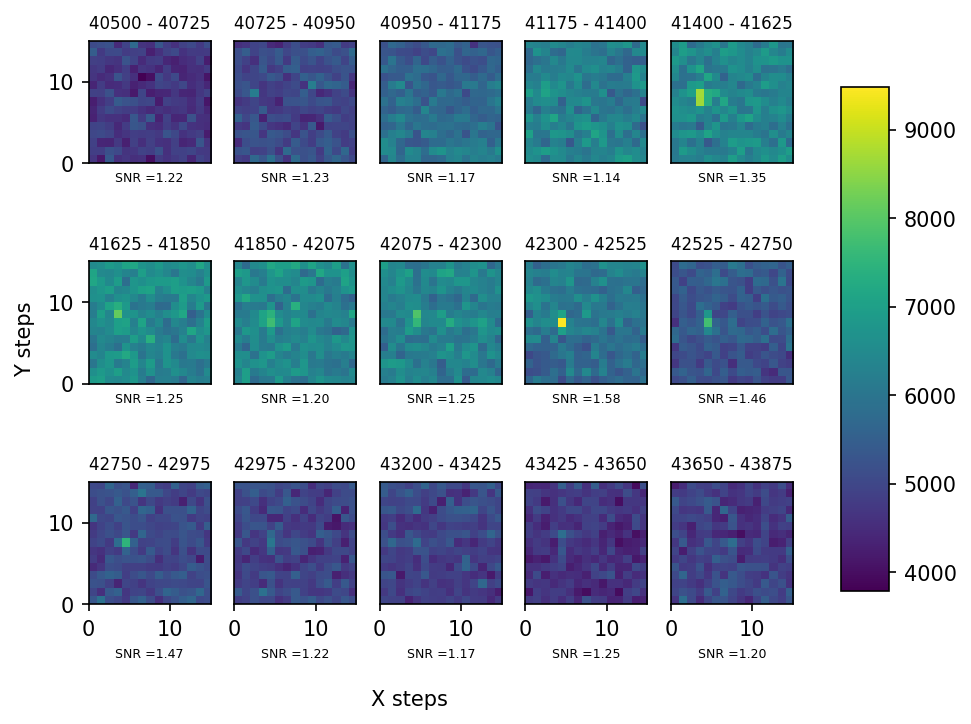

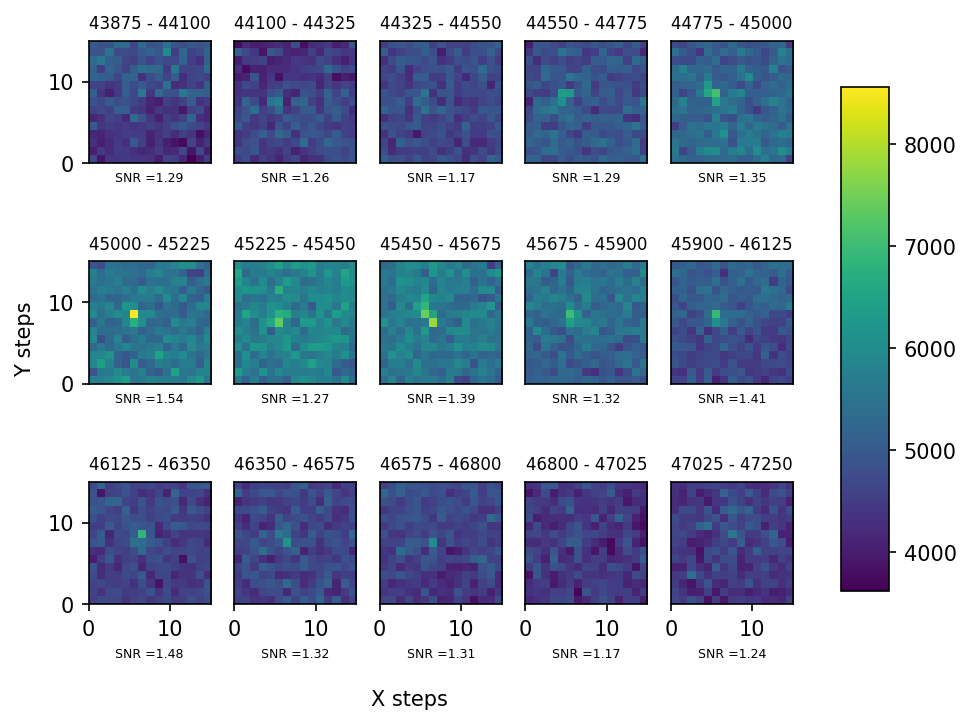

In [112]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps-1):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        figdata = counts[ysteps*xsteps*zbottom_steps*k:ysteps*xsteps*zbottom_steps*k+nrows*ncols*xsteps*ysteps] # this is the data that spans the whole figure
        
        # raw, unscaled data
        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=min(figdata), vmax=max(figdata)) #, vmin=mincounts, vmax=maxcounts)
        snr = np.max(imdata)/np.mean(imdata)
        ax.set_xlabel(f"SNR ={snr:.2f}",fontsize=6)
        
        # scaled/offset data
        # scaled = imdata/np.mean(imdata) # this essentially shows us what the signal is
        # im = ax.imshow(scaled, extent=[ymin, ymax, xmin, xmax]) #vmin=mincounts, vmax=maxcounts)
        
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

maxidx=21276, maxct=7339.999890625479, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.694428571428572, 8.123142857142858, 0.5128571428571429, -0.08585714285714287)


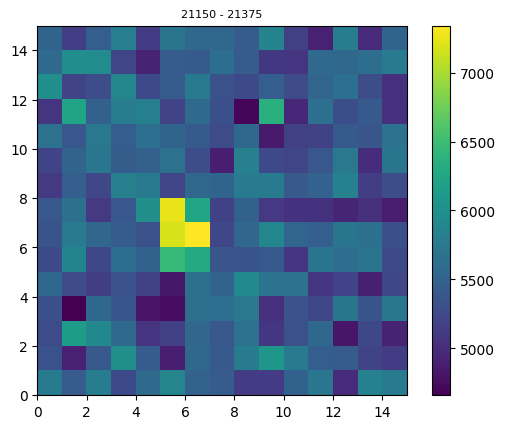

In [115]:
# local max for a given step range
step0 = 28350 # this gave probably the best snr but the peak is very narrow and I don't see an SPCM signal for these coil settings.
step0 = 29025 # peak is still too narrow and I don't see an SPCM signal for these coil settings.
step0 = 21150

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax])#, vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

### 2023.10.03

In [78]:
datetime_str = "2023-10-02\\17"
h5_file = h5py.File(os.path.join(results,datetime_str,"000005993-CoilScanSPCMCount.h5"))
datafile = os.path.join(results,datetime_str,"20231002_175024_coil_scan.csv")
[x for x in h5_file.values()]

[<HDF5 group "/archive" (61 members)>,
 <HDF5 dataset "artiq_version": shape (), type "|O">,
 <HDF5 group "/datasets" (29 members)>,
 <HDF5 dataset "expid": shape (), type "|O">,
 <HDF5 dataset "rid": shape (), type "<i4">,
 <HDF5 dataset "run_time": shape (), type "<f8">,
 <HDF5 dataset "start_time": shape (), type "<f8">]

In [18]:
# experiment variables defined by the experiment, e.g. in the GUI (such as the coil steps) or by subroutines (such as the MOT monitor datasets)
[x for x in h5_file['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_feedback_period_cycles": shape (), type "<f8">,
 <HDF5 dataset "FORT_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT1_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "Vx_array": shape (), type "|O">,
 <HDF5 dataset "Vy_array": shape (), type "|O">,
 <HDF5 dataset "Vz_bottom_array": sh

In [20]:
# experiment variables defined in ExperimentVariables
[x for x in h5_file['archive'].values()]

[<HDF5 dataset "AOM_A1_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AZ_bottom_volts_MOT"

In [79]:
t_exp = np.single(h5_file['archive']['t_SPCM_exposure']) # numpy's float datatype 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [80]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [82]:
### nrows and ncols are the number of subplots in each image
nrows = 3
ncols = 5
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [83]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

225

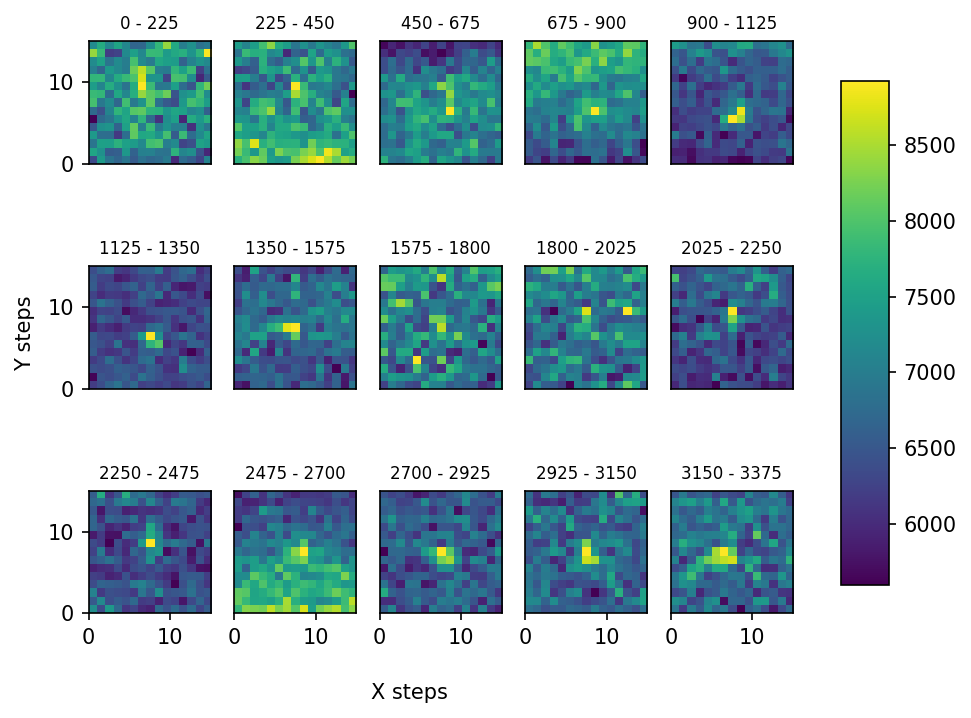

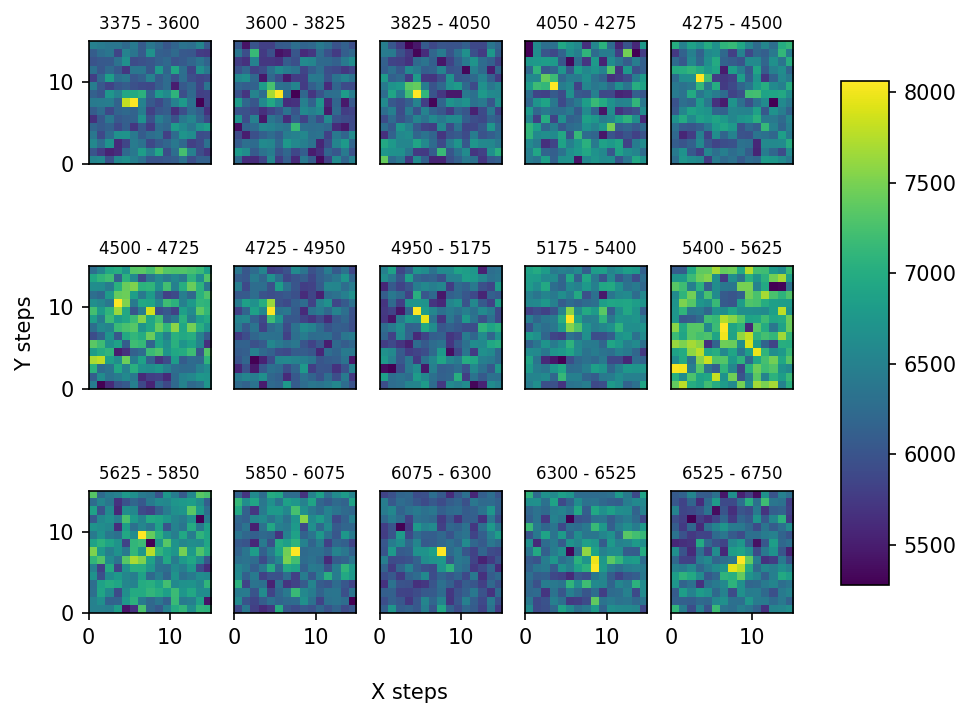

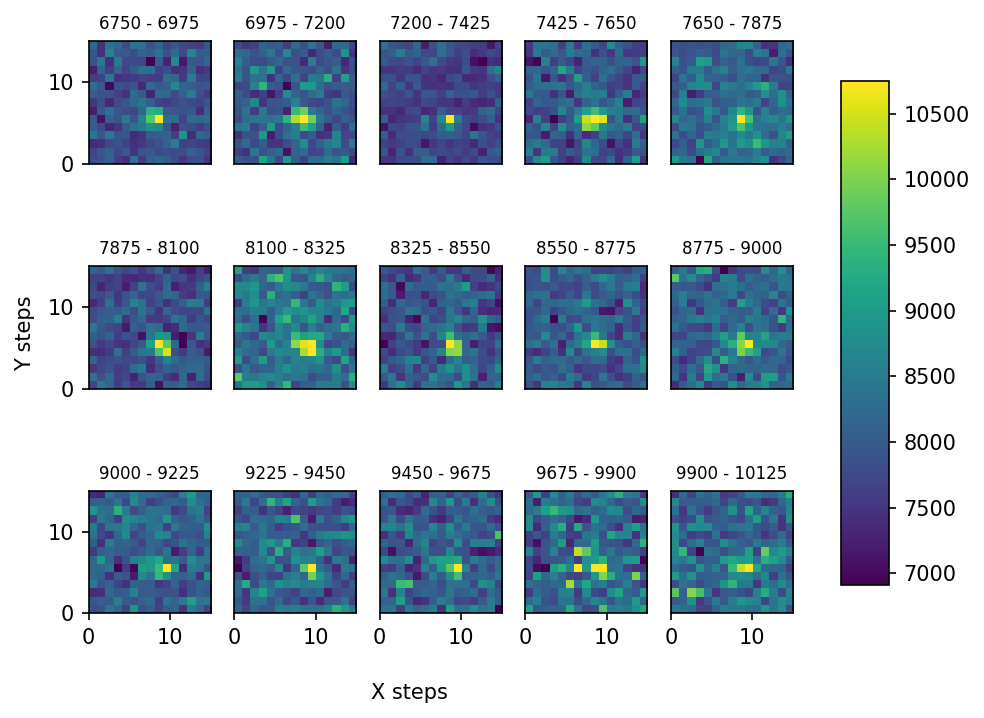

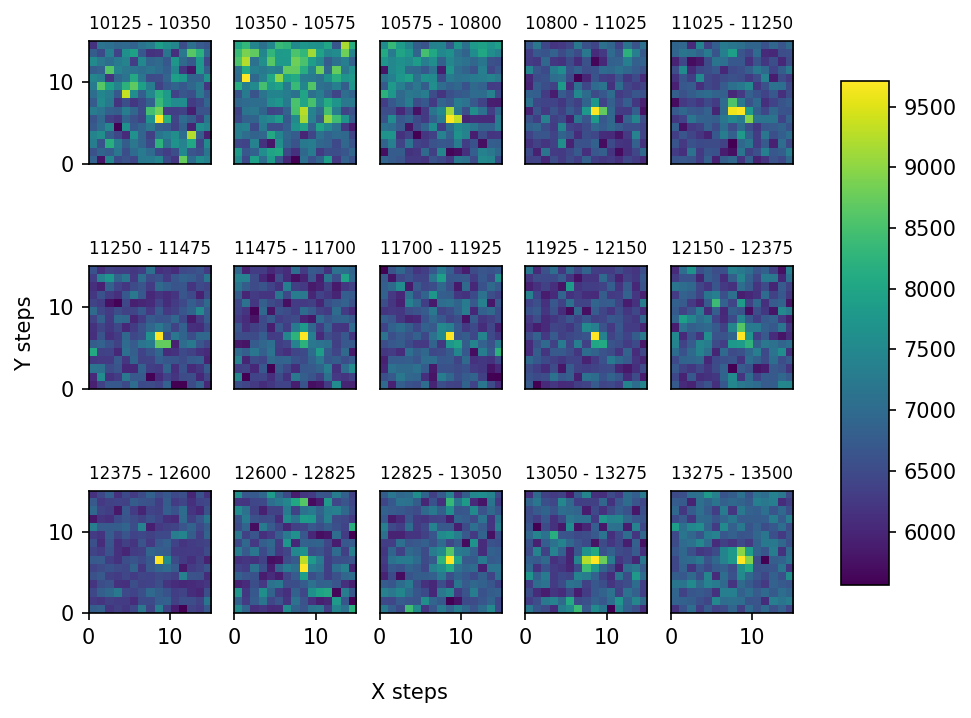

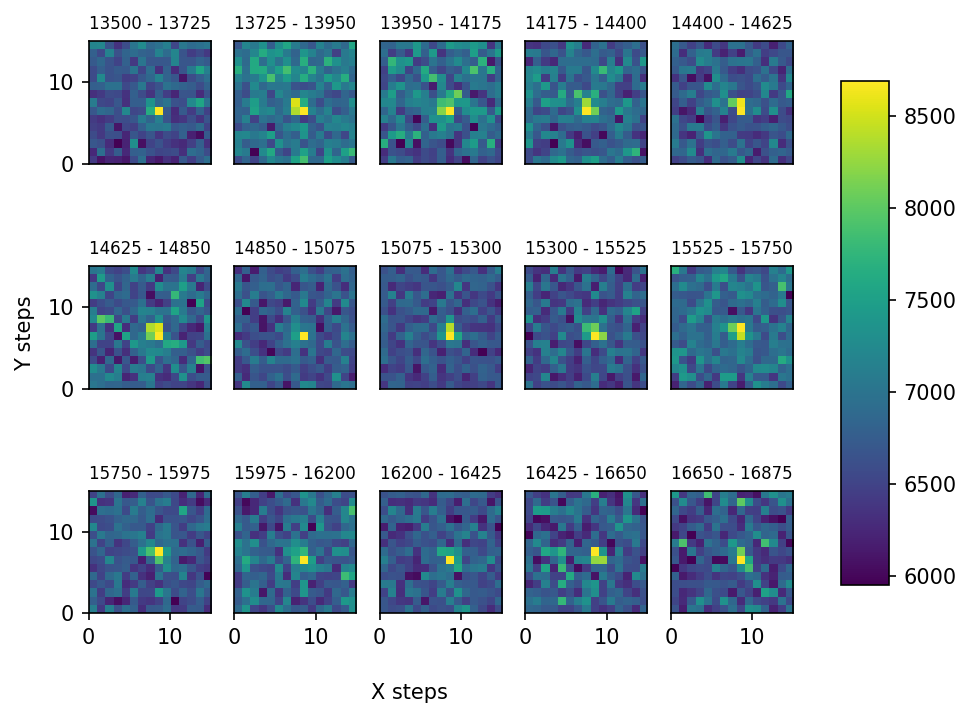

...

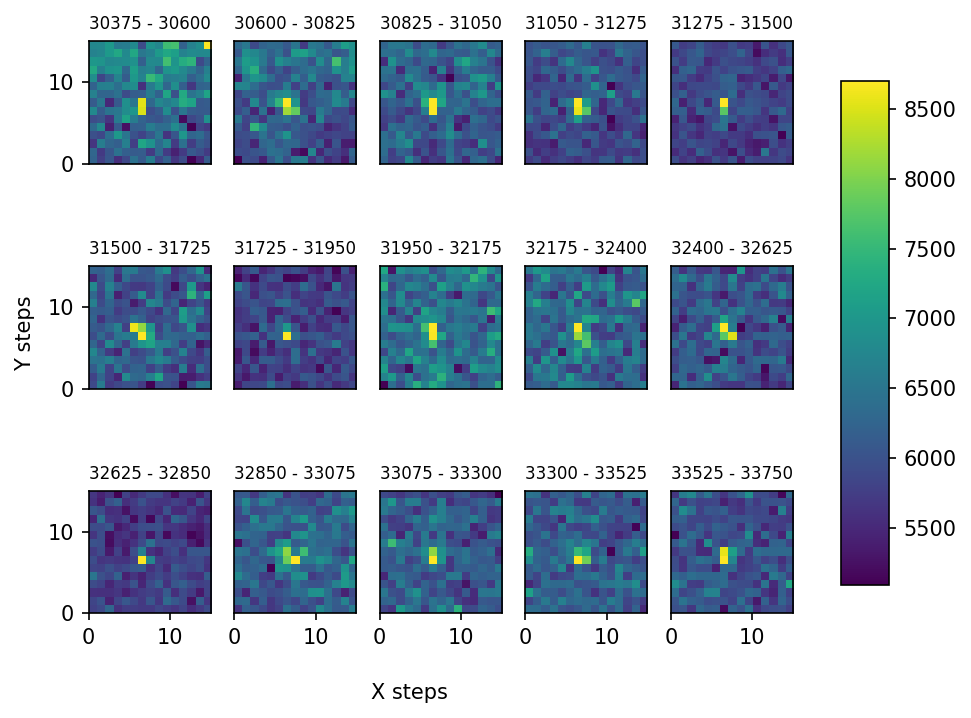

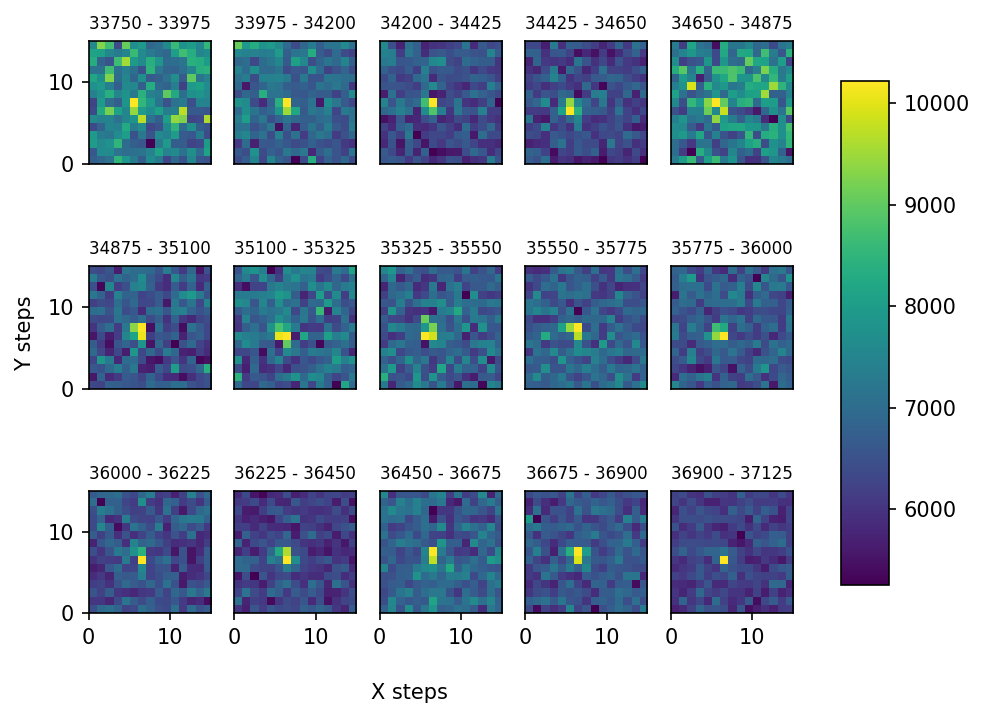

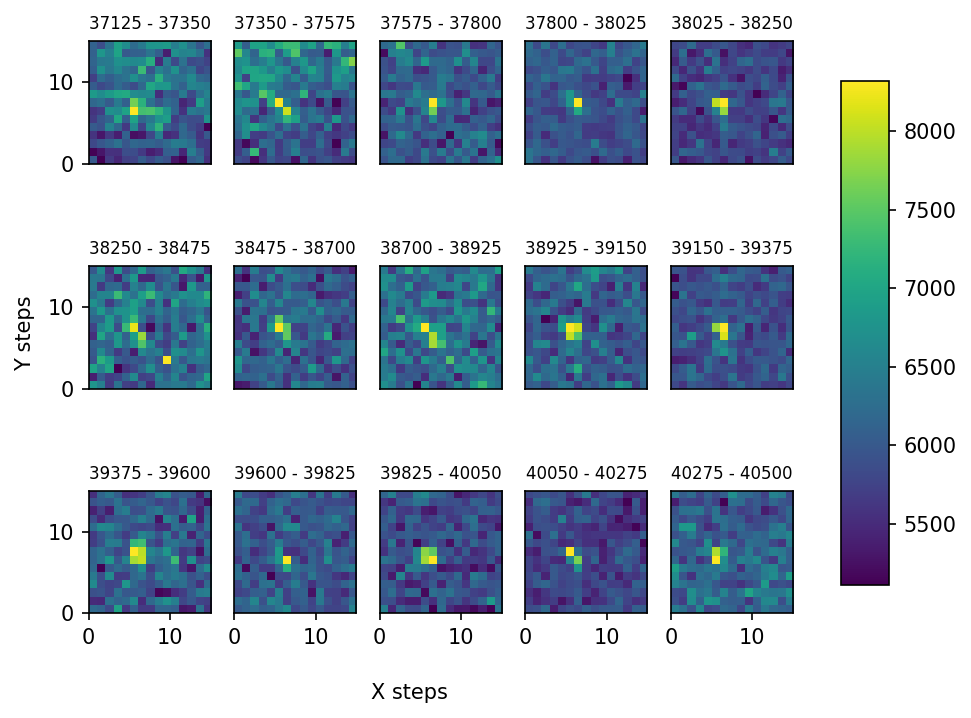

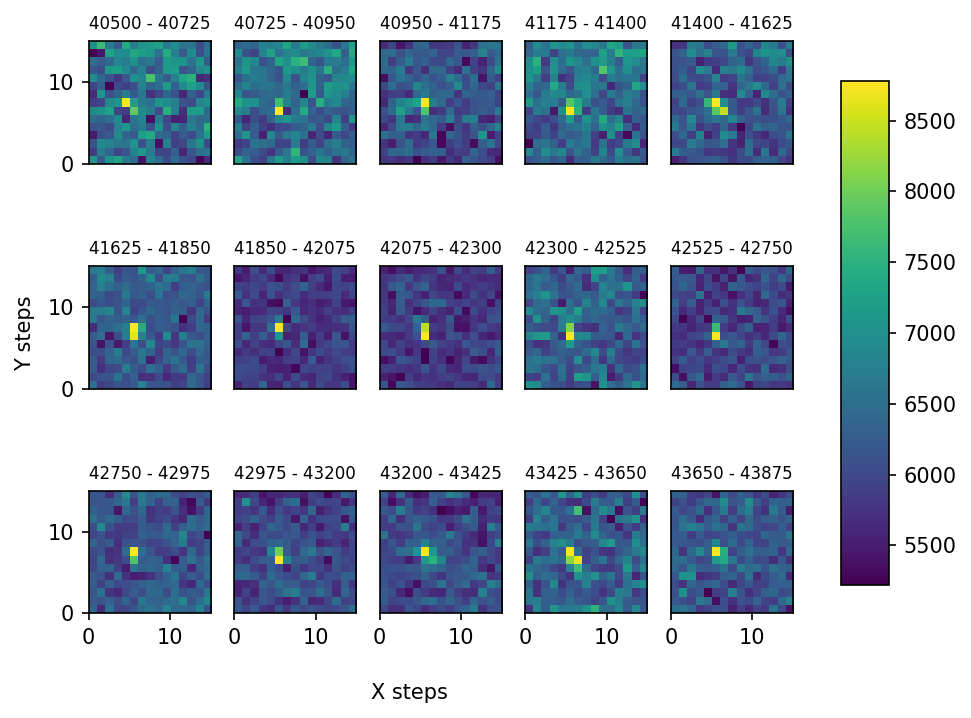

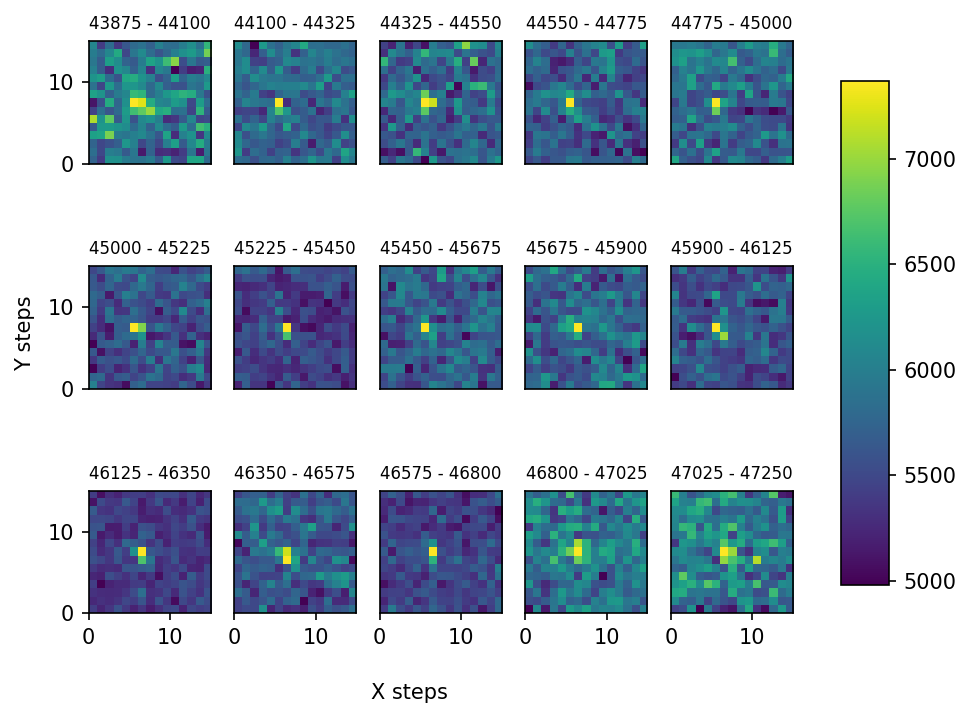

In [87]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps-1):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax]) #, vmin=mincounts, vmax=maxcounts)
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

maxidx=22837, maxct=8169.999878257515, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (7.823142857142857, 8.165714285714285, 0.47, -0.043)


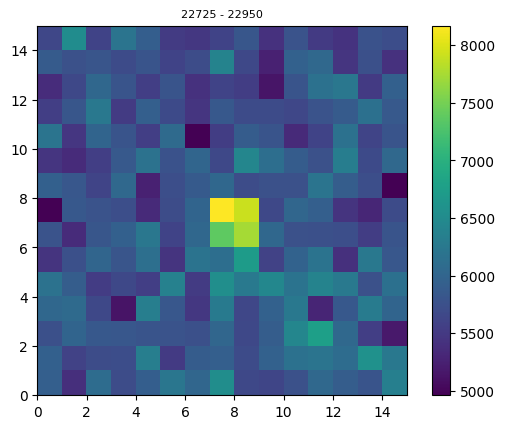

In [89]:
# Starting with these settings, I was able to manually tune coils to get ~ 9000 Hz (the fluorescence
# background was around 5000 though)
# 6.05 V, 6.55 V, 0.07 V, -0.17 V

# local max for a given step range
step0 = 22725 #49500  # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax])#, vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

### 2023.10.02

In [71]:
datetime_str = "2023-09-29\\20"
h5_file = h5py.File(os.path.join(results,datetime_str,"000005880-CoilScanSPCMCount.h5"))
datafile = os.path.join(results,datetime_str,"20230929_205906_coil_scan.csv")
[x for x in h5_file.values()]

[<HDF5 group "/archive" (61 members)>,
 <HDF5 dataset "artiq_version": shape (), type "|O">,
 <HDF5 group "/datasets" (29 members)>,
 <HDF5 dataset "expid": shape (), type "|O">,
 <HDF5 dataset "rid": shape (), type "<i4">,
 <HDF5 dataset "run_time": shape (), type "<f8">,
 <HDF5 dataset "start_time": shape (), type "<f8">]

In [18]:
# experiment variables defined by the experiment, e.g. in the GUI (such as the coil steps) or by subroutines (such as the MOT monitor datasets)
[x for x in h5_file['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_feedback_period_cycles": shape (), type "<f8">,
 <HDF5 dataset "FORT_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT1_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "Vx_array": shape (), type "|O">,
 <HDF5 dataset "Vy_array": shape (), type "|O">,
 <HDF5 dataset "Vz_bottom_array": sh

In [20]:
# experiment variables defined in ExperimentVariables
[x for x in h5_file['archive'].values()]

[<HDF5 dataset "AOM_A1_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AZ_bottom_volts_MOT"

In [72]:
t_exp = np.single(h5_file['archive']['t_SPCM_exposure']) # numpy's float datatype 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [73]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [74]:
### nrows and ncols are the number of subplots in each image
nrows = 4
ncols = 4
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [75]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

196

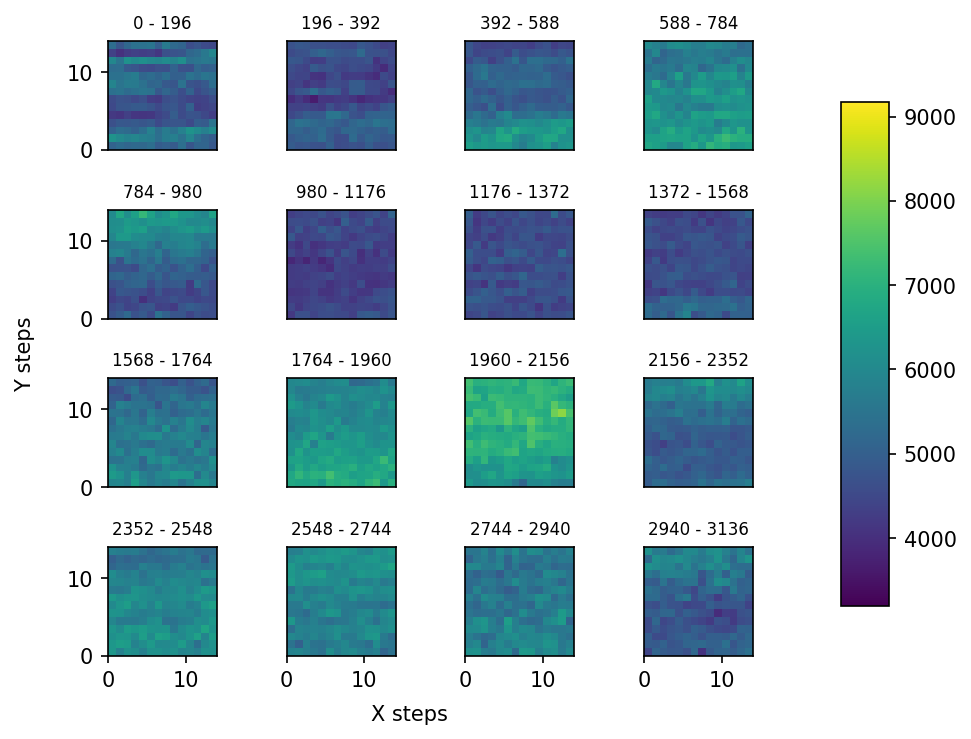

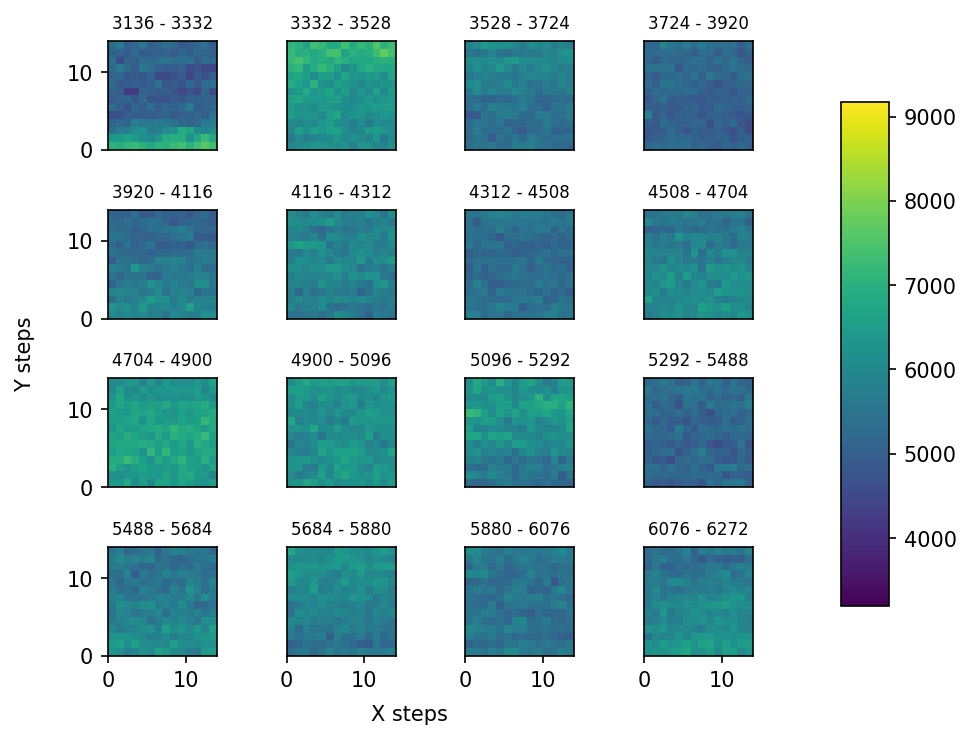

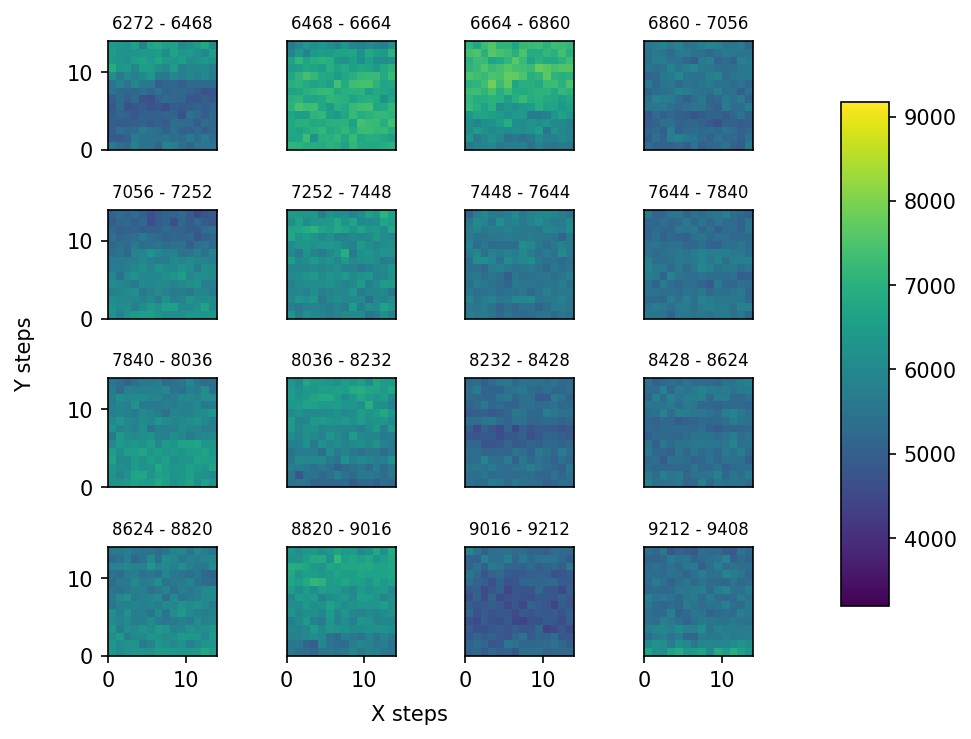

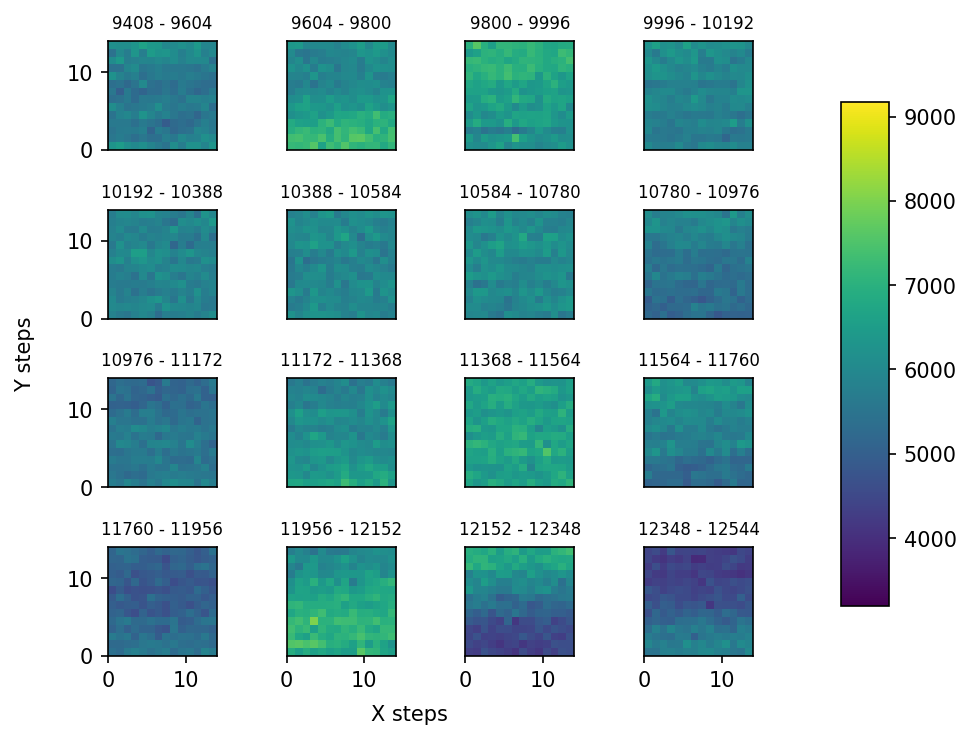

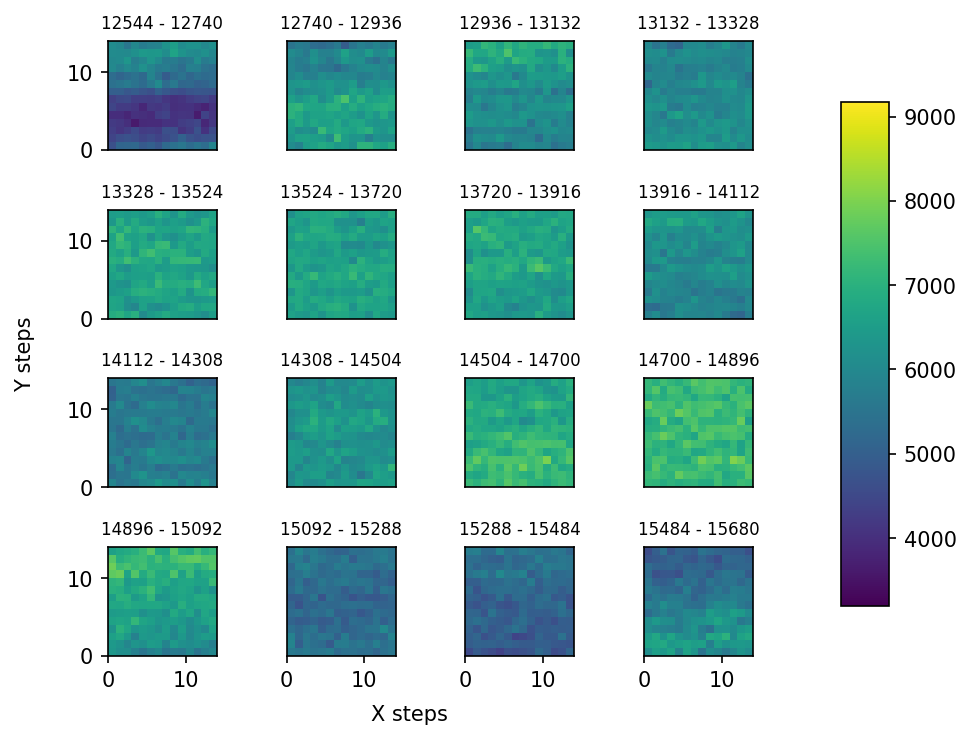

...

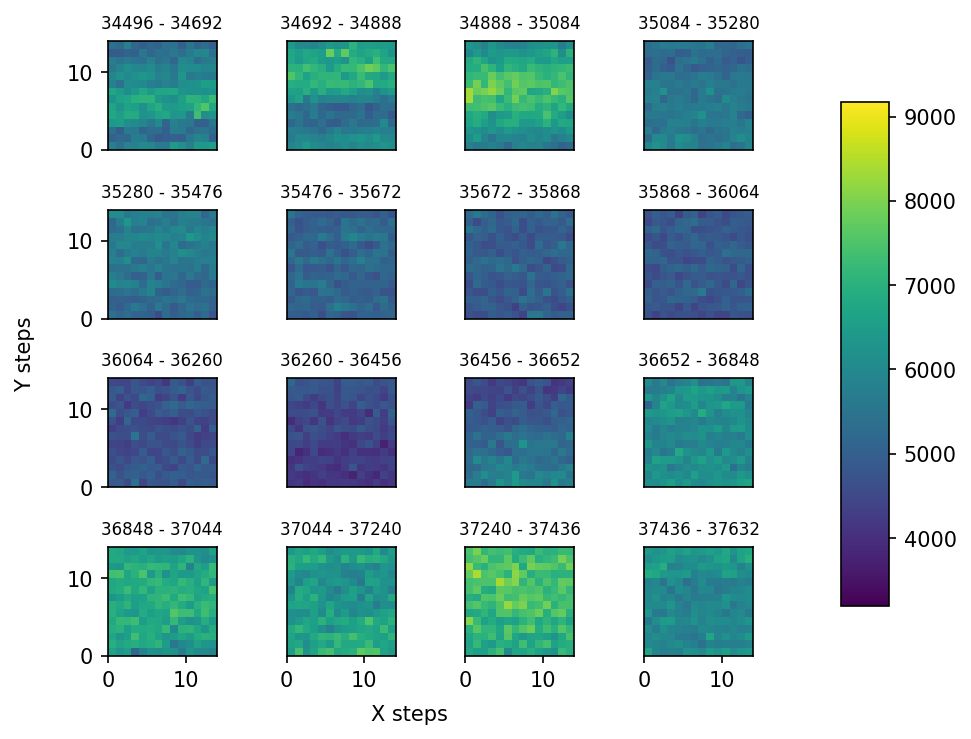

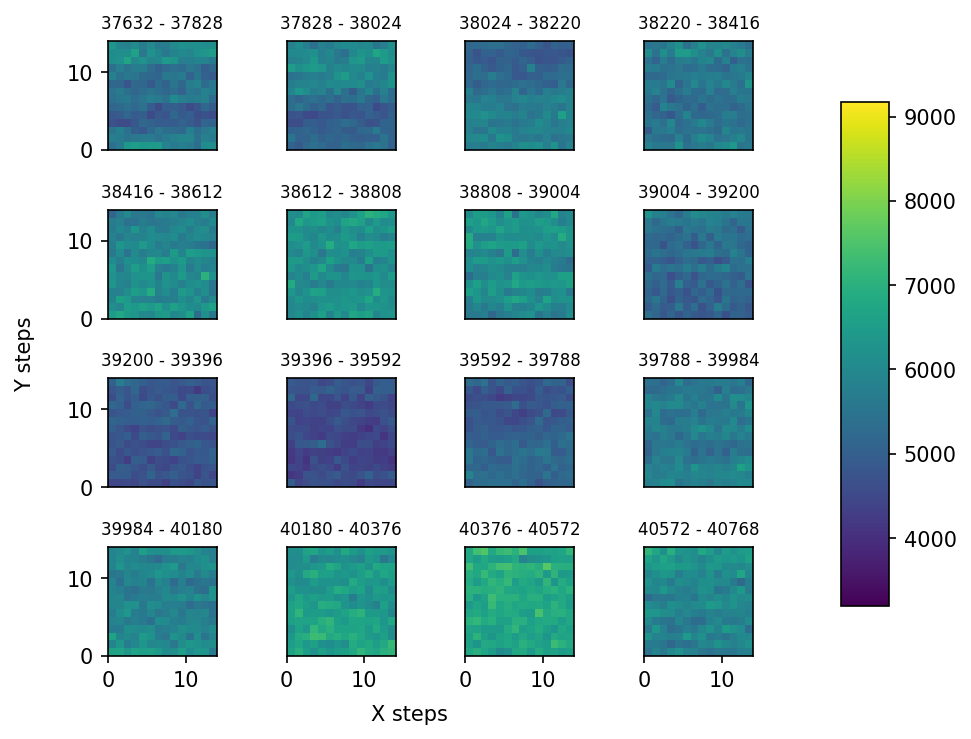

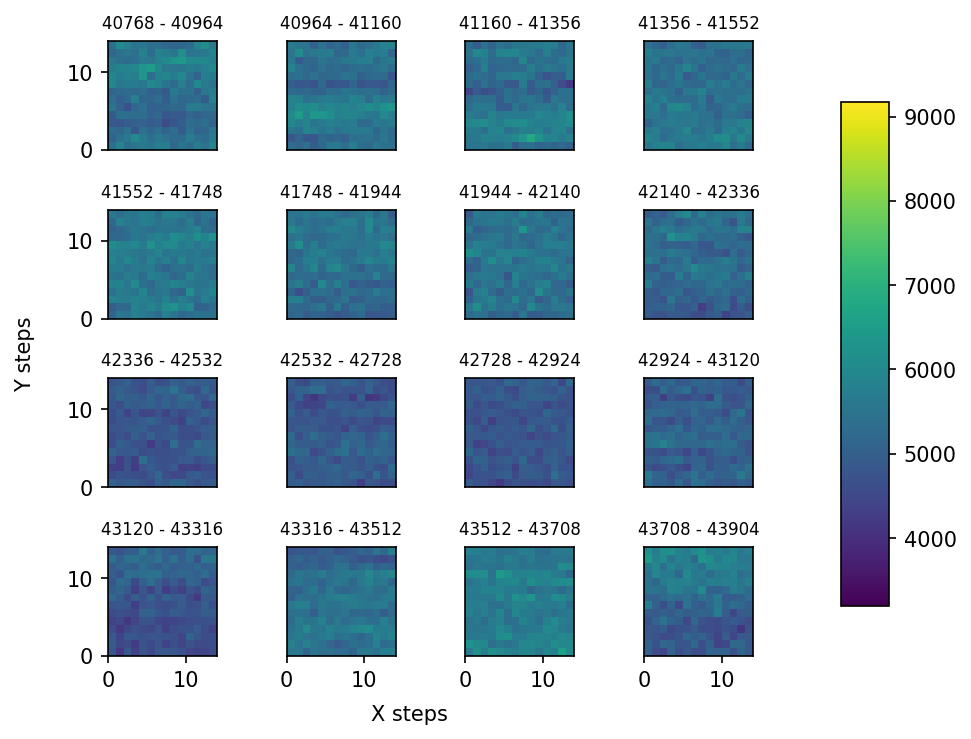

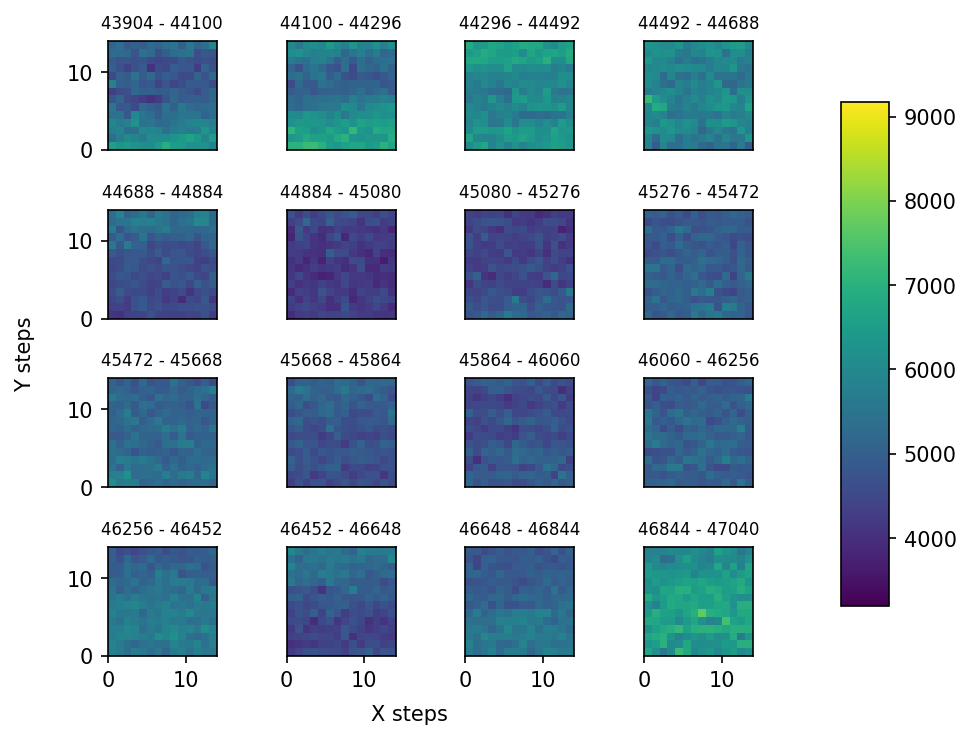

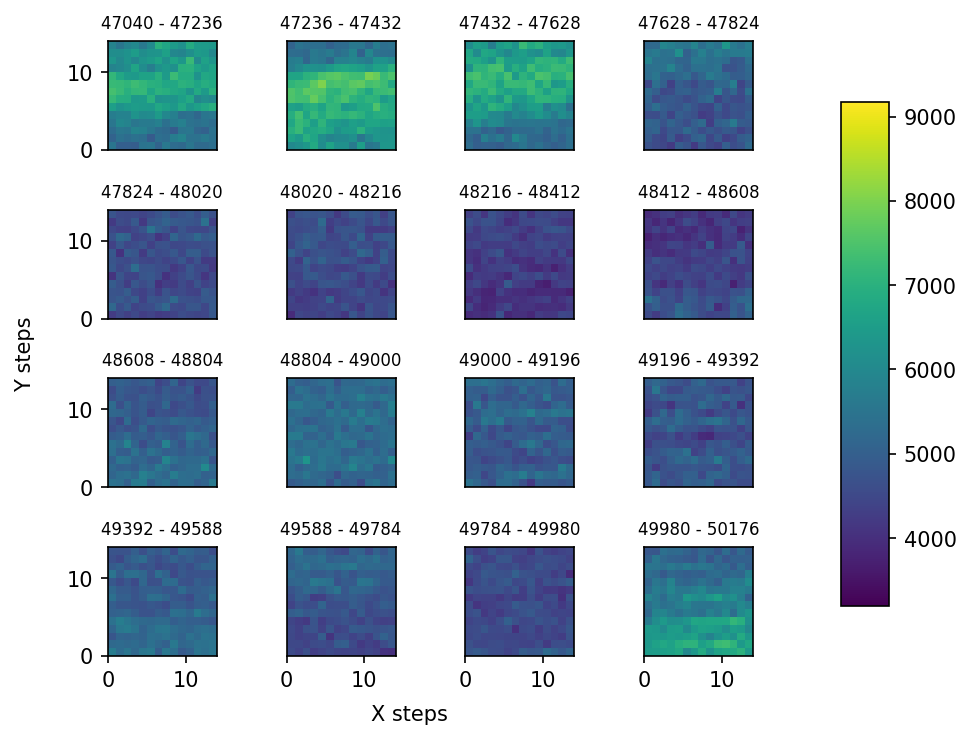

In [77]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

maxidx=833, maxct=7076.66638546521, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (6.96, 7.464, 0.384, 0.04800000000000004)


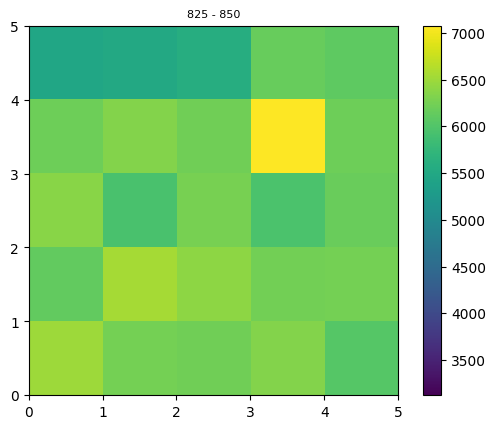

In [70]:
# Starting with these settings, I was able to manually tune coils to get ~ 9000 Hz (the fluorescence
# background was around 5000 though)
# 6.05 V, 6.55 V, 0.07 V, -0.17 V

# local max for a given step range
step0 = 825 #xsteps*ysteps*(200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

### 2023.09.29

In [42]:
# datetime_str = "2023-09-28\\17"
# h5_file = h5py.File(os.path.join(results,datetime_str,"000005739-CoilScanSPCMCount.h5")) # no good data
# datafile = os.path.join(results,datetime_str,"20230928_174929_coil_scan.csv") # no good data

datetime_str = "2023-09-29\\10"
h5_file = h5py.File(os.path.join(results,datetime_str,"000005756-CoilScanSPCMCount.h5")) # 
datafile = os.path.join(results,datetime_str,"20230929_100429_coil_scan.csv") # 
[x for x in h5_file.values()]

[<HDF5 group "/archive" (61 members)>,
 <HDF5 dataset "artiq_version": shape (), type "|O">,
 <HDF5 group "/datasets" (29 members)>,
 <HDF5 dataset "expid": shape (), type "|O">,
 <HDF5 dataset "rid": shape (), type "<i4">,
 <HDF5 dataset "run_time": shape (), type "<f8">,
 <HDF5 dataset "start_time": shape (), type "<f8">]

In [18]:
# experiment variables defined by the experiment, e.g. in the GUI (such as the coil steps) or by subroutines (such as the MOT monitor datasets)
[x for x in h5_file['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_feedback_period_cycles": shape (), type "<f8">,
 <HDF5 dataset "FORT_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT1_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (890,), type "<f8">,
 <HDF5 dataset "Vx_array": shape (), type "|O">,
 <HDF5 dataset "Vy_array": shape (), type "|O">,
 <HDF5 dataset "Vz_bottom_array": sh

In [20]:
# experiment variables defined in ExperimentVariables
[x for x in h5_file['archive'].values()]

[<HDF5 dataset "AOM_A1_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_freq": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AX_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_MOT": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_PGC": shape (), type "<f8">,
 <HDF5 dataset "AY_volts_RO": shape (), type "<f8">,
 <HDF5 dataset "AZ_bottom_volts_MOT"

In [43]:
t_exp = np.single(h5_file['archive']['t_SPCM_exposure']) # numpy's float datatype 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [44]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [54]:
### nrows and ncols are the number of subplots in each image
nrows = 1
ncols = 11
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [55]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

25

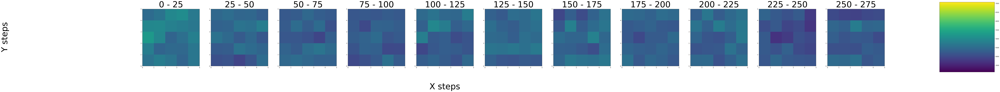

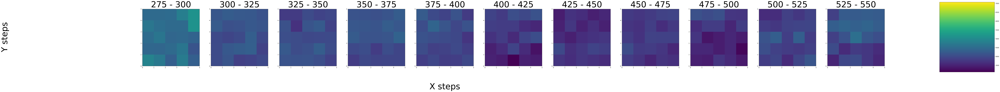

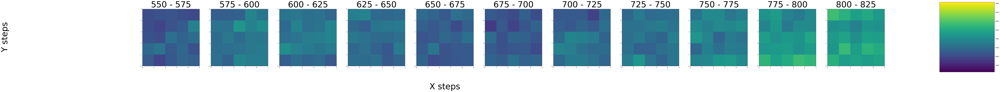

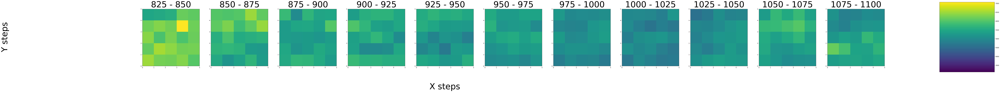

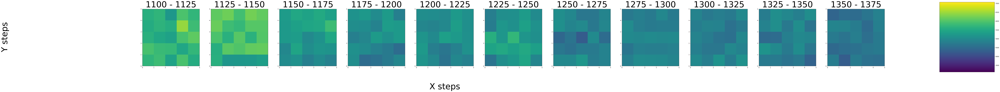

...

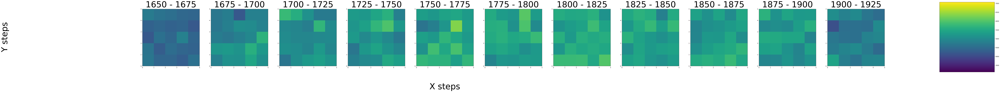

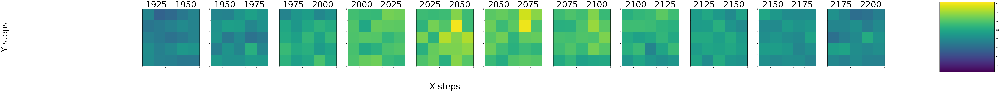

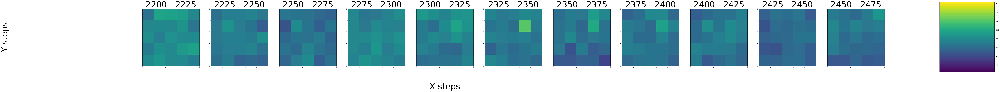

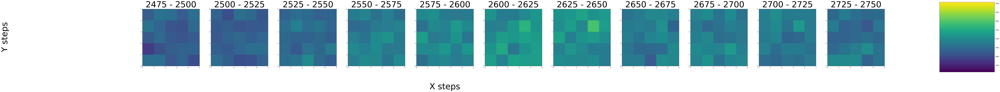

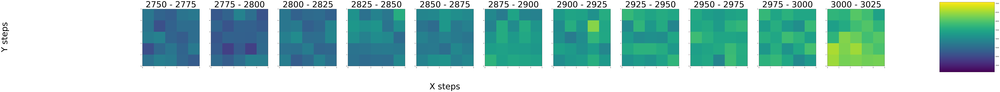

In [69]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

figsize = (ncols*10,nrows*10)
fontsize=60

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=figsize)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=fontsize)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    if nrows > 1:
        fig.tight_layout()
    else: 
        pass
    fig.subplots_adjust(right=0.8)

    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center',fontsize=fontsize)
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical',fontsize=fontsize)
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

maxidx=833, maxct=7076.66638546521, Vpd=9.99969482421875
coil VZbottom, VZtop, VX, VY = (6.96, 7.464, 0.384, 0.04800000000000004)


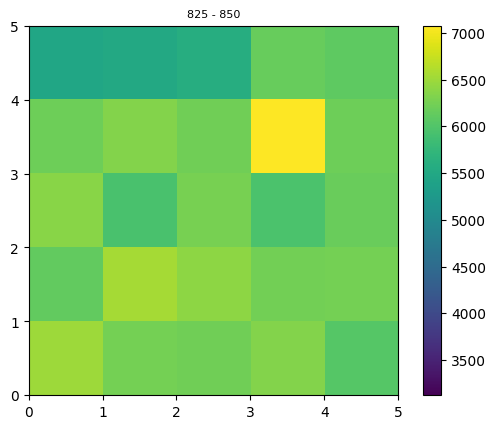

In [70]:
# Starting with these settings, I was able to manually tune coils to get ~ 9000 Hz (the fluorescence
# background was around 5000 though)
# 6.05 V, 6.55 V, 0.07 V, -0.17 V

# local max for a given step range
step0 = 825 #xsteps*ysteps*(200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

### 2023.09.06

In [37]:
f = h5py.File(os.path.join(results, '2023-09-06\\17\\000005041-CoilScanSPCMCount.h5'))
[x for x in f['datasets'].values()]

[<HDF5 dataset "AOM_A1_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A2_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A3_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A4_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A5_power": shape (), type "<f8">,
 <HDF5 dataset "AOM_A6_power": shape (), type "<f8">,
 <HDF5 dataset "FORT_monitor": shape (675,), type "<f8">,
 <HDF5 dataset "MOT1_monitor": shape (675,), type "<f8">,
 <HDF5 dataset "MOT2_monitor": shape (675,), type "<f8">,
 <HDF5 dataset "MOT3_monitor": shape (675,), type "<f8">,
 <HDF5 dataset "MOT4_monitor": shape (675,), type "<f8">,
 <HDF5 dataset "MOT5_monitor": shape (675,), type "<f8">,
 <HDF5 dataset "MOT6_monitor": shape (675,), type "<f8">,
 <HDF5 dataset "MOT_switchyard_monitor": shape (675,), type "<f8">,
 <HDF5 dataset "Vx_array": shape (), type "|O">,
 <HDF5 dataset "Vy_array": shape (), type "|O">,
 <HDF5 dataset "Vz_bottom_array": shape (), type "|O">,
 <HDF5 dataset "Vz_top_array": shape (), type "|

In [38]:
MOTdata = [np.array(data) for data in  f['datasets'].values()][7:14]

In [44]:
datafile = os.path.join(expdir,"20230906_173637_coil_scan.csv")
t_exp = 0.3 # the SPCM exposure time in seconds. 

has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [46]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

steps = range(len(counts))

In [23]:
### nrows and ncols are the number of subplots in each image
nrows = 4
ncols = 5
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [24]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

49

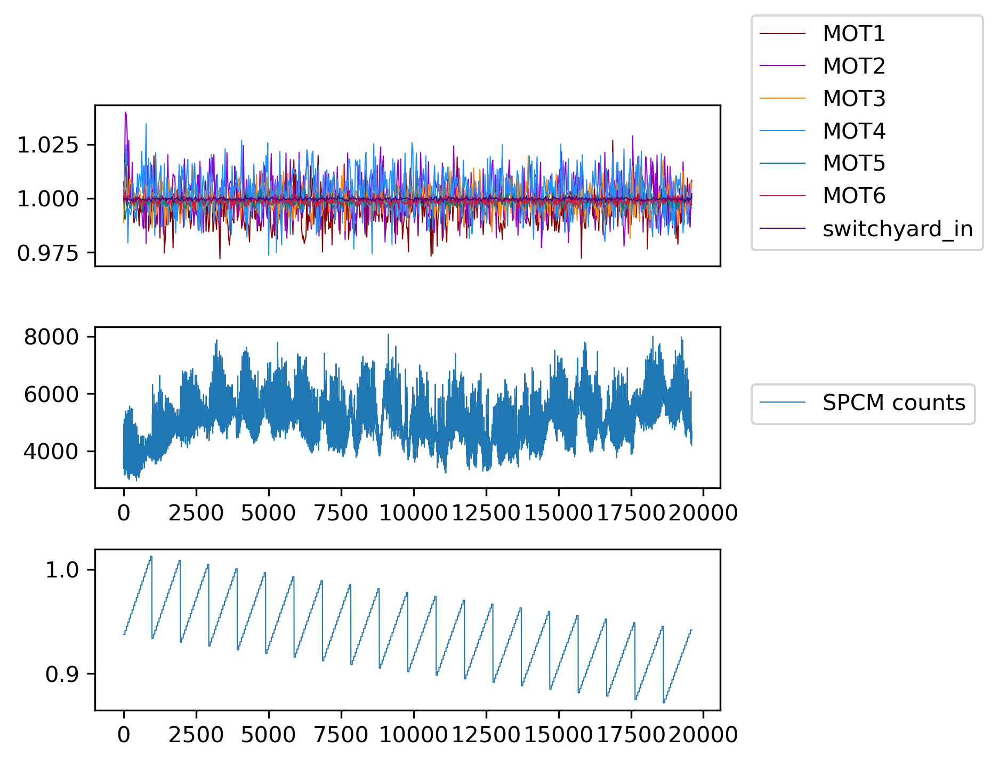

In [60]:
labels = [f'MOT{i+1}' for i in range(6)]+['switchyard_in']
fig,axes = plt.subplots(nrows=3,dpi=300)
ax, ax2, ax3 = axes
colors = ['darkred','darkviolet','darkorange','dodgerblue','teal','crimson','indigo']
for label,data,color in zip(labels,MOTdata,colors):
    ypts = data[20:] # the feedback runs 20 times before we start counting photons
    xpts = range(len(ypts))
#     ax.scatter(xpts, ypts, color=color,s=0.1)
    ax.plot(xpts, ypts, color=color, label=label,linewidth=0.5)
#     ax.set_ylim((0.95,1.05))
    ax.legend(loc=(1.05,0.1))
ax.get_xaxis().set_visible(False)
ax2.plot(steps,counts,label='SPCM counts',linewidth=0.5)
ax3.plot(steps,zbottom_data/ztop_data,label='VZ_bottom/Vz_top',linewidth=0.5)
# plt.gcf().autofmt_xdate()
ax2.legend(loc=(1.05,0.4))
ax4.legend(loc=(1.05,0.4))
fig.tight_layout()

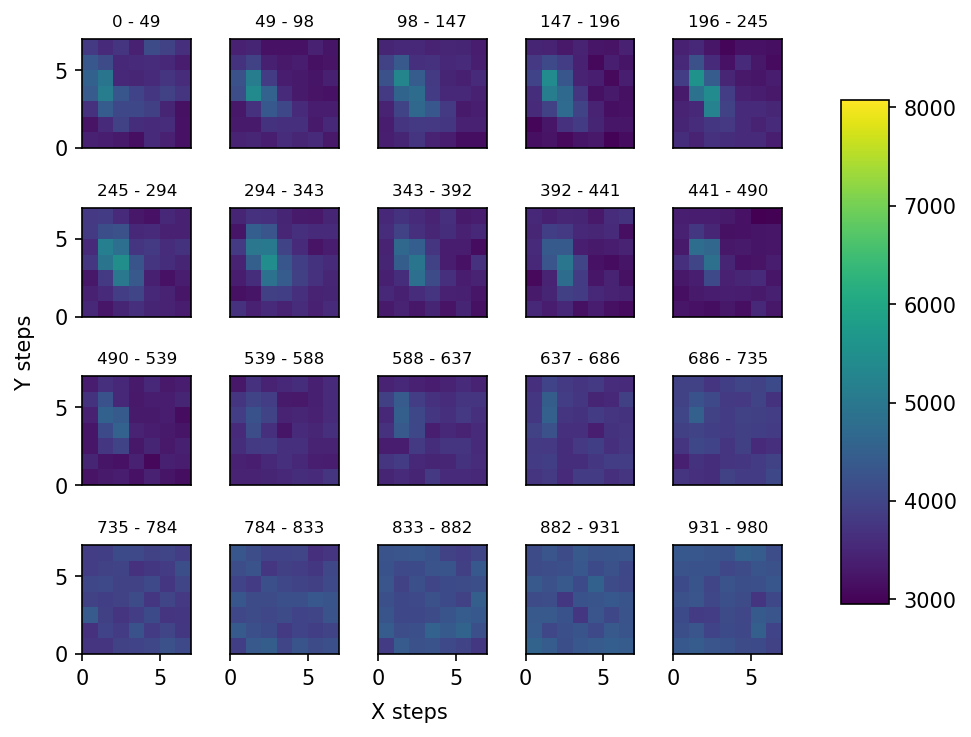

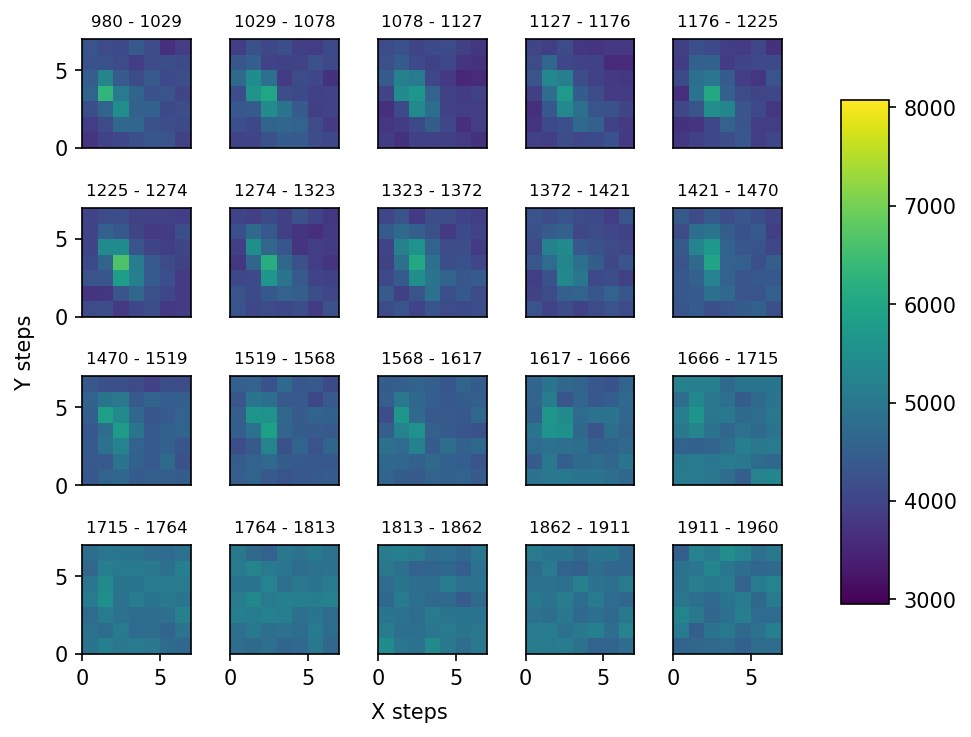

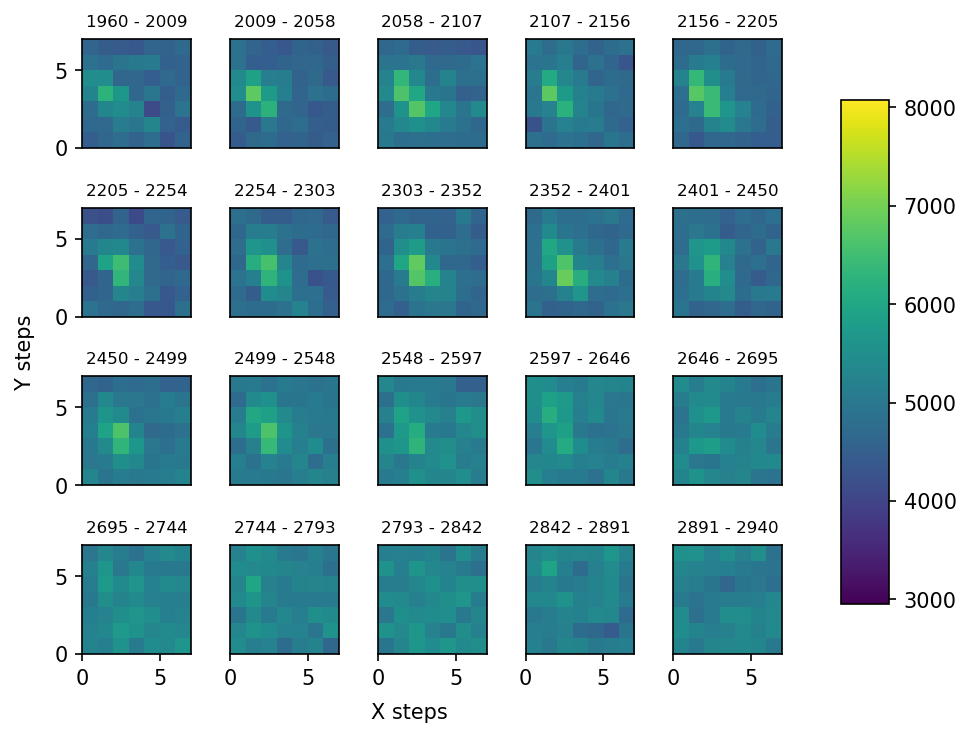

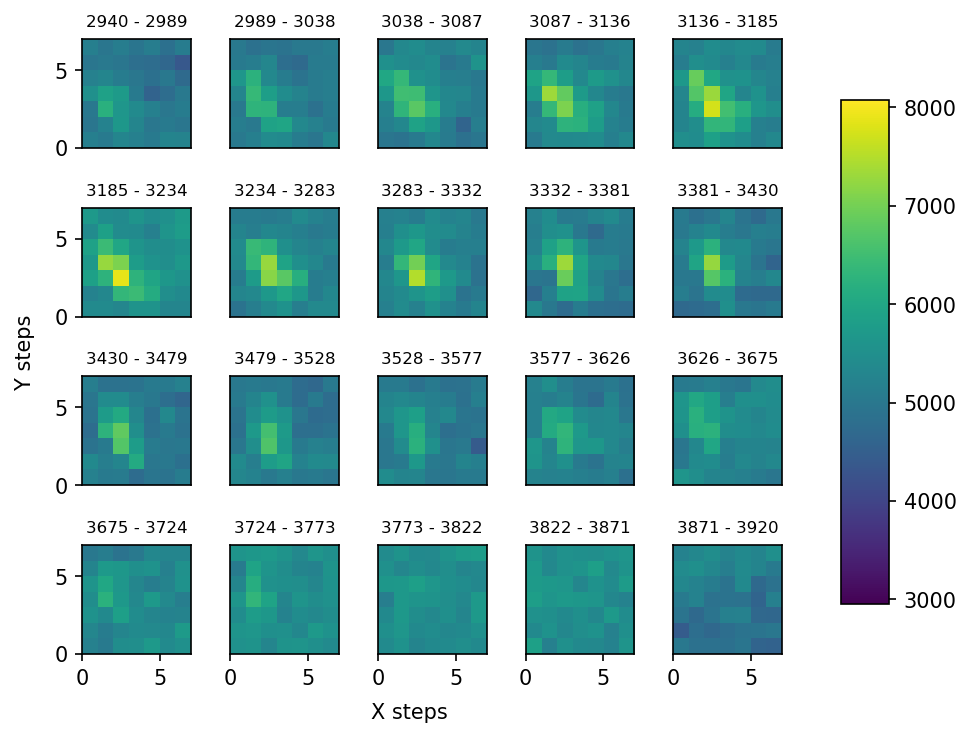

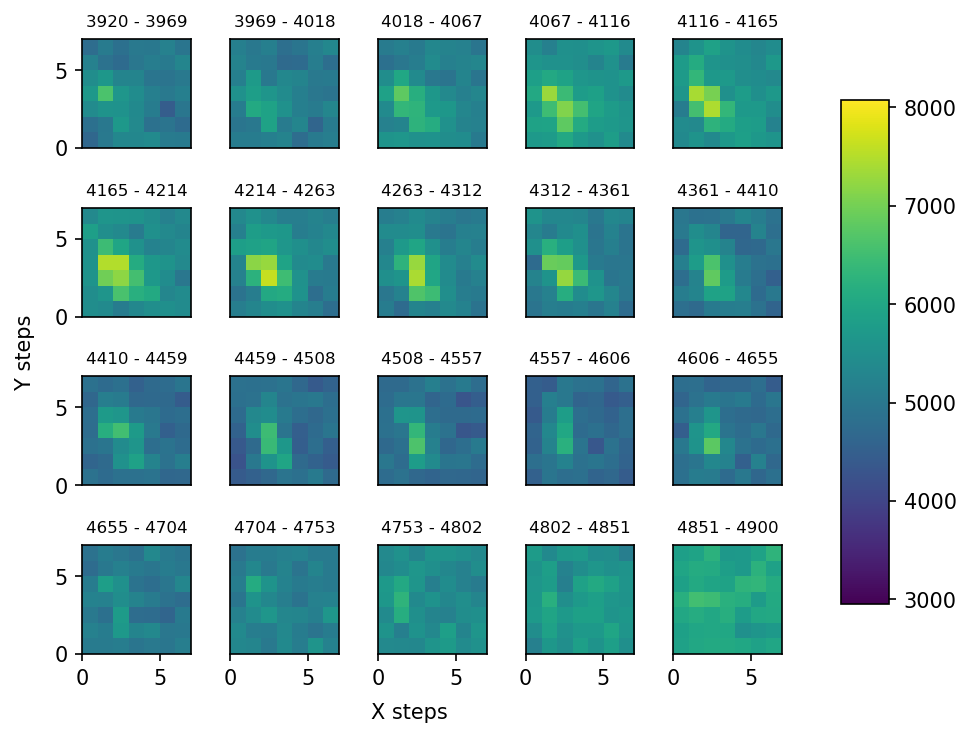

...

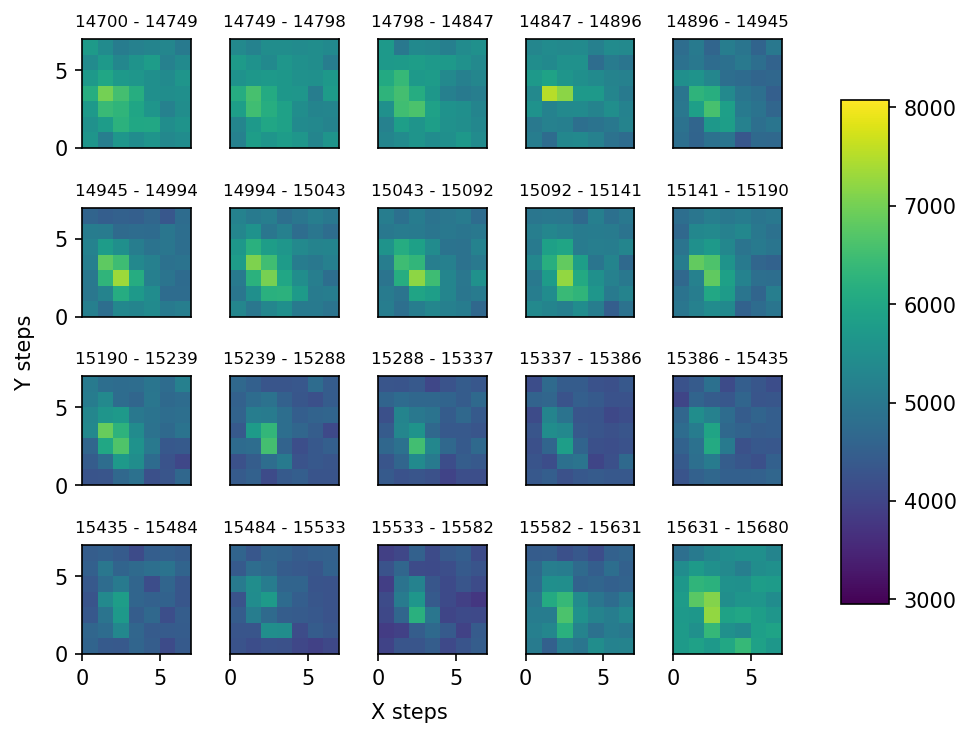

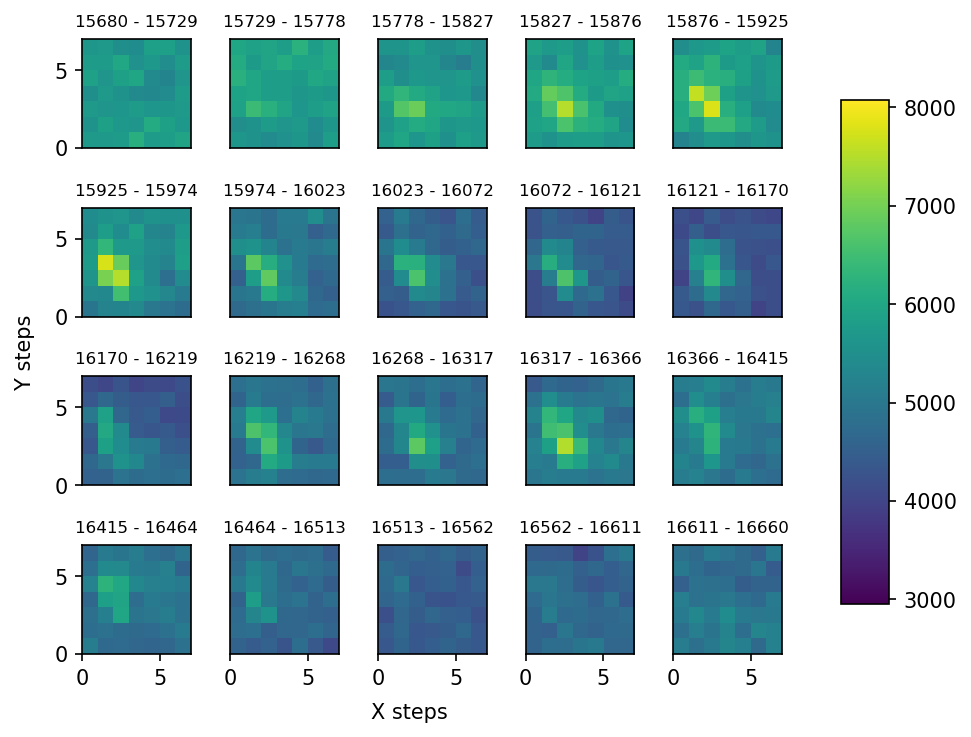

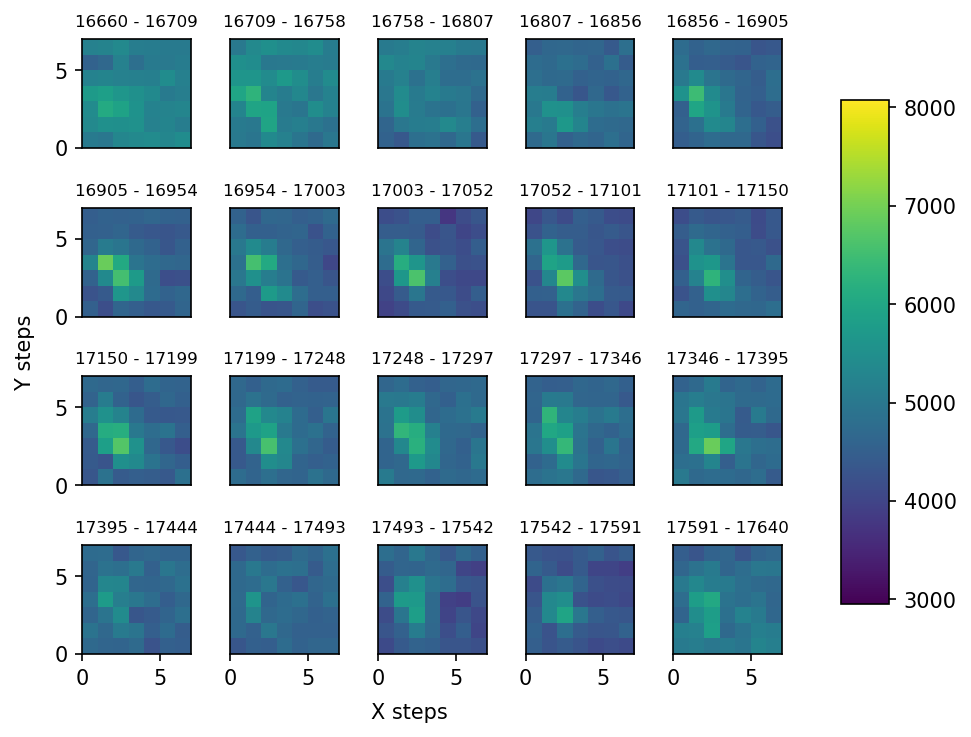

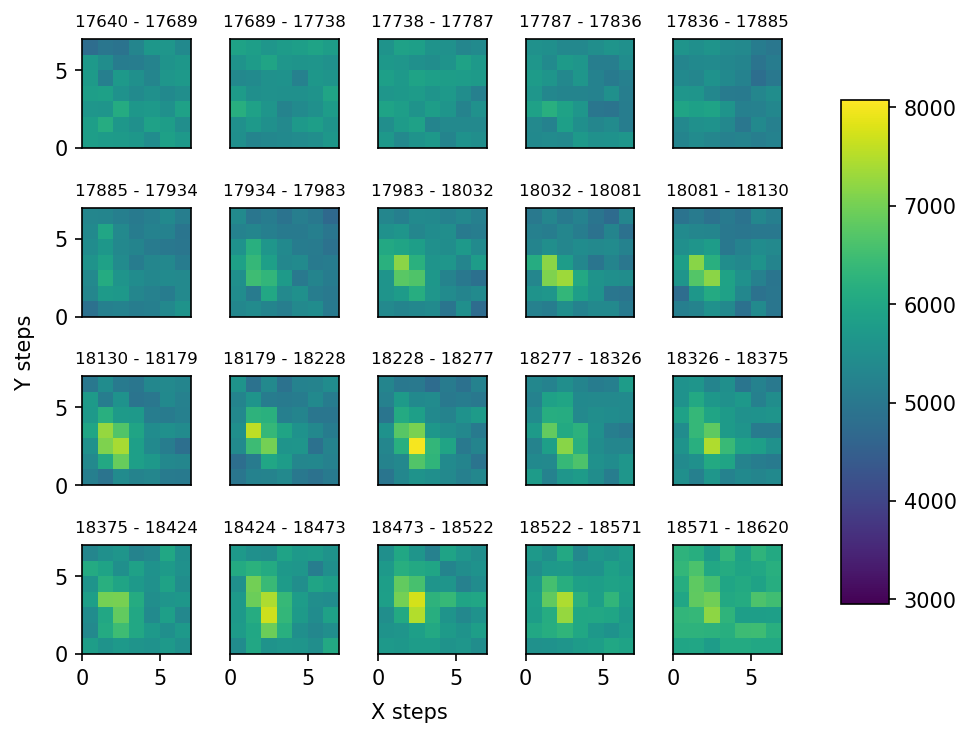

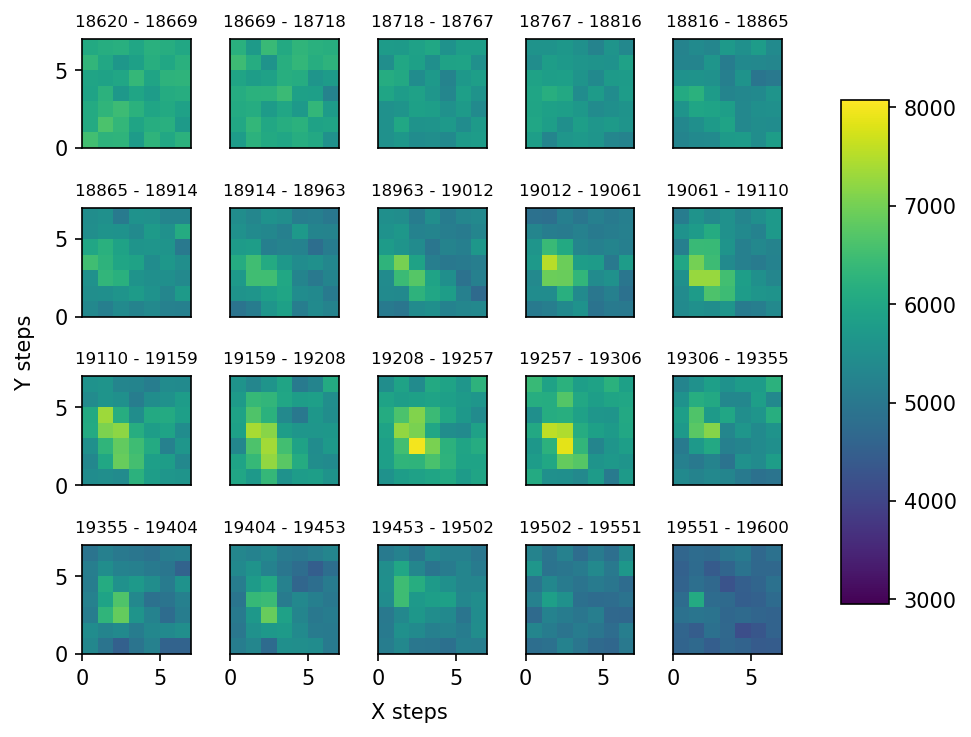

In [25]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

### August 2023

#### 2023.08.31
Bugs have been fixed in the feedback code and the signal is being averaged enough to keep the MOT beam fluctuations to 
less than 2% over 95% of the time. See wiki post from yesterday.

In [13]:
datafile = os.path.join(expdir,"20230830_141518_coil_scan.csv")
t_exp = 0.3 # the SPCM exposure time in seconds. 


has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [15]:
counts = data[0]/t_exp # data is total counts in the exposure time. data/t_exp is the rate.
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

In [16]:
### nrows and ncols are the number of subplots in each image
nrows = 4
ncols = 5
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [17]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

121

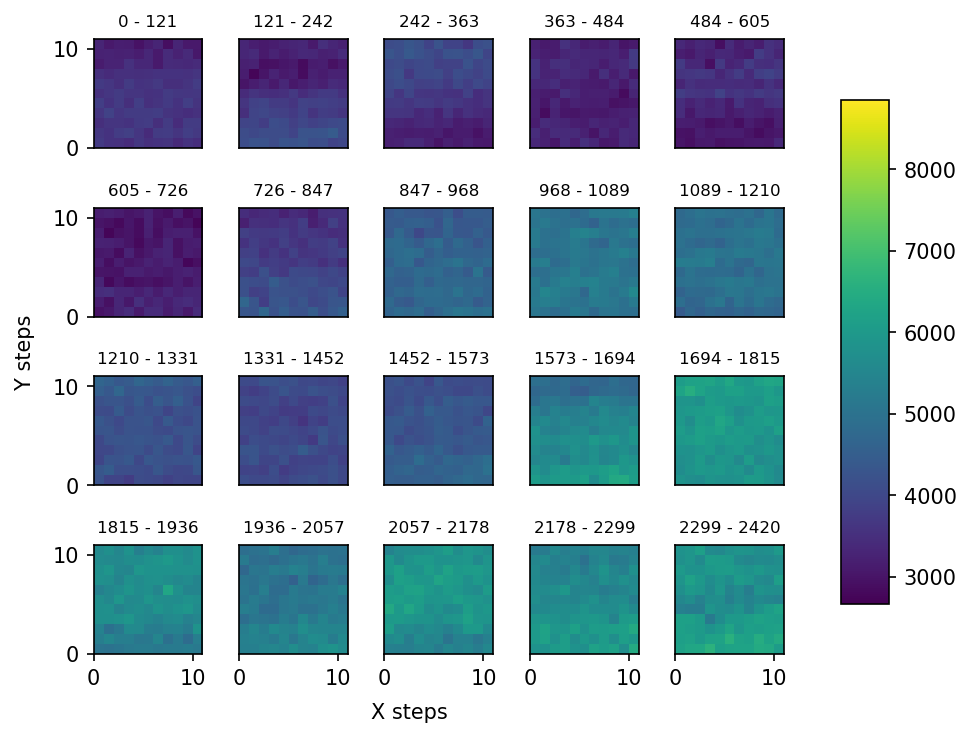

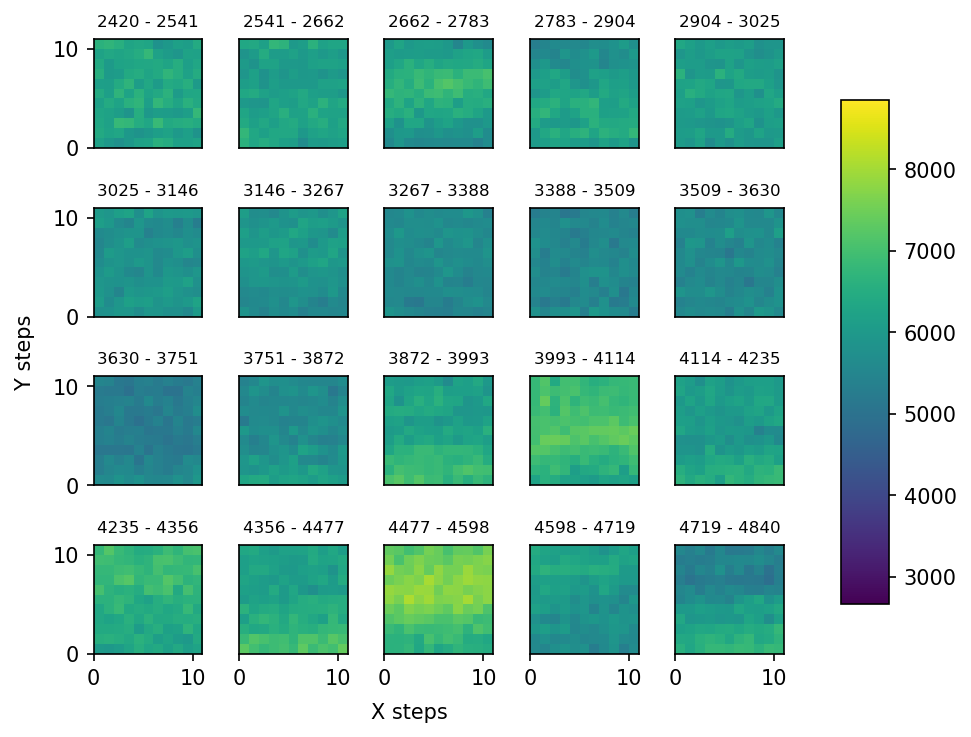

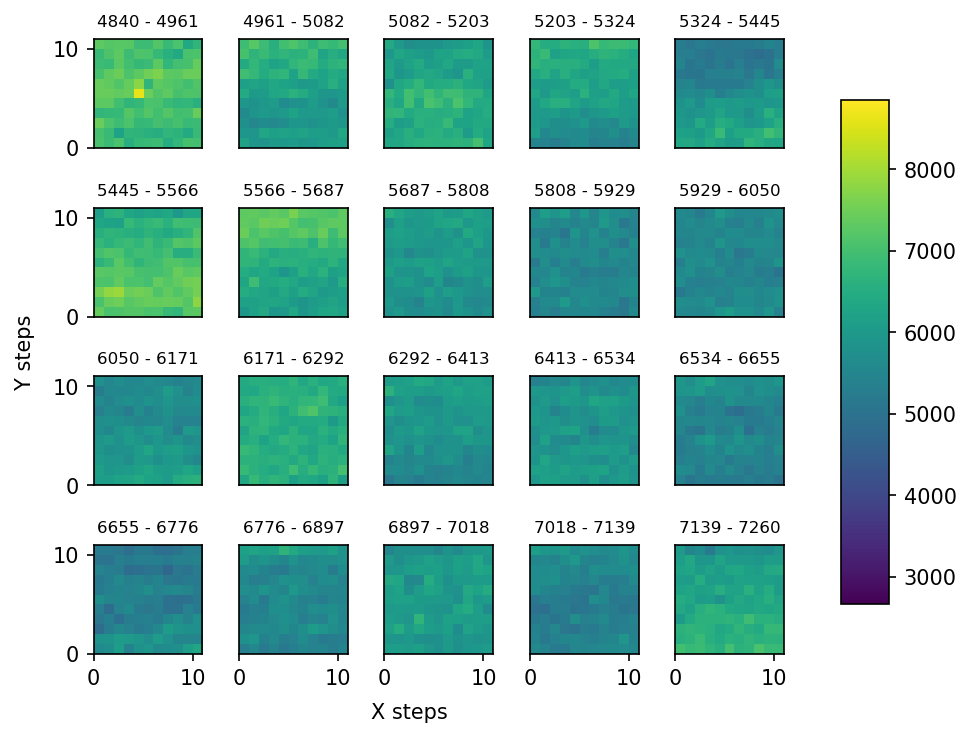

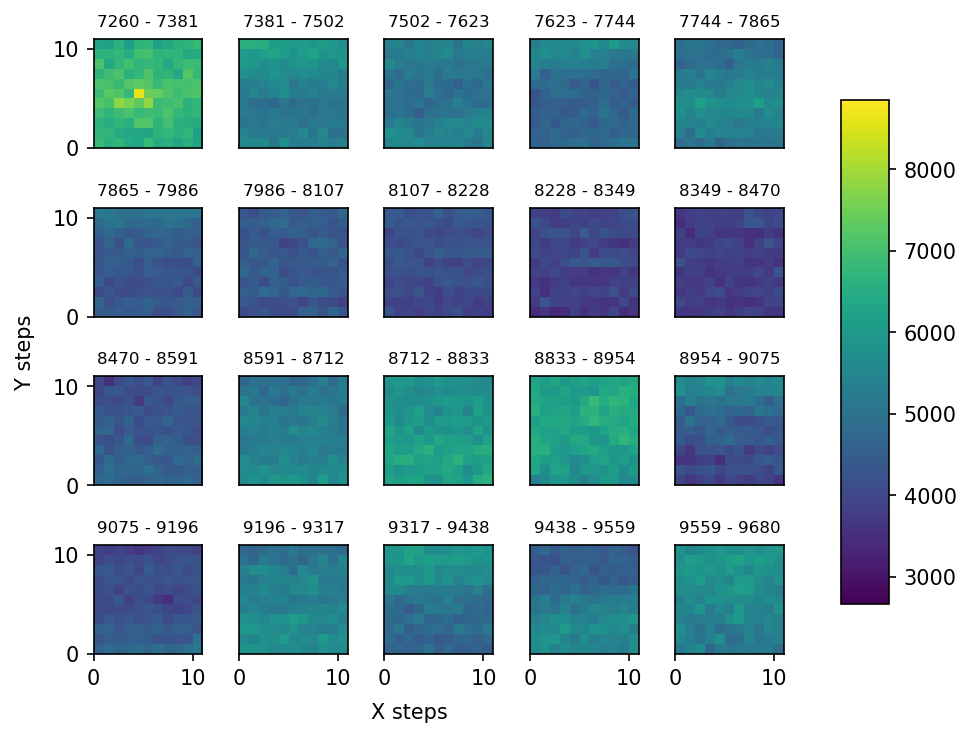

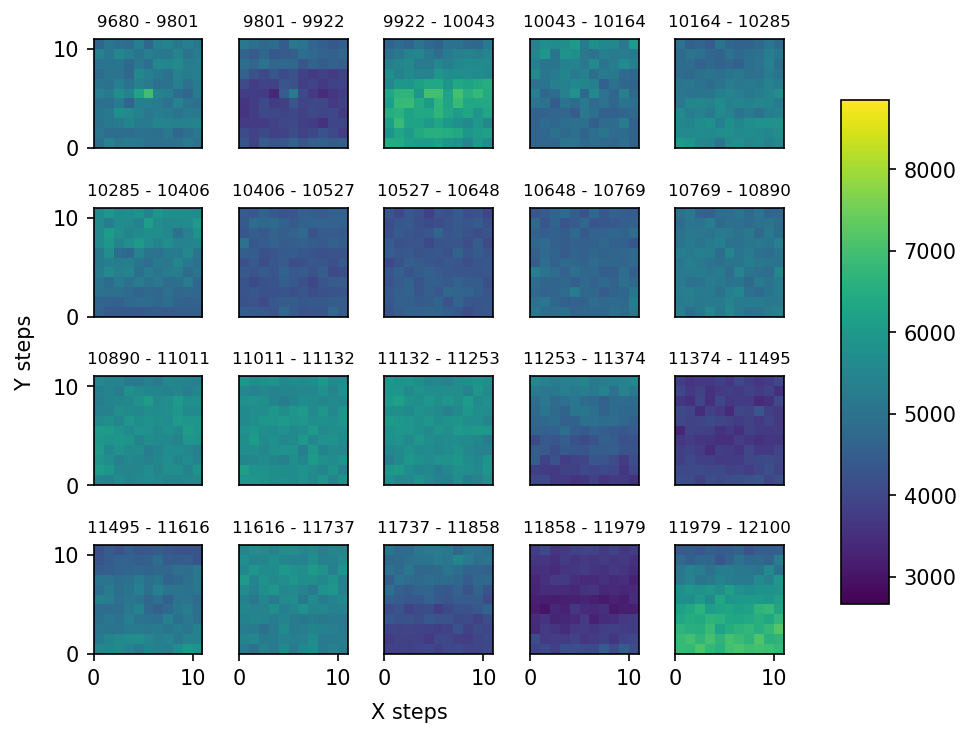

...

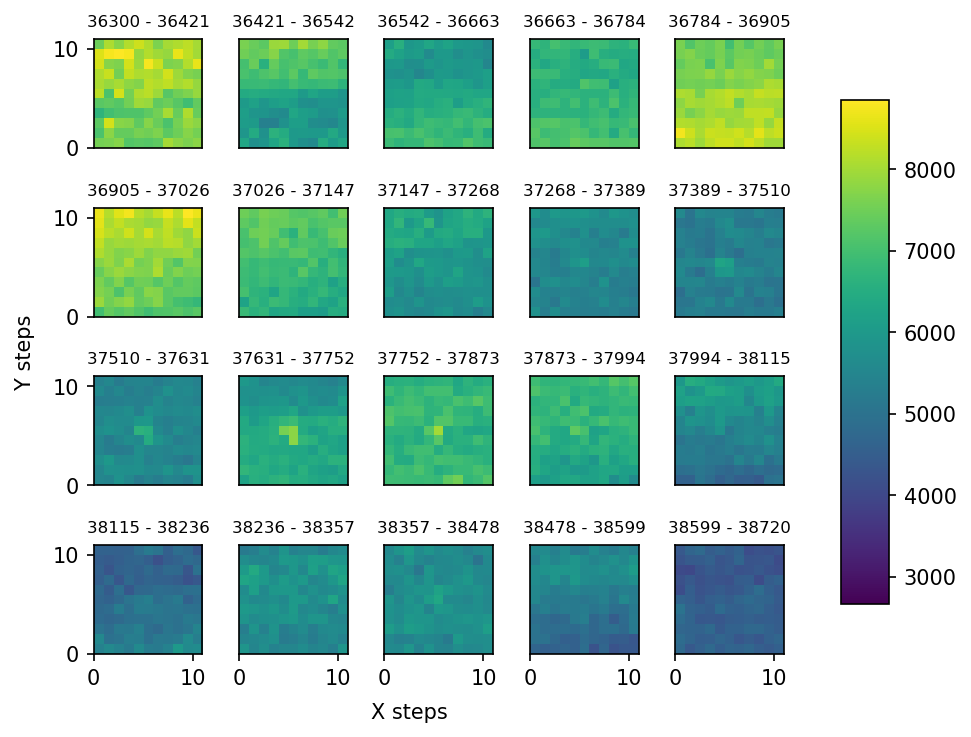

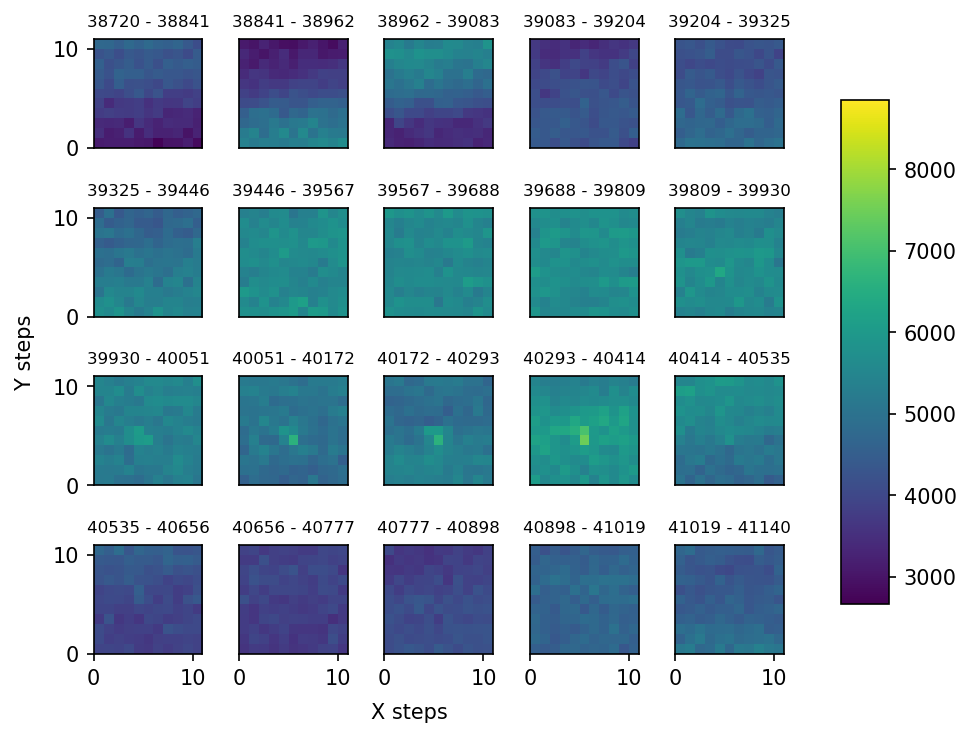

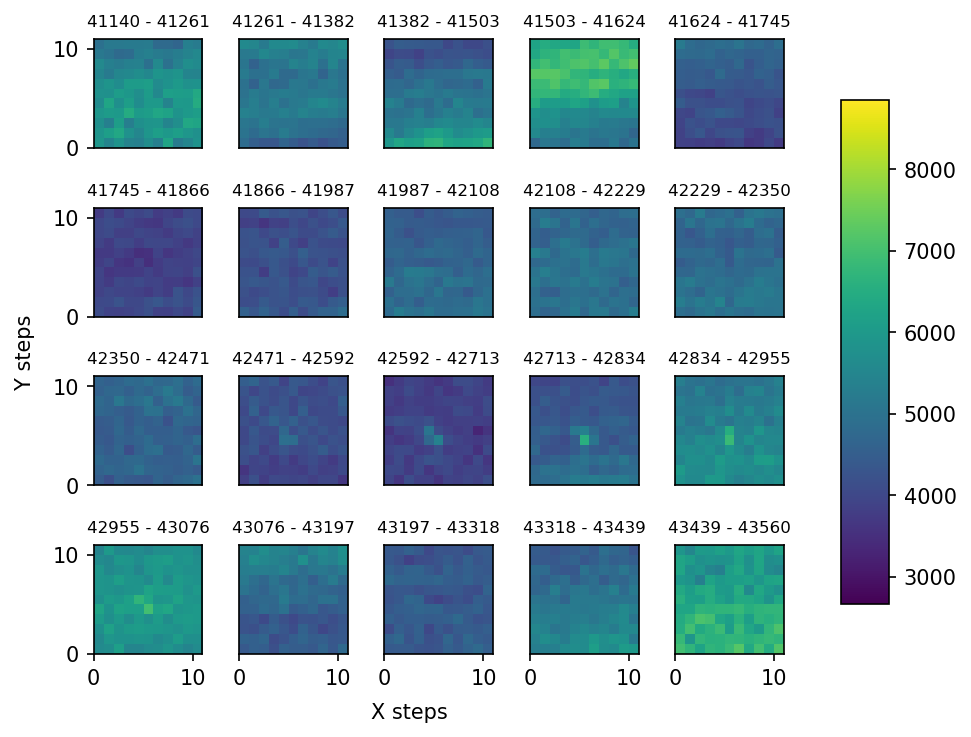

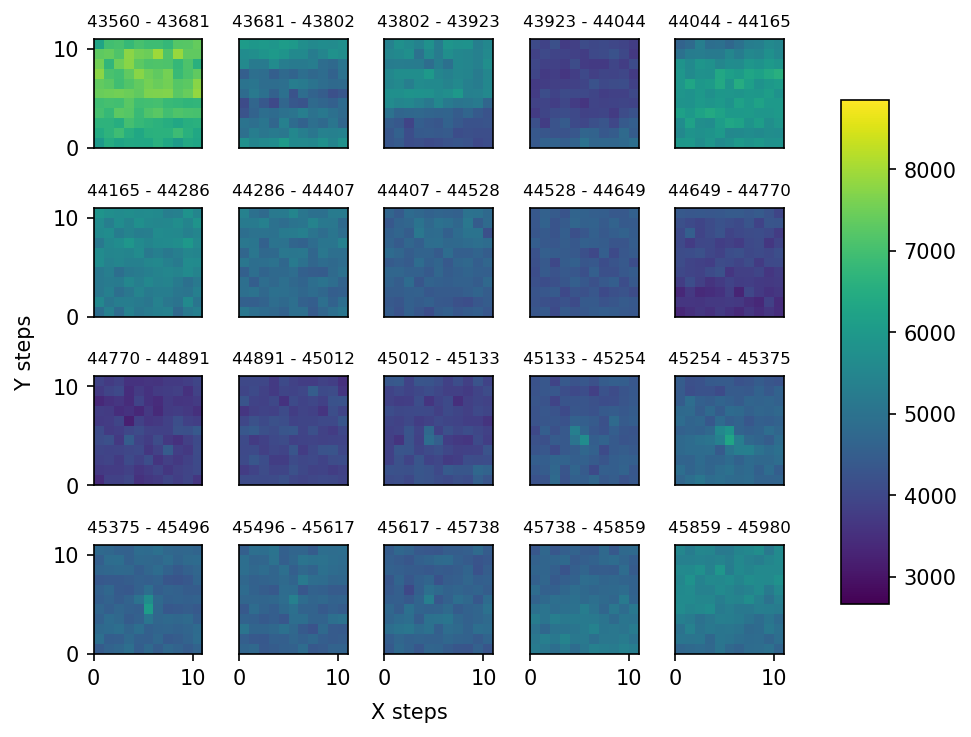

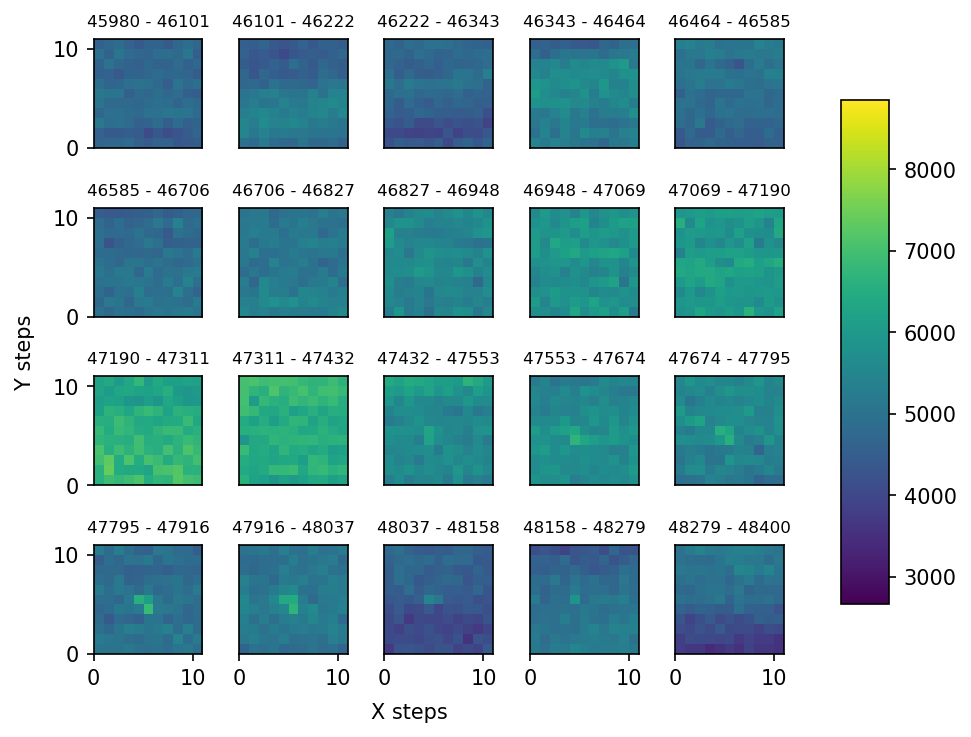

In [18]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

maxidx=30068, maxct=7453.333333333334, Vpd=-0.01251220703125
coil VZbottom, VZtop, VX, VY = (6.842105263157895, 7.2631578947368425, 0.0, 0.0)


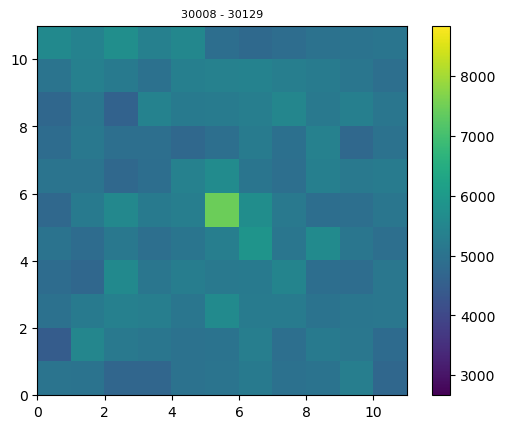

In [20]:
# Starting with these settings, I was able to manually tune coils to get ~ 9000 Hz (the fluorescence
# background was around 5000 though)
# 6.05 V, 6.55 V, 0.07 V, -0.17 V

# local max for a given step range
step0 = 30008 #xsteps*ysteps*(200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

maxidx=47866, maxct=2058.0, Vpd=-0.01190185546875
coil VZbottom, VZtop, VX, VY = (7.578947368421053, 8.0, 0.15999999999999992, 0.0)


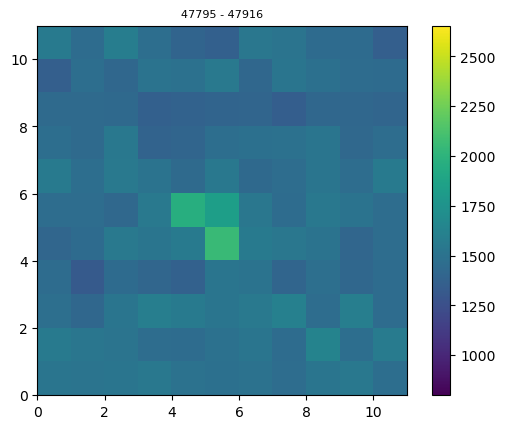

In [11]:
# Starting with these settings, I was able to manually tune coils to get ~ 9000 Hz (the fluorescence
# background was around 5000 though)
# 6.05 V, 6.55 V, 0.07 V, -0.17 V

# local max for a given step range
step0 = 47795 #xsteps*ysteps*(200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

maxidx=35150, maxct=2301.0, Vpd=-0.01312255859375
coil VZbottom, VZtop, VX, VY = (7.052631578947368, 7.473684210526316, 0.0, 0.0)


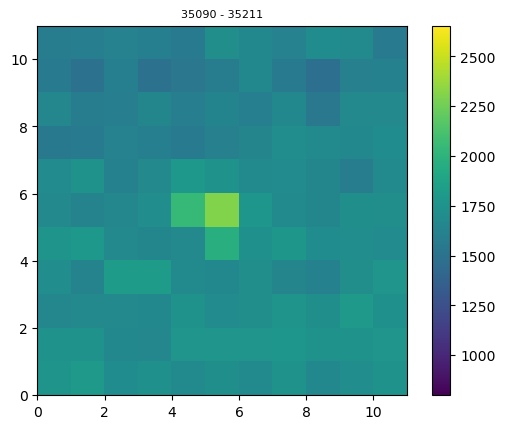

In [12]:
# Starting with these settings, I was able to manually tune coils to get ~ 10000 Hz (the fluorescence
# background was around 5000)
# 7.38 V, 7.91 V, 0.12 V, -0.19 V

# local max for a given step range
step0 = 35090 #xsteps*ysteps*(200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

maxidx=7319, maxct=2589.0, Vpd=-0.01373291015625
coil VZbottom, VZtop, VX, VY = (6.0, 6.315789473684211, 0.0, -0.16000000000000003)


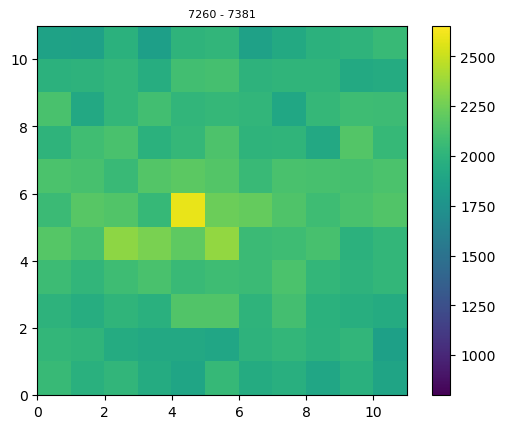

In [10]:
# local max for a given step range
step0 = 7260 #xsteps*ysteps*(200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

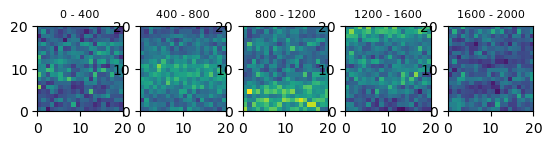

In [12]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, yb

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    [ax.set_xticks([]) for ax in axes[:-1,:].flat]
    [ax.set_yticks([]) for ax in axes[:,1:].flat]

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

Text(0, 0.5, 'mW at switchyard')

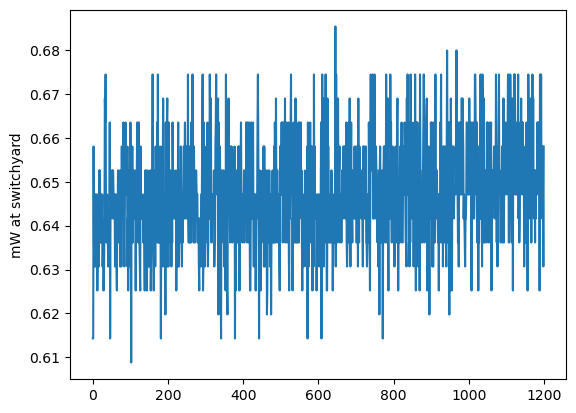

In [47]:
# plot the photodiode voltage and counts. produce same number of figures as above

minpd = min(pd_data)
maxpd = max(pd_data)
V_to_mW = lambda x: -0.195395 + 17.9214 * (x + 0.011)  # this accounts for a mismatch between what the Sampler reads and what
            # the multimeter that I used for the fit reads
            
fig,ax = plt.subplots()
# for i in range(len(counts)//(xsteps*ysteps*ncols*nrows)):
#     fig,axes = plt.subplots(nrows=2,ncols=1,sharex=True)
#     ax,ax2 = axes
#     imin = i*nrows*ncols*xsteps*ysteps
#     imax = (i+1)*nrows*ncols*xsteps*ysteps
ax.plot(V_to_mW(pd_data))
# ax.set_ylim((mincounts,maxcounts))
#     ax.set_ylabel("SPCM counts")
#     ax2.plot(pd_data[imin:imax])
#     ax2.set_ylim((minpd,maxpd))
# ax.set_ylabel("PD voltage")
ax.set_ylabel("mW at switchyard")

#     ax.set_title(f"steps i0={imin} to if={imax}")
#     ax2.set_xlabel("steps + i0")
#     plt.savefig(datafile[:-4] + '_counts_and_pd_' + str(i) + '.png', bbox_inches='tight')
#     plt.close()

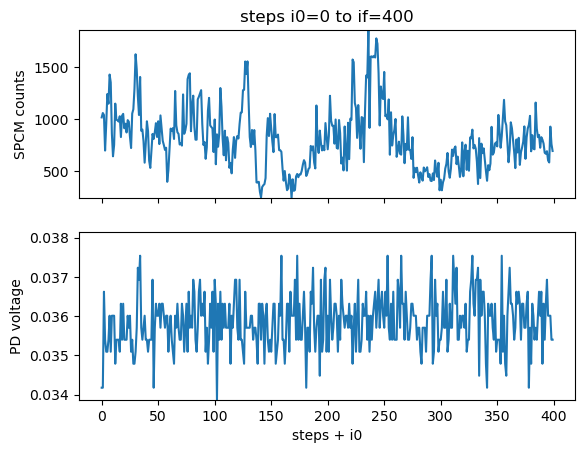

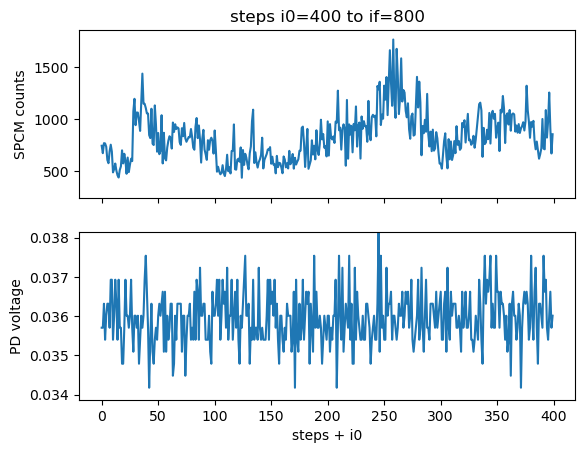

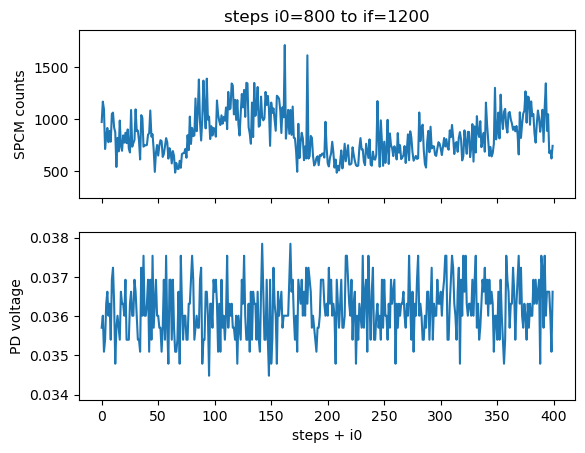

In [45]:
# plot the photodiode voltage and counts. produce same number of figures as above

minpd = min(pd_data)
maxpd = max(pd_data)
for i in range(len(counts)//(xsteps*ysteps*ncols*nrows)):
    fig,axes = plt.subplots(nrows=2,ncols=1,sharex=True)
    ax,ax2 = axes
    imin = i*nrows*ncols*xsteps*ysteps
    imax = (i+1)*nrows*ncols*xsteps*ysteps
    ax.plot(counts[imin:imax])
    ax.set_ylim((mincounts,maxcounts))
    ax.set_ylabel("SPCM counts")
    ax2.plot(pd_data[imin:imax])
    ax2.set_ylim((minpd,maxpd))
    ax2.set_ylabel("PD voltage")
    ax.set_title(f"steps i0={imin} to if={imax}")
    ax2.set_xlabel("steps + i0")
#     plt.savefig(datafile[:-4] + '_counts_and_pd_' + str(i) + '.png', bbox_inches='tight')
#     plt.close()

maxidx=18734, maxct=532.0, Vpd=0.0384521484375
coil VZbottom, VZtop, VX, VY = (0.72, -1.68, -0.61, -0.6225)


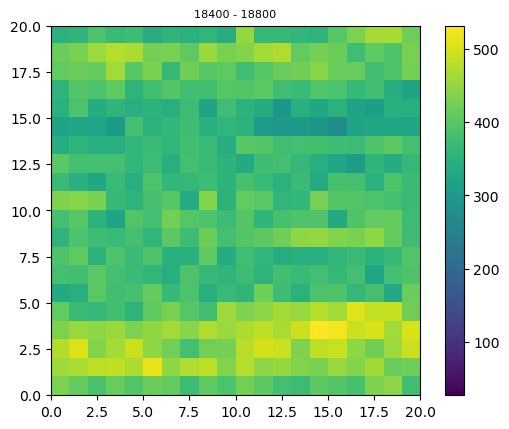

In [219]:
# find the max counts index then print out the coil settings and PD reading

maxct, maxidx = get_max_idx(counts)

print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

step0 = xsteps*ysteps*(maxidx//(xsteps*ysteps))

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

maxidx=41321, maxct=1055.0, Vpd=0.03936767578125
coil VZbottom, VZtop, VX, VY = (0.9199999999999999, -2.76, -0.13500000000000004, -0.021249999999999998)


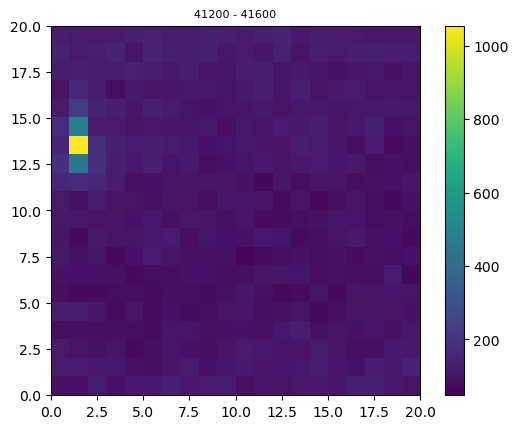

In [43]:
# local max for a given step range
step0 = xsteps*ysteps*(41200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

### 2023.08.25
The scan code is working but I don't think there was a MOT at any time. I had just implemented the MOT feedback with the fW detector, so there may have been a bug or the fluctuations in beam powers was too large.

In [3]:
datafile = os.path.join(expdir,"results\\20230825_203415_coil_scan.csv")


has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [4]:
counts = data[0]
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

In [6]:
### nrows and ncols are the number of subplots in each image
nrows = 4
ncols = 5
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [7]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

400

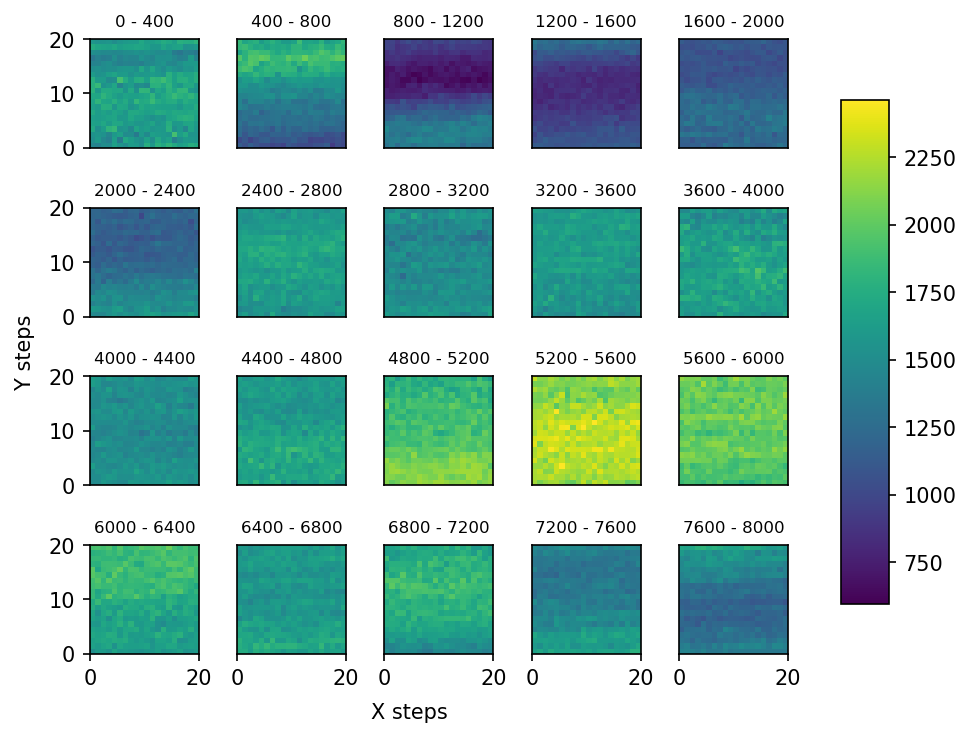

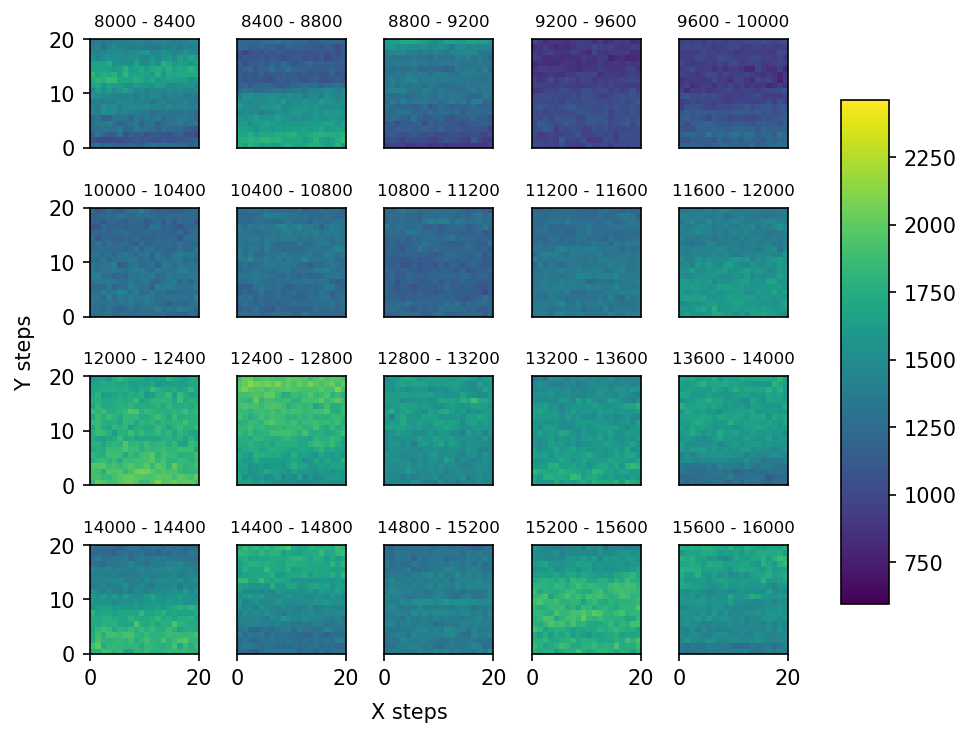

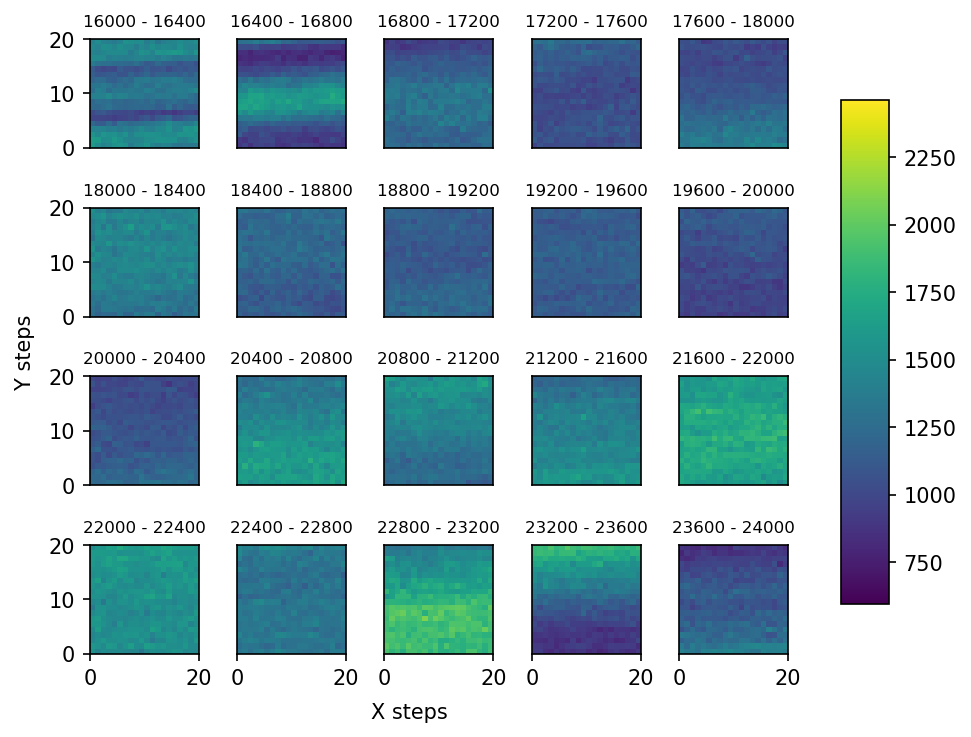

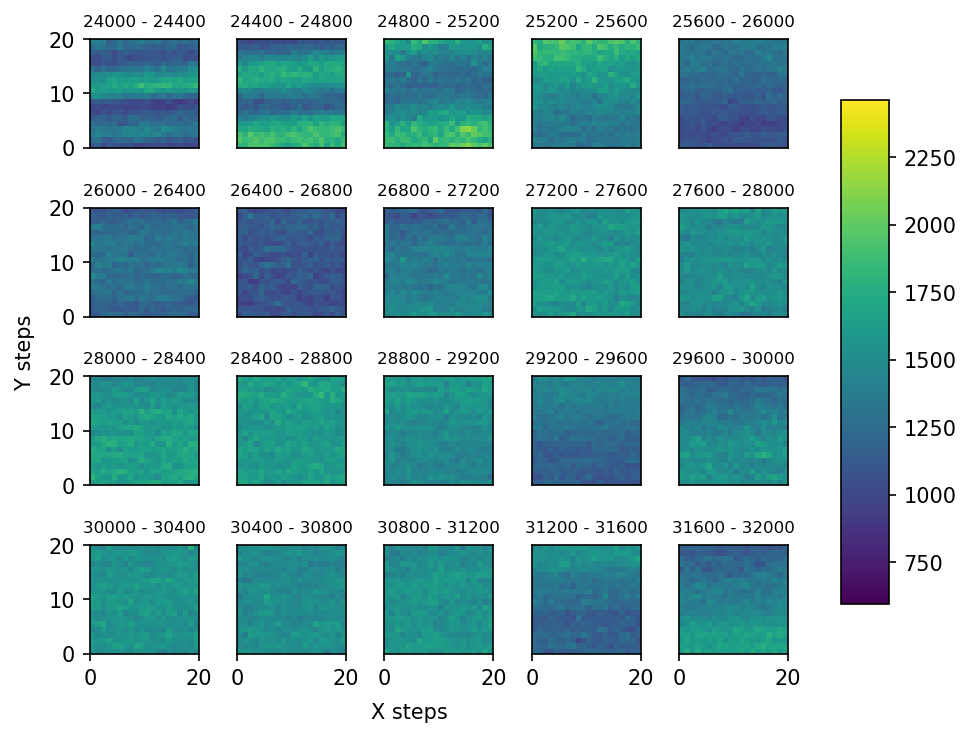

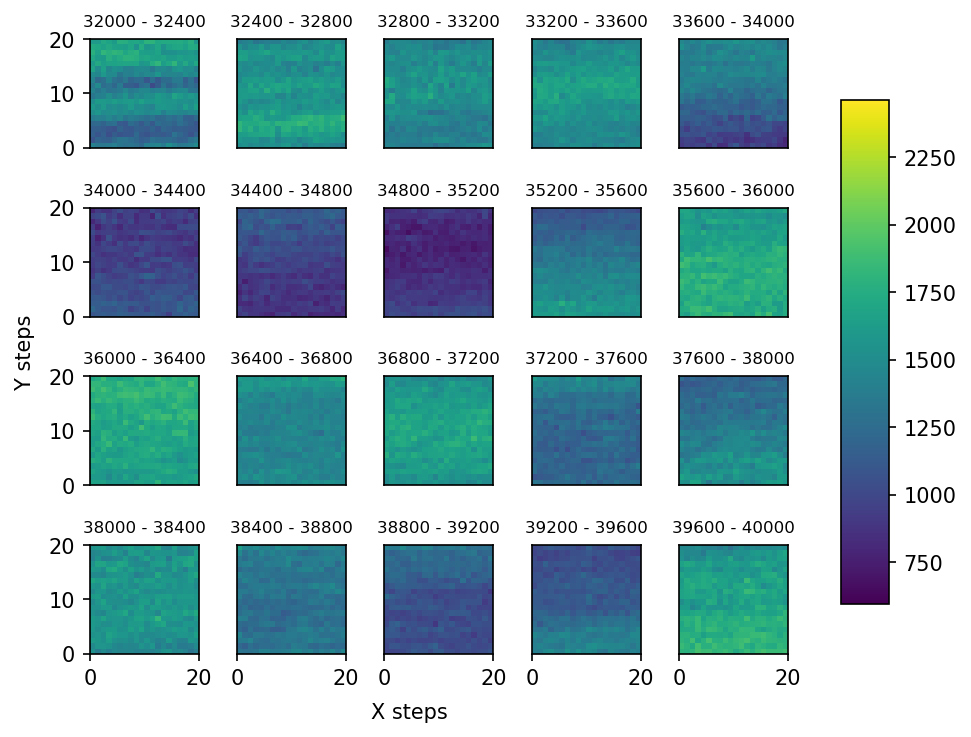

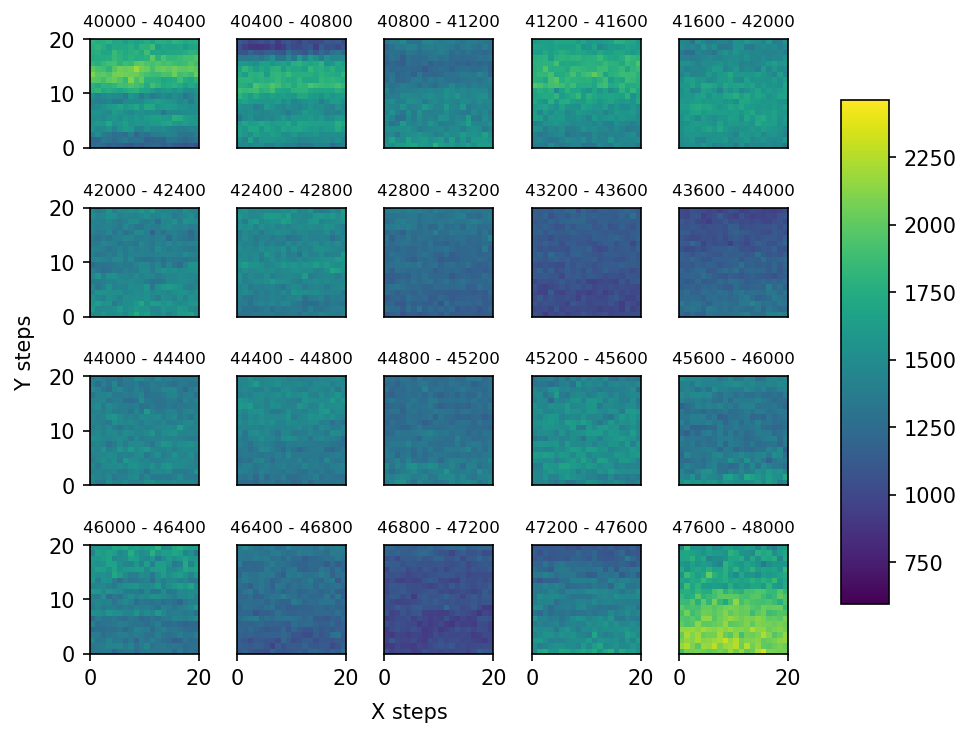

ValueError: cannot reshape array of size 174 into shape (20,20)

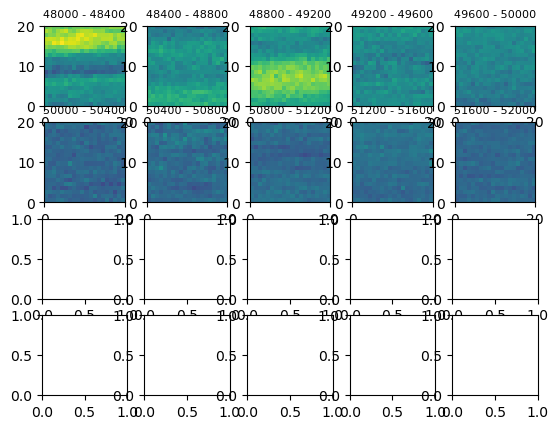

In [8]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

maxidx=48084, maxct=2448.0, Vpd=-0.0140380859375
coil VZbottom, VZtop, VX, VY = (6.0, 7.35, -0.3, -0.3)


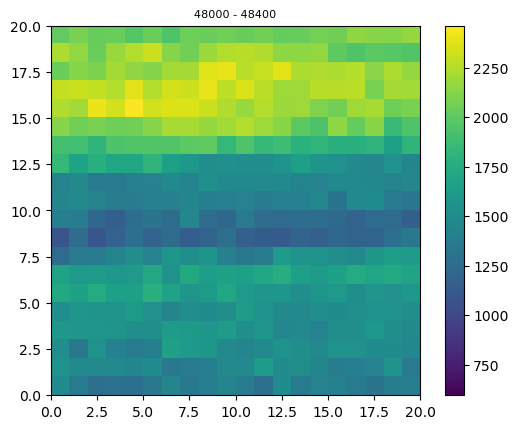

In [9]:
# local max for a given step range
step0 = 48000 #xsteps*ysteps*(200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

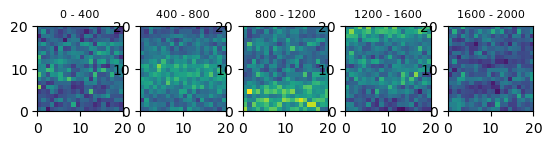

In [12]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, yb

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    [ax.set_xticks([]) for ax in axes[:-1,:].flat]
    [ax.set_yticks([]) for ax in axes[:,1:].flat]

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

Text(0, 0.5, 'mW at switchyard')

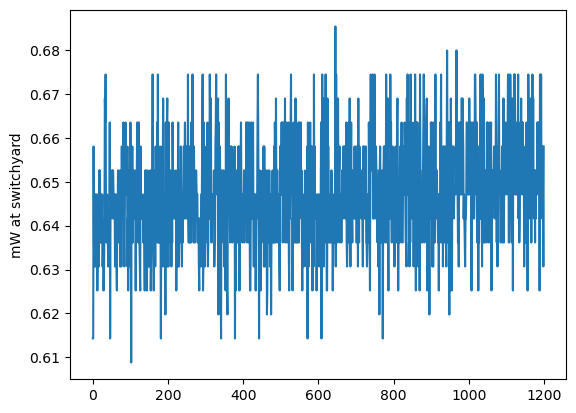

In [47]:
# plot the photodiode voltage and counts. produce same number of figures as above

minpd = min(pd_data)
maxpd = max(pd_data)
V_to_mW = lambda x: -0.195395 + 17.9214 * (x + 0.011)  # this accounts for a mismatch between what the Sampler reads and what
            # the multimeter that I used for the fit reads
            
fig,ax = plt.subplots()
# for i in range(len(counts)//(xsteps*ysteps*ncols*nrows)):
#     fig,axes = plt.subplots(nrows=2,ncols=1,sharex=True)
#     ax,ax2 = axes
#     imin = i*nrows*ncols*xsteps*ysteps
#     imax = (i+1)*nrows*ncols*xsteps*ysteps
ax.plot(V_to_mW(pd_data))
# ax.set_ylim((mincounts,maxcounts))
#     ax.set_ylabel("SPCM counts")
#     ax2.plot(pd_data[imin:imax])
#     ax2.set_ylim((minpd,maxpd))
# ax.set_ylabel("PD voltage")
ax.set_ylabel("mW at switchyard")

#     ax.set_title(f"steps i0={imin} to if={imax}")
#     ax2.set_xlabel("steps + i0")
#     plt.savefig(datafile[:-4] + '_counts_and_pd_' + str(i) + '.png', bbox_inches='tight')
#     plt.close()

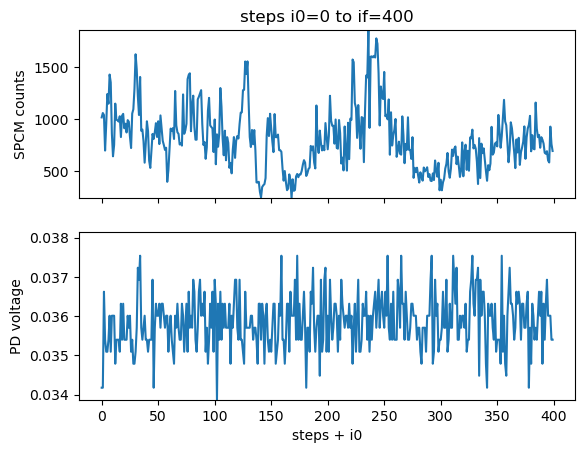

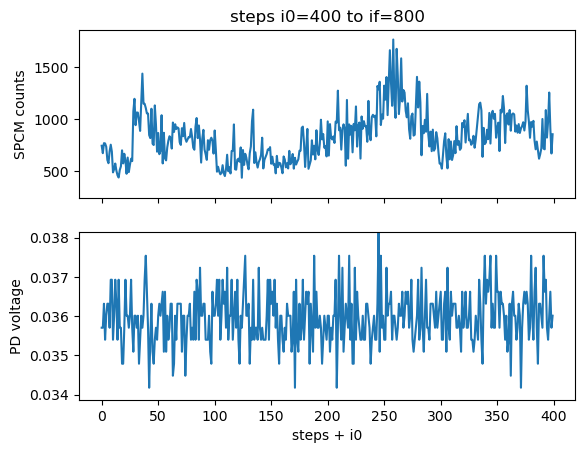

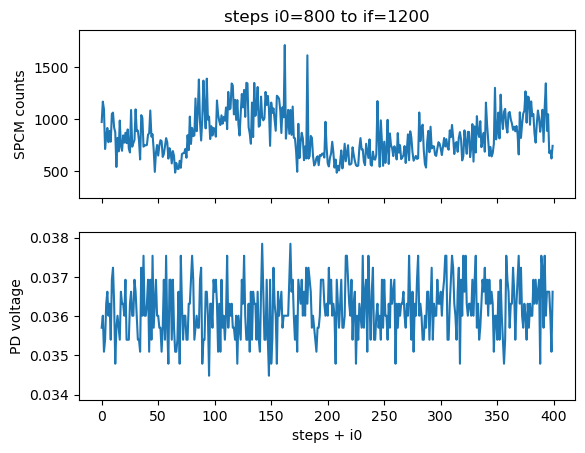

In [45]:
# plot the photodiode voltage and counts. produce same number of figures as above

minpd = min(pd_data)
maxpd = max(pd_data)
for i in range(len(counts)//(xsteps*ysteps*ncols*nrows)):
    fig,axes = plt.subplots(nrows=2,ncols=1,sharex=True)
    ax,ax2 = axes
    imin = i*nrows*ncols*xsteps*ysteps
    imax = (i+1)*nrows*ncols*xsteps*ysteps
    ax.plot(counts[imin:imax])
    ax.set_ylim((mincounts,maxcounts))
    ax.set_ylabel("SPCM counts")
    ax2.plot(pd_data[imin:imax])
    ax2.set_ylim((minpd,maxpd))
    ax2.set_ylabel("PD voltage")
    ax.set_title(f"steps i0={imin} to if={imax}")
    ax2.set_xlabel("steps + i0")
#     plt.savefig(datafile[:-4] + '_counts_and_pd_' + str(i) + '.png', bbox_inches='tight')
#     plt.close()

maxidx=18734, maxct=532.0, Vpd=0.0384521484375
coil VZbottom, VZtop, VX, VY = (0.72, -1.68, -0.61, -0.6225)


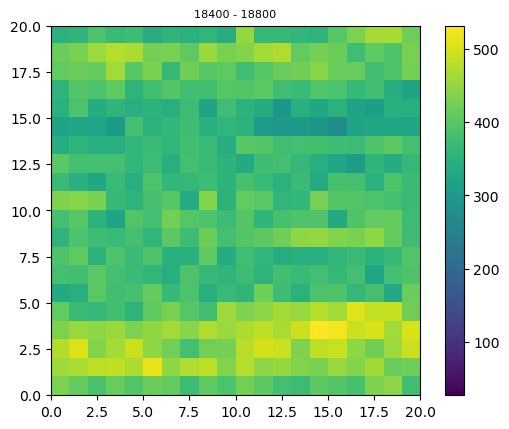

In [219]:
# find the max counts index then print out the coil settings and PD reading

maxct, maxidx = get_max_idx(counts)

print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

step0 = xsteps*ysteps*(maxidx//(xsteps*ysteps))

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

maxidx=41321, maxct=1055.0, Vpd=0.03936767578125
coil VZbottom, VZtop, VX, VY = (0.9199999999999999, -2.76, -0.13500000000000004, -0.021249999999999998)


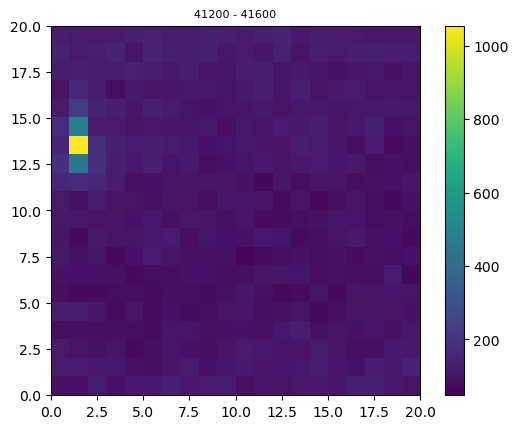

In [43]:
# local max for a given step range
step0 = xsteps*ysteps*(41200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

### May-June 2023

In [9]:
# datafile = os.path.join(expdir,"20230506_163411_coil_scan.csv")
# datafile = os.path.join(expdir,"20230516_202753_coil_scan.csv")
datafile = os.path.join(expdir,"20230517_082908_coil_scan.csv") # very clear SPCM signal
# datafile = os.path.join(expdir,"20230519_114212_coil_scan.csv") # very clear SPCM signal
# datafile = os.path.join(expdir,"20230605_114258_coil_scan.csv")


has_header = True
with open(datafile, 'r', newline='') as f:
    reader = csv.reader(f)
    if has_header:
        header = reader.__next__()
    data = [row for row in reader]#[:5]
    f.close()

data = np.array(data,float).transpose()
# print(data)
rows,cols = data.shape

In [10]:
counts = data[0]
pd_data = data[-1] # the cooling laser power monitor
coil_data = data[1:-1]#[:12800] # just as a check. should make two figures

zbottom_data, ztop_data, xdata, ydata = coil_data

zbottom_steps = len(list(set(zbottom_data)))
ztop_steps = len(list(set(zbottom_data)))
xsteps = len(list(set(xdata)))
ysteps = len(list(set(ydata)))

In [12]:
### nrows and ncols are the number of subplots in each image
nrows = 4
ncols = 5
assert nrows * ncols == zbottom_steps, f"the number of subplots should be zbottom_steps={zbottom_steps}"

In [13]:
k = l = 0
ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps
xsteps*ysteps

400

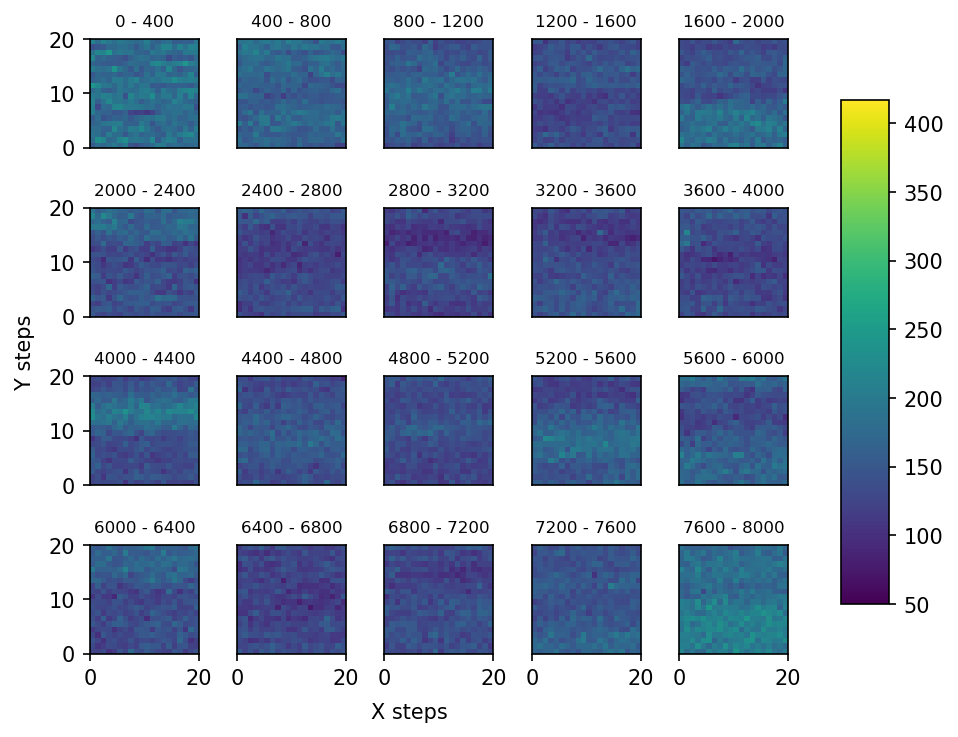

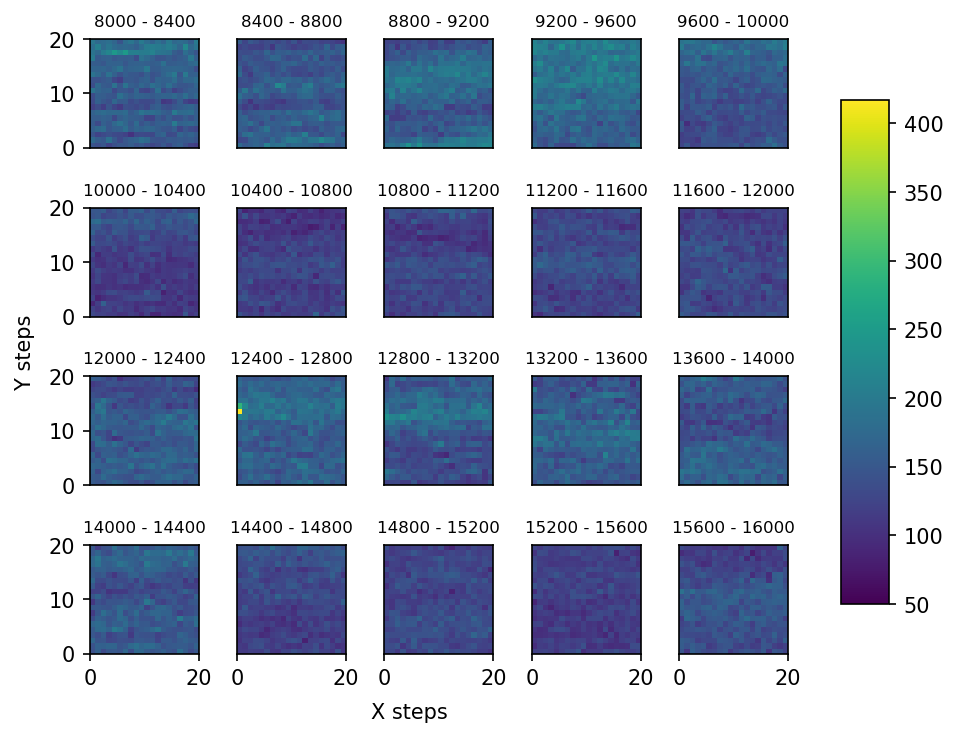

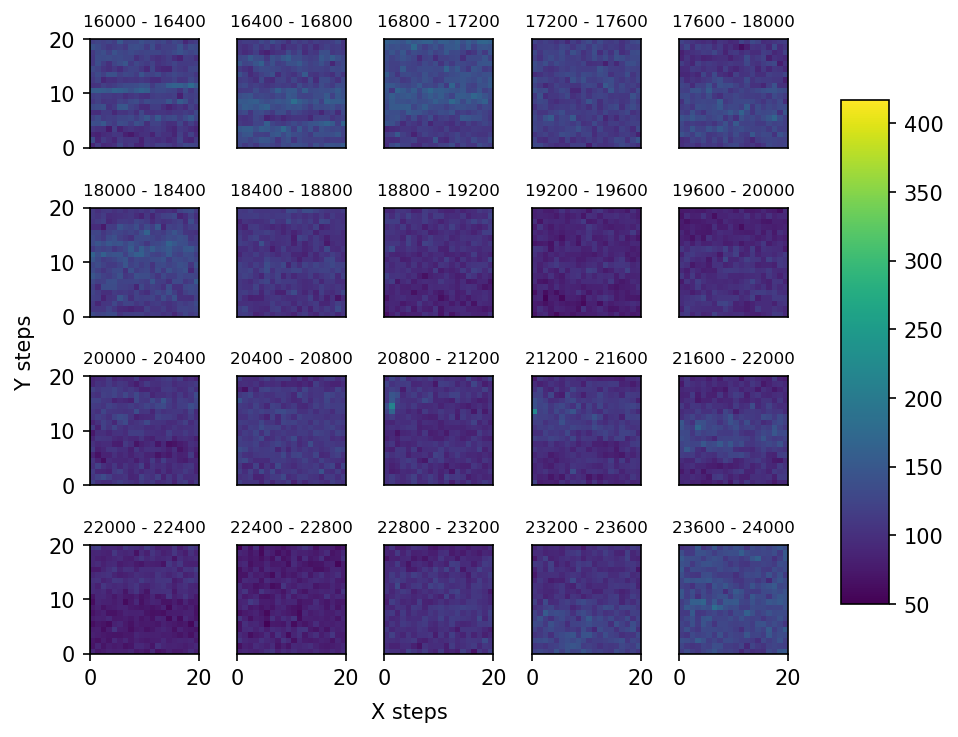

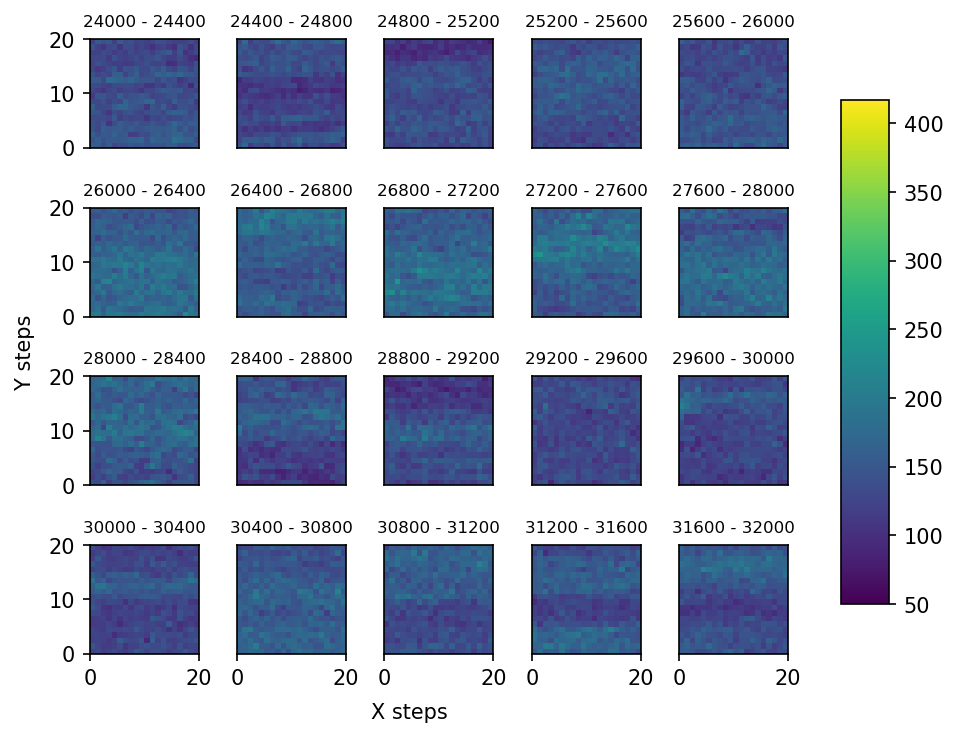

ValueError: cannot reshape array of size 361 into shape (20,20)

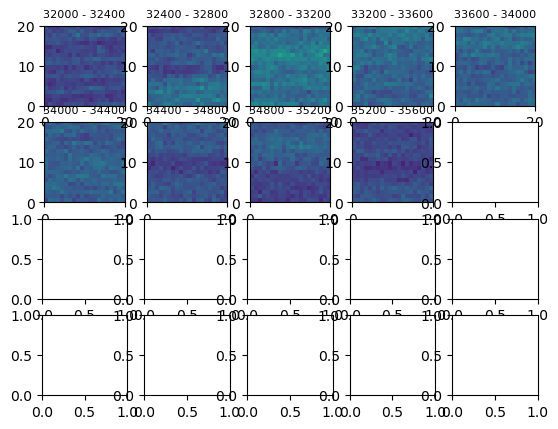

In [14]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, y

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    if nrows > 1:
        [ax.set_xticks([]) for ax in axes[:-1,:].flat]
        [ax.set_yticks([]) for ax in axes[:,1:].flat]
    else:
        pass

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

In [29]:
print(ztop_steps)

4


maxidx=236, maxct=1852.0, Vpd=0.0360107421875
coil VZbottom, VZtop, VX, VY = (1.1, -2.8600000000000003, -0.17142857142857146, -0.27)


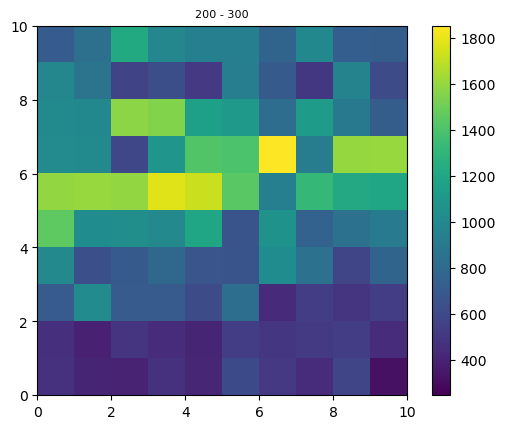

In [35]:
# local max for a given step range
step0 = xsteps*ysteps*(200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

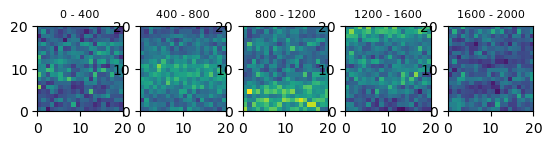

In [12]:
# this plotting procedure assumes that the order of the loops is ztop, zbottom, x, yb

ymin = xmin = 0
xmax = ymax = xsteps # assumes ysteps = xsteps

maxcounts = max(counts)
mincounts = min(counts)

for k in range(ztop_steps):
    
    # one figure for each ztop step. each will contain one subplot for each zbottom step
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
    
    for l,ax in enumerate(axes.flat):

#         ztop_step = k*ncols + col
#         zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for the kth ztop step and lth zbottom step
        step0 = ysteps*xsteps*zbottom_steps*k + l*ysteps*xsteps

        imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

        im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
        ax.set_aspect((ymax-ymin)/(xmax-xmin))
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)

#         if col > 0:
#             ax.set_yticks([])
#         if row < 3:
#             ax.set_xticks([])

    # turn off redundant axes ticks
    [ax.set_xticks([]) for ax in axes[:-1,:].flat]
    [ax.set_yticks([]) for ax in axes[:,1:].flat]

    fig.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    fig.text(0.4, 0, 'X steps', ha='center', va='center')
    fig.text(-0.0, 0.5, 'Y steps', ha='center', va='center', rotation='vertical')
    fig.dpi = 150
#         plt.savefig(datafile[:-4] + '_3D_' + str(k*(1+ncols) + l) + '.png', bbox_inches='tight')
#         plt.close()
    plt.show()

#     break

Text(0, 0.5, 'mW at switchyard')

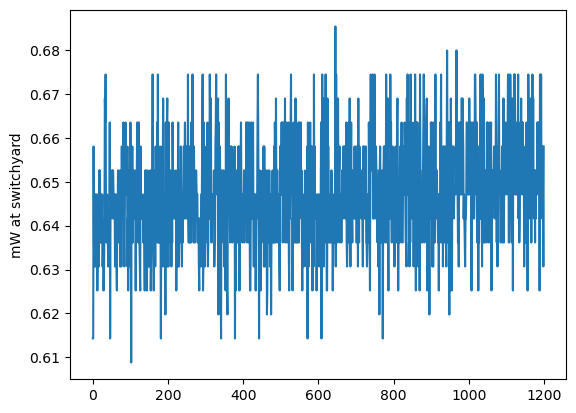

In [47]:
# plot the photodiode voltage and counts. produce same number of figures as above

minpd = min(pd_data)
maxpd = max(pd_data)
V_to_mW = lambda x: -0.195395 + 17.9214 * (x + 0.011)  # this accounts for a mismatch between what the Sampler reads and what
            # the multimeter that I used for the fit reads
            
fig,ax = plt.subplots()
# for i in range(len(counts)//(xsteps*ysteps*ncols*nrows)):
#     fig,axes = plt.subplots(nrows=2,ncols=1,sharex=True)
#     ax,ax2 = axes
#     imin = i*nrows*ncols*xsteps*ysteps
#     imax = (i+1)*nrows*ncols*xsteps*ysteps
ax.plot(V_to_mW(pd_data))
# ax.set_ylim((mincounts,maxcounts))
#     ax.set_ylabel("SPCM counts")
#     ax2.plot(pd_data[imin:imax])
#     ax2.set_ylim((minpd,maxpd))
# ax.set_ylabel("PD voltage")
ax.set_ylabel("mW at switchyard")

#     ax.set_title(f"steps i0={imin} to if={imax}")
#     ax2.set_xlabel("steps + i0")
#     plt.savefig(datafile[:-4] + '_counts_and_pd_' + str(i) + '.png', bbox_inches='tight')
#     plt.close()

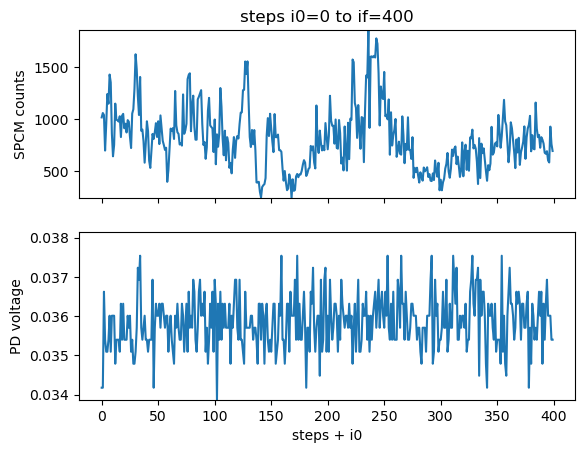

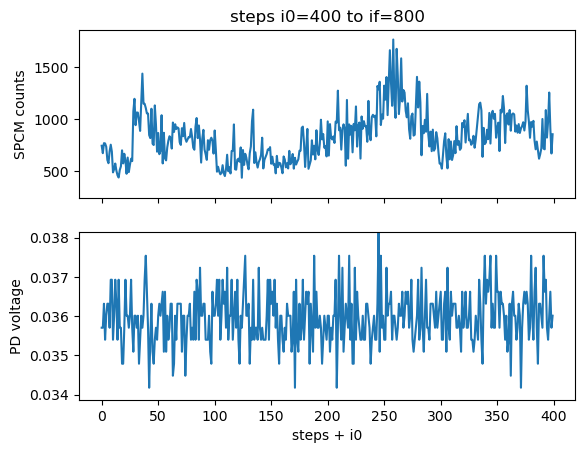

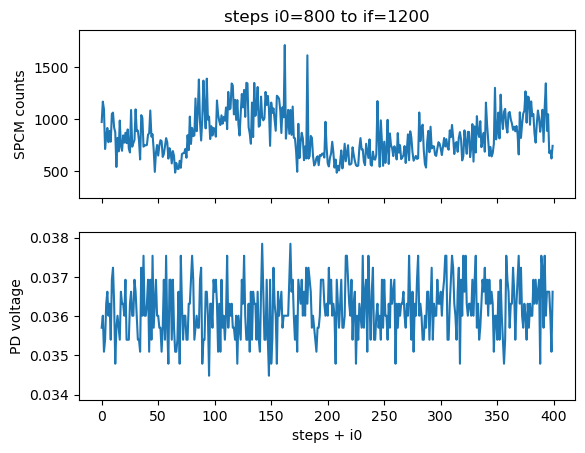

In [45]:
# plot the photodiode voltage and counts. produce same number of figures as above

minpd = min(pd_data)
maxpd = max(pd_data)
for i in range(len(counts)//(xsteps*ysteps*ncols*nrows)):
    fig,axes = plt.subplots(nrows=2,ncols=1,sharex=True)
    ax,ax2 = axes
    imin = i*nrows*ncols*xsteps*ysteps
    imax = (i+1)*nrows*ncols*xsteps*ysteps
    ax.plot(counts[imin:imax])
    ax.set_ylim((mincounts,maxcounts))
    ax.set_ylabel("SPCM counts")
    ax2.plot(pd_data[imin:imax])
    ax2.set_ylim((minpd,maxpd))
    ax2.set_ylabel("PD voltage")
    ax.set_title(f"steps i0={imin} to if={imax}")
    ax2.set_xlabel("steps + i0")
#     plt.savefig(datafile[:-4] + '_counts_and_pd_' + str(i) + '.png', bbox_inches='tight')
#     plt.close()

maxidx=18734, maxct=532.0, Vpd=0.0384521484375
coil VZbottom, VZtop, VX, VY = (0.72, -1.68, -0.61, -0.6225)


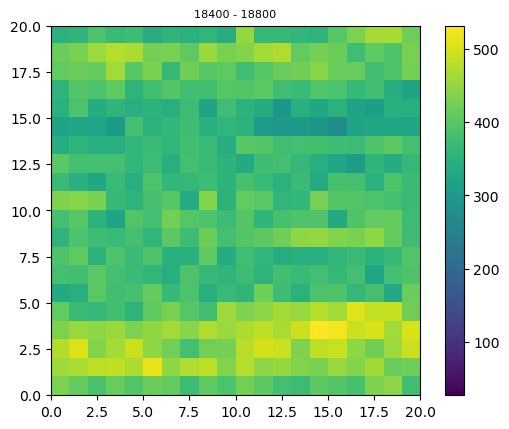

In [219]:
# find the max counts index then print out the coil settings and PD reading

maxct, maxidx = get_max_idx(counts)

print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

step0 = xsteps*ysteps*(maxidx//(xsteps*ysteps))

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

maxidx=41321, maxct=1055.0, Vpd=0.03936767578125
coil VZbottom, VZtop, VX, VY = (0.9199999999999999, -2.76, -0.13500000000000004, -0.021249999999999998)


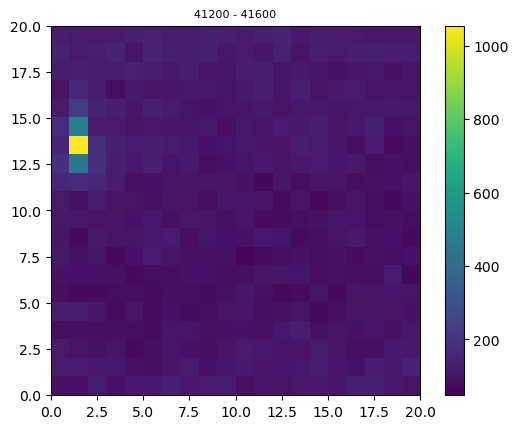

In [43]:
# local max for a given step range
step0 = xsteps*ysteps*(41200//(xsteps*ysteps)) #33600 # start here, as motivating by looking at the images we saved

fig,ax = plt.subplots()

imdata = counts[step0:step0+xsteps*ysteps].reshape((xsteps,ysteps))
maxct,maxidx = get_max_idx(counts[step0:step0+xsteps*ysteps])
maxidx += step0
print(f"maxidx={maxidx}, maxct={maxct}, Vpd={pd_data[maxidx]}")
print(f"coil VZbottom, VZtop, VX, VY = {zbottom_data[maxidx], ztop_data[maxidx], xdata[maxidx], ydata[maxidx]}")

im = ax.imshow(imdata, extent=[ymin, ymax, xmin, xmax], vmin=mincounts, vmax=maxcounts)
ax.set_aspect((ymax-ymin)/(xmax-xmin))
ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
fig.colorbar(im)

In [1]:
20**4

160000

## tests

In [14]:
i=0
j=0
k=0
l=0
row=0
col=2
i*xsteps + j + k*xsteps*ysteps*col + 

0

In [36]:
i=19
j=19
k=19/4
l=19/4
row=4
col=4
i*xsteps + j + k*xsteps*ysteps*col + l*(i*xsteps + j + k*xsteps*ysteps*col)*row

159980.0

In [31]:
20**4

160000

In [124]:
zbottom_steps//nrows

0

In [64]:
ztop_steps//ncols,zbottom_steps//nrows

(5, 5)

In [160]:
for k in range(ztop_steps//ncols):
    for l in range(zbottom_steps//nrows):
        print(k*(1+ncols) + l, k, l)

0 0 0
1 0 1
2 0 2
3 0 3
4 0 4
5 1 0
6 1 1
7 1 2
8 1 3
9 1 4
10 2 0
11 2 1
12 2 2
13 2 3
14 2 4
15 3 0
16 3 1
17 3 2
18 3 3
19 3 4
20 4 0
21 4 1
22 4 2
23 4 3
24 4 4


In [ ]:
for k in range(ztop_steps//ncols):
    for col in range(ncols):
        print(k*ncols+col)

In [193]:
k = l = 4
col = row = 3
ztop_step = k*ncols + col
zbottom_step = l*nrows + row

# the step where we start counting from to get the counts at x and y steps
# for a given ztop,zbottom
step0 = ysteps*xsteps*zbottom_steps*ztop_step + zbottom_step*ysteps*xsteps
print(step0+20**2, 20**4)

160000 160000


In [14]:
i=0
j=0
k=0
l=0
row=0
col=2
i*xsteps + j + k*xsteps*ysteps*col + 

0

In [36]:
i=19
j=19
k=19/4
l=19/4
row=4
col=4
i*xsteps + j + k*xsteps*ysteps*col + l*(i*xsteps + j + k*xsteps*ysteps*col)*row

159980.0

In [31]:
20**4

160000

In [124]:
zbottom_steps//nrows

0

In [64]:
ztop_steps//ncols,zbottom_steps//nrows

(5, 5)

In [72]:
for k in range(ztop_steps//ncols):
    for col in range(ncols):
        print(k*ncols+col)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


In [83]:
k = l = 4
col = row = 3
ztop_step = k*ncols + col
zbottom_step = l*nrows + row

# the step where we start counting from to get the counts at x and y steps
# for a given ztop,zbottom
step0 = ysteps*xsteps*zbottom_steps*ztop_step + zbottom_step*ysteps*xsteps
print(step0+20**2, 20**4)

159600 160000


In [129]:
k = 0
l = 0
col = 0
row = 0
ztop_step = k*ncols + col
zbottom_step = l*nrows + row

# the step where we start counting from to get the counts at x and y steps
# for a given ztop,zbottom
step0 = ysteps*xsteps*zbottom_steps*ztop_step + zbottom_step*ysteps*xsteps
print(step0)

0


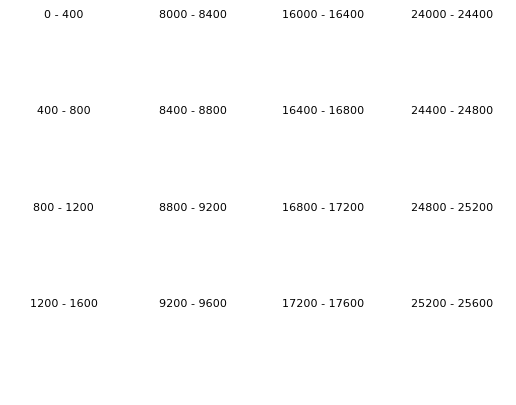

In [204]:
k = 0
l = 0
fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
for row in range(nrows):
    for col in range(ncols):
        ax = axes[row,col]
        ztop_step = k*ncols + col
        zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for a given ztop,zbottom
        step0 = ysteps*xsteps*zbottom_steps*ztop_step + zbottom_step*ysteps*xsteps
        ax.plot([],[])
        ax.set_axis_off()
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
# print(step0)

In [205]:
steps = []
for k in range(ztop_steps//ncols):
    for l in range(zbottom_steps//nrows):
        for row in range(nrows):
            for col in range(ncols):
#                 ax = axes[row,col]
                ztop_step = k*ncols + col
                zbottom_step = l*nrows + row

                # the step where we start counting from to get the counts at x and y steps
                # for a given ztop,zbottom
                step0 = ysteps*xsteps*zbottom_steps*ztop_step + zbottom_step*ysteps*xsteps
                steps.append(step0)
#                 ax.plot([],[])
#                 ax.set_axis_off()
#                 ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
        # print(step0)
steps = sorted(steps)

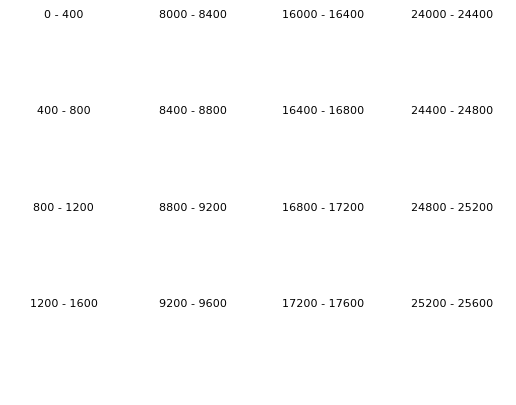

In [204]:
f
fig, axes = plt.subplots(nrows=nrows,ncols=ncols)
for row in range(nrows):
    for col in range(ncols):
        ax = axes[row,col]
        ztop_step = k*ncols + col
        zbottom_step = l*nrows + row

        # the step where we start counting from to get the counts at x and y steps
        # for a given ztop,zbottom
        step0 = ysteps*xsteps*zbottom_steps*ztop_step + zbottom_step*ysteps*xsteps
        ax.plot([],[])
        ax.set_axis_off()
        ax.set_title(f"{step0} - {step0+xsteps*ysteps}",fontsize=8)
# print(step0)

Text(0, 0.5, 'y')

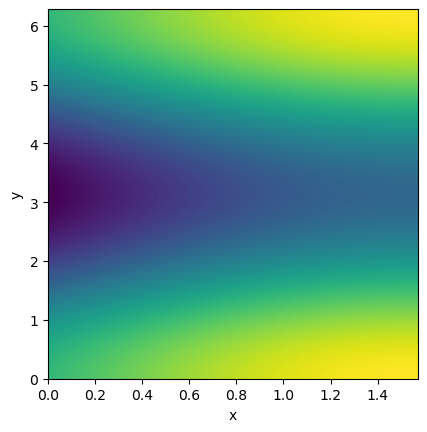

In [98]:
nx = 200
ny = 50
xpts = np.linspace(0,2*np.pi,nx)
ypts = np.linspace(0,np.pi/2,ny)
data = np.zeros(nx*ny)
step = 0
for x in xpts:
    for y in ypts:
        data[step] = np.cos(x)+np.sin(y)
        step += 1
fig,ax = plt.subplots()
ax.imshow(data.reshape((nx,ny)),extent=[ypts[0],ypts[-1],xpts[0],xpts[-1]])
ax.set_aspect((ypts[-1]-ypts[0])/(xpts[-1]-xpts[0]))
ax.set_xlabel("x")
ax.set_ylabel("y")